<a href="https://colab.research.google.com/github/rouhinmitra/CA_missing_freshet/blob/main/Deficit_and_ET_exploration.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [4]:
import matplotlib
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
import pandas as pd
! pip install geopandas
import geopandas as gpd
import numpy as np
# %config InlineBackend.figure_format = 'retina'
# %matplotlib inline
from matplotlib import gridspec
from mpl_toolkits.axes_grid1 import make_axes_locatable
matplotlib.rcParams.update(matplotlib.rcParamsDefault)
! pip install hydrofunctions
import hydrofunctions as hf
import pickle
import matplotlib.font_manager as fm
!wget https://github.com/Phonbopit/sarabun-webfont/raw/master/fonts/thsarabunnew-webfont.ttf
fm.fontManager.ttflist += fm.createFontList(['thsarabunnew-webfont.ttf'])
matplotlib.rc('font', family='TH Sarabun New')
plt.rcParams.update({'font.size': 12})
from shapely.geometry import Polygon

--2022-04-12 23:37:50--  https://github.com/Phonbopit/sarabun-webfont/raw/master/fonts/thsarabunnew-webfont.ttf
Resolving github.com (github.com)... 140.82.121.4
Connecting to github.com (github.com)|140.82.121.4|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/Phonbopit/sarabun-webfont/master/fonts/thsarabunnew-webfont.ttf [following]
--2022-04-12 23:37:50--  https://raw.githubusercontent.com/Phonbopit/sarabun-webfont/master/fonts/thsarabunnew-webfont.ttf
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 98308 (96K) [application/octet-stream]
Saving to: ‘thsarabunnew-webfont.ttf.1’

thsarabunnew-webfon 100%[===================>]  96.00K  --.-KB/s    in 0.004s  

2022-04-12 23:37:50 (21.3 MB/s) - 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: MatplotlibDeprecationWarning: 
The createFontList function was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use FontManager.addfont instead.


## Earth Engine authenticate and initialize

In [6]:
!earthengine authenticate

To authorize access needed by Earth Engine, open the following URL in a web browser and follow the instructions. If the web browser does not start automatically, please manually browse the URL below.

    https://accounts.google.com/o/oauth2/auth?client_id=517222506229-vsmmajv00ul0bs7p89v5m89qs8eb9359.apps.googleusercontent.com&scope=https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fearthengine+https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdevstorage.full_control&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&response_type=code&code_challenge=Ys7mdLGlOFCLCxI3WTw_V5hg2YffQG8k7kQzombQi84&code_challenge_method=S256

The authorization workflow will generate a code, which you should paste in the box below. 
Enter verification code: 4/1AX4XfWiM-r9YmI6Nukat0AcsW4v3tXysT6ERQaAg_OoovVJu0ZEuultzG3w

Successfully saved authorization token.


In [7]:

# # here are the GEE declarations. 
import ee
ee.Initialize()

*** Earth Engine *** Python client initialized


## Import information about study sites

In [8]:
# load in shapefile of gage locations and attributes
loc = 'https://raw.githubusercontent.com/lapidesd/CA_missing_freshet/main/Data/california_site_list.zip'
gages = gpd.read_file(loc).to_crs(epsg = 4326)

# load in shapefile of watershed boundaries
loc = 'https://raw.githubusercontent.com/lapidesd/CA_missing_freshet/main/Data/california_site_watershed_boundaries.zip'
basin_outlines = gpd.read_file(loc).to_crs(epsg = 4326)

# merge data together
gage_info = gages.merge(basin_outlines,left_on='SITE_NO',
            right_on='SITE_NO')

# US state map from https://catalog.data.gov/dataset/tiger-line-shapefile-2017-nation-u-s-current-state-and-equivalent-national
loc = 'https://raw.githubusercontent.com/lapidesd/CA_missing_freshet/main/Data/state_outline.zip'
state_outline = gpd.read_file(loc).to_crs(epsg = 4326)
state_outline = state_outline[state_outline.STUSPS=='CA']

## Import SWE data from SNODAS (Data from 2003 to 2021) 
https://nsidc.org/data/g02158#:~:text=SNODAS%20is%20a%20modeling%20and,support%20hydrologic%20modeling%20and%20analysis

In [11]:
# import processed SNODAS data (basin means for each study site)
loc = 'https://raw.githubusercontent.com/lapidesd/CA_missing_freshet/main/Data/snodas_basin_data1.csv'
snodas_data = pd.read_csv(loc)
snodas_data['date'] = pd.to_datetime(snodas_data.date)
snodas_data = snodas_data.set_index('date').sort_index()

,swe,sitenum,sublimation,snowmelt
date,,,,
2003-10-01,0.0,10265150,NaN,NaN
2003-10-01,0.0,11189500,NaN,NaN
2003-10-01,0.0,11203580,NaN,NaN
2003-10-01,0.0,11204100,NaN,NaN
2003-10-01,0.0,11264500,NaN,NaN
...,...,...,...,...
2021-09-30,0.0,10336645,NaN,NaN
2021-09-30,0.0,10336660,NaN,NaN
2021-09-30,0.0,10336676,NaN,NaN


In [14]:
# process data from csv format to format with one column for each gage, rows are dates

swe_data = ''

for gage in snodas_data.sitenum.drop_duplicates():
  snowdat = snodas_data[snodas_data.sitenum==gage].drop(columns='sitenum')
  snowdat['wy'] = np.where(snowdat.index.month.isin([10,11,12]),
                           snowdat.index.year+1,snowdat.index.year)    
  if len(swe_data)==0:
    swe_data = snowdat[['swe']].rename(columns={'swe':gage}).dropna()
  else:
    swe_data = swe_data.merge(snowdat[['swe']].rename(columns={'swe':gage}).dropna(),
                              left_index=True,right_index=True).drop_duplicates()

In [20]:
print(swe_data.head(),swe_data.tail(),swe_data.shape)

            10265150  11189500  11203580  11204100  11264500  11266500  \
date                                                                     
2003-10-01  0.000000       0.0       0.0       0.0  0.000000  0.000000   
2003-11-04  0.825455       0.0       0.0       0.0  4.122478  3.799350   
2003-11-05  0.410909       0.0       0.0       0.0  3.462536  3.266450   
2003-11-06  0.185455       0.0       0.0       0.0  2.681556  2.562145   
2003-11-07  0.090909       0.0       0.0       0.0  2.223343  2.017059   

            11383500  10308783  10336645  10336660  10336676  10336780  \
date                                                                     
2003-10-01  0.000000       0.0       0.0       0.0       0.0       0.0   
2003-11-04  0.565111       0.0       0.0       0.0       0.0       0.0   
2003-11-05  0.601966       0.0       0.0       0.0       0.0       0.0   
2003-11-06  0.289926       0.0       0.0       0.0       0.0       0.0   
2003-11-07  0.061425       0.0       

In [32]:
# calculate melt rate as average decrease rate per day for all days
# when SWE decreased in a given year

swediff = swe_data.diff() #-- Difference in swe in each day 
# Classifying the water year for each row 
swediff['wy'] = np.where(swediff.index.month.isin([10,11,12]), 
                          swediff.index.year+1,swediff.index.year)
#-- Increase in swe is changed to 0 and decrease in swe is stored as the amount of decrease. Increase in Swe means nothing happens to the deficit 
# For every wy the net decrease in swe is calculated for the entire snow season (oct 1st to may end)
for c in swediff.columns:
  swediff[c] = np.where(swediff[c]<0,0,swediff[c])
totalmelts = swediff.groupby('wy').sum()
swedays = swediff
#Calculate meltrates as the amount of swe decrease in a year/ the no of days swe has melted 
for c in swedays.columns:
  if c !='wy':
    swedays[c] =  np.where(swedays[c]==0,0,1)
meltrates = totalmelts/swedays.groupby('wy').sum()
meltrates.to_csv('melt_rates.csv')

In [49]:
swediff = swe_data.diff() 
for c in swediff.columns:
  swediff[c] = np.where(swediff[c]<0,0,swediff[c])
swediff
for c in swedays.columns:
  print(c)

10265150
11189500
11203580
11204100
11264500
11266500
11383500
10308783
10336645
10336660
10336676
10336780
10343500
wy


## Get ET data from Earth Engine

In [ ]:
# convert geopandas basin objects into geojson for Earth Engine

geos1 = gage_info.geometry_y.values
geos = []
for i in range(len(geos1)):
  try:
    geo_obj = ee.Geometry.Polygon(list(geos1[i].exterior.coords))
  except:
    geos1[i] = geos1[i][-1]
    geo_obj = ee.Geometry.Polygon(list(geos1[i].exterior.coords))
  geos.append(geo_obj)
names = gage_info.STATION_NM.values

start='2000-10-01'
stop='2021-10-01'

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: ShapelyDeprecationWarning: __getitem__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  if __name__ == '__main__':


In [ ]:
# code adapted from David Dralle
# Flux is stored as 100*mm/day, and duration between samples is 8 days
multiplier = 8.0 
dataset = ee.ImageCollection("projects/pml_evapotranspiration/PML/OUTPUT/PML_V2_8day_v016");
scale = 0.01

# mapper for getting single ET raster for each timestep
def sumpml(image):
  # ET bands into one band
  temp = image.select('Es').add(image.select('Ec')).add(image.select('Ei')).multiply(scale)

  #get the first band of this new temporary image, rename it to 'ET', 
  #reproject it, and then multiply by multiplier
  temp = temp.select([0], ['ET']).reproject(
      crs='EPSG:4326',scale=10000
      ).multiply(multiplier)

  #temp should now be total ET in mm over the time window between images
  #assign the datetime stamp and the index from the original image
  temp = temp.set('system:time_start', image.get('system:time_start'))
  temp = temp.set('system:index', image.get('system:index'))
  return temp

#now, actually map the pml image collection w/ this function,
# in order to make a new combined ET image collection
et = ee.ImageCollection(dataset.map(sumpml).select('ET')).filter(ee.Filter.date(start, stop))
et = et.toBands()

In [ ]:
# for each study basin, get basin-average ET, P

data = {}
for i,geo in enumerate(geos):
  ft = et.reduceRegion(ee.Reducer.mean(), geo, 1000)
  vals = ft.getInfo()
  dates = pd.to_datetime([item.split('_')[0] for item in list(vals)])
  etvals = [item for item in vals.values()]
  etdf = pd.DataFrame({'ET':etvals},index=dates)

  # first linearly interpolate to daily and then resample to monthly
  etdf = etdf.resample('M').sum()

  dataset = ee.ImageCollection("OREGONSTATE/PRISM/AN81m").filter(ee.Filter.date(start, stop))
  ppt = dataset.select('ppt').toBands()
  ft = ppt.reduceRegion(ee.Reducer.mean(), geo, 4000)
  vals = ft.getInfo()
  dates = pd.to_datetime([item.split('_')[0] for item in list(vals)],format='%Y%m')
  pptvals = [item for item in vals.values()]
  pptdf = pd.DataFrame({'P':pptvals},index=dates).resample('M').sum()
  
  # Combine
  df = pd.concat([etdf, pptdf],axis=1)
  # df['W'] = df[['P','ET']].min(axis=1)
  df['wy'] = [item.year if item.month<10 else item.year+1 for item in df.index]
  df['sumP'] = df.groupby('wy')['P'].cumsum()

  data[names[i]] = df



In [ ]:
# # import modis data--this is very slow--just import finished data in next block

# # code below adapted from https://colab.research.google.com/github/google/earthengine-community/blob/master/tutorials/intro-to-python-api-guiattard/index.ipynb

# modis = ee.ImageCollection('MODIS/006/MOD16A2')

# # Initial date of interest (inclusive).
# i_date = '2000-10-01'

# # Final date of interest (exclusive).
# f_date = '2021-10-01'

# pet_modis = modis.select('PET').filterDate(i_date, f_date) #kg/m^2/8day
# et_modis = modis.select('ET').filterDate(i_date, f_date) #kg/m^2/8day

# scale = 1000  # scale in meters

# def addTime(image) :
#   return image.addBands(image.metadata('system:time_start'))

# def reduceregions(image):
#   meanET = image.reduceRegion(ee.Reducer.mean(),geo,1000)
#   return image.set(meanET)

# modis_data = {}

# for i,geo in enumerate(geos):
#   # et_geo = et_modis.filterBounds(geo).filterDate('2000-10-1','2021-10-01').select('ET')
#   # et_region = et_geo.map(addTime).map(reduceregions)

#   # etvals = et_region.aggregate_array('ET').getInfo()
#   # timevals = et_region.aggregate_array('system:time_start').getInfo()
#   # timevals = [ee.Date(t).format('YYYY-MM-dd').getInfo() for t in timevals]
#   et_modis = et_modis.select('ET')
#   et1 = et_modis.toBands()
#   ft = et1.reduceRegion(ee.Reducer.mean(), geo, 500)
#   vals = ft.getInfo()
#   dates = pd.to_datetime([item[:10].replace('_','-')
#                                       for item in list(vals)])
#   etvals = [item for item in vals.values()]
#   etdf = pd.DataFrame({'ET':etvals},index=dates)
#   etdf = etdf.resample('M').sum()
#   etdf = etdf/8*1000/100**3*1000
#   etdf = etdf.resample('M').sum()

#   dataset = ee.ImageCollection("OREGONSTATE/PRISM/AN81m").filter(ee.Filter.date(start, stop))
#   ppt = dataset.select('ppt').toBands()
#   ft = ppt.reduceRegion(ee.Reducer.mean(), geo, 4000)
#   vals = ft.getInfo()
#   dates = pd.to_datetime([item.split('_')[0] for item in list(vals)],format='%Y%m')
#   pptvals = [item for item in vals.values()]
#   pptdf = pd.DataFrame({'P':pptvals},index=dates).resample('M').sum()
  
#   # Combine
#   df = pd.concat([etdf, pptdf],axis=1)
#   # df['W'] = df[['P','ET']].min(axis=1)
#   df['wy'] = [item.year if item.month<10 else item.year+1 for item in df.index]
#   df['sumP'] = df.groupby('wy')['P'].cumsum()

# #   # This is not where deficit is calculated in the code
# #   deficit = [0]
# #   counter = 0
# #   # Wang-Erlandsson deficit calculation
# #   for idx,row in df.iterrows():
# #     A = row.ET - row.P
# #     next = np.max([0, deficit[counter] + A])
# #     deficit.append(next)
# #     counter = counter + 1
# #   df['D'] = deficit[1:]
  # modis_data[names[i]] = df

# import pickle
# output = open('modis_data.pkl', 'wb')
# pickle.dump(modis_data,output)
# from google.colab import files
# files.download('modis_data.pkl')

# for key in modis_data.keys():
#   sitenum = gages[gages.STATION_NM==key].SITE_NO.values[0]
#   modis_data[key].to_csv('modis_data_'+sitenum+'.csv')

In [ ]:
# import MODIS data for each site, save in dictionary

base_loc = 'https://raw.githubusercontent.com/lapidesd/CA_missing_freshet/main/Data/MODIS_and_PRISM_data/modis_data_'

modis_data = {key:0 for key in gages.STATION_NM.values}

for site in gages.STATION_NM.values:
  sitenum = gages[gages.STATION_NM==site].SITE_NO.values[0]
  site_modis = pd.read_csv(base_loc+sitenum+'.csv')
  site_modis['Unnamed: 0'] = pd.to_datetime(site_modis['Unnamed: 0'])
  site_modis = site_modis.set_index('Unnamed: 0')
  modis_data[site] = site_modis

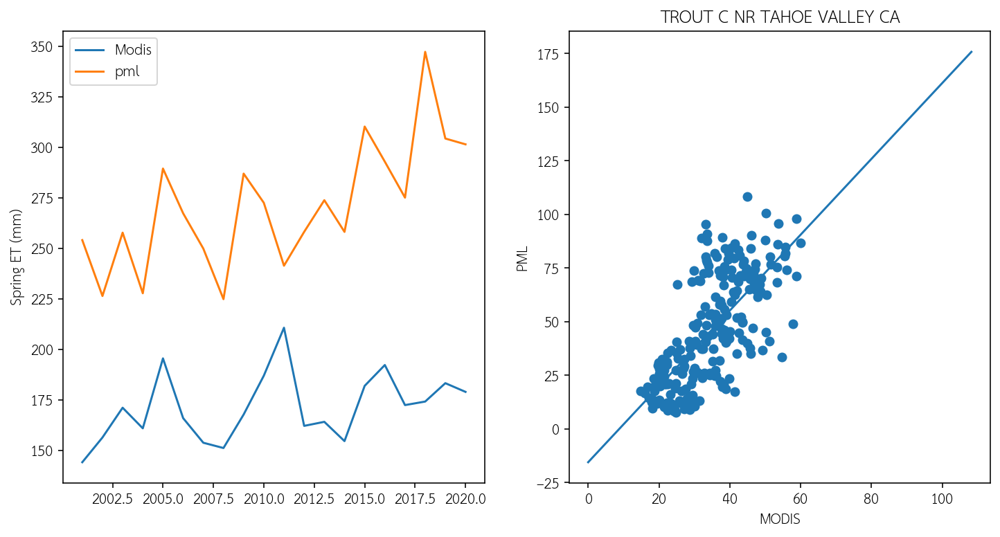

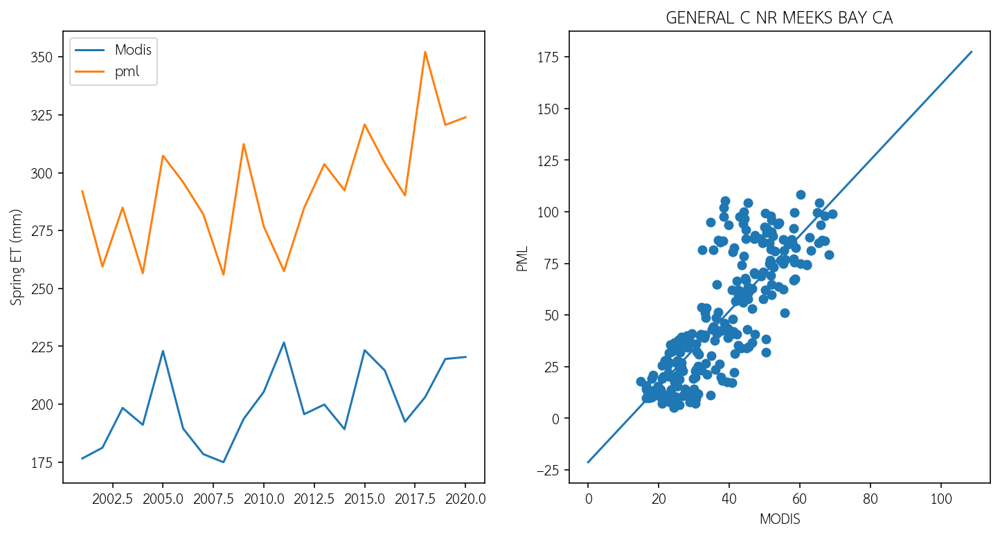

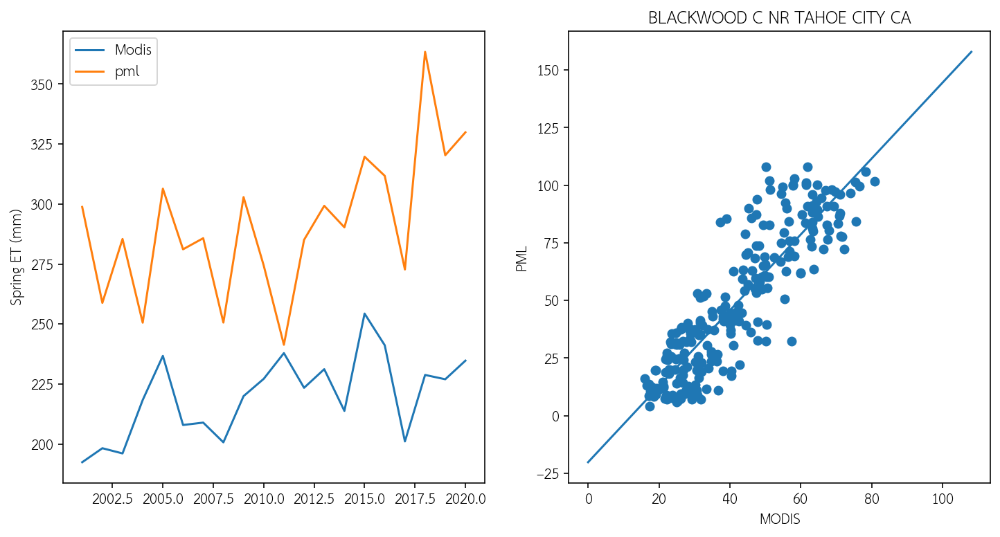

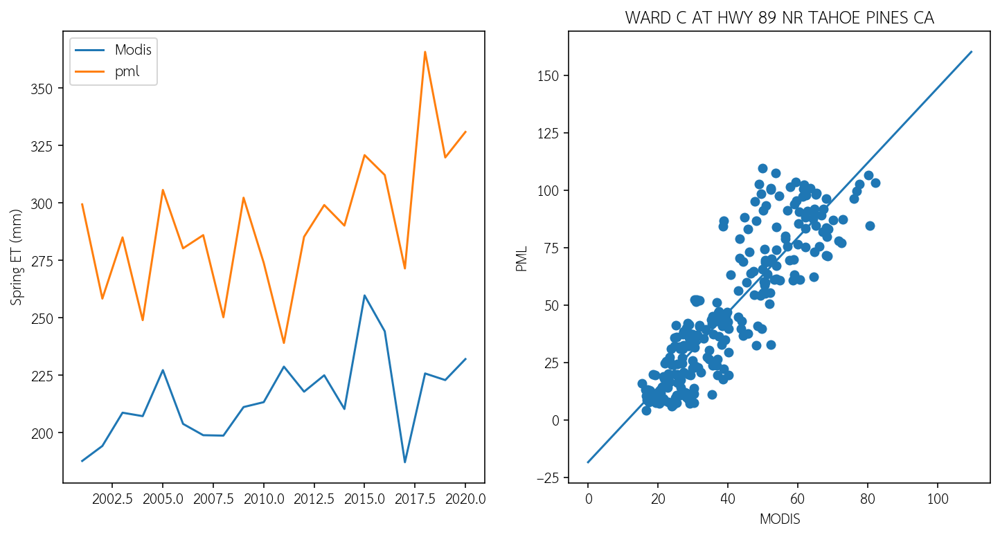

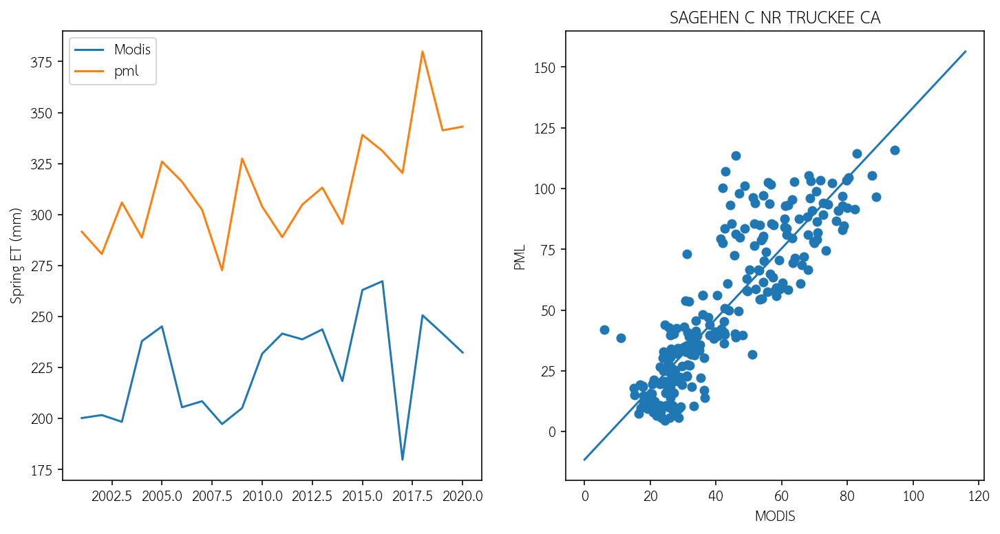

...

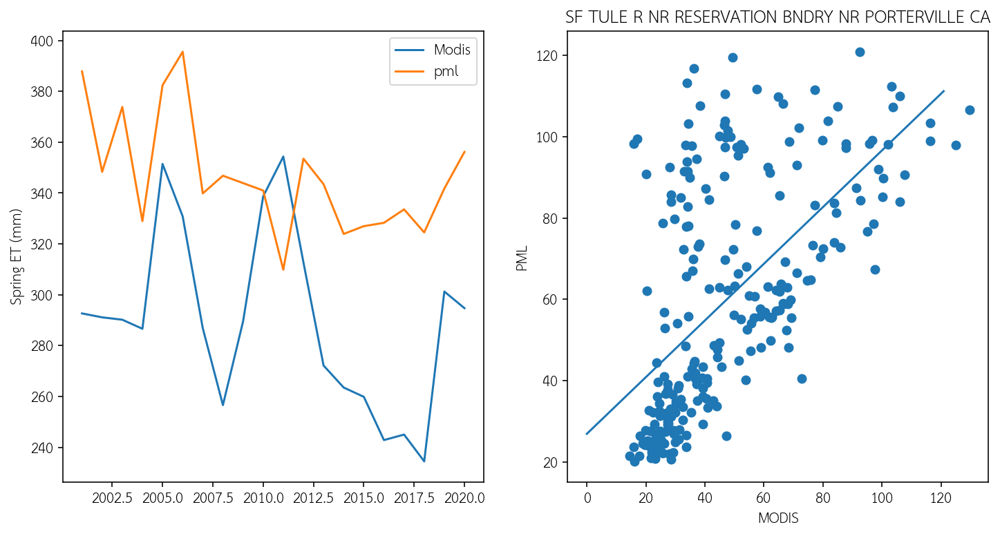

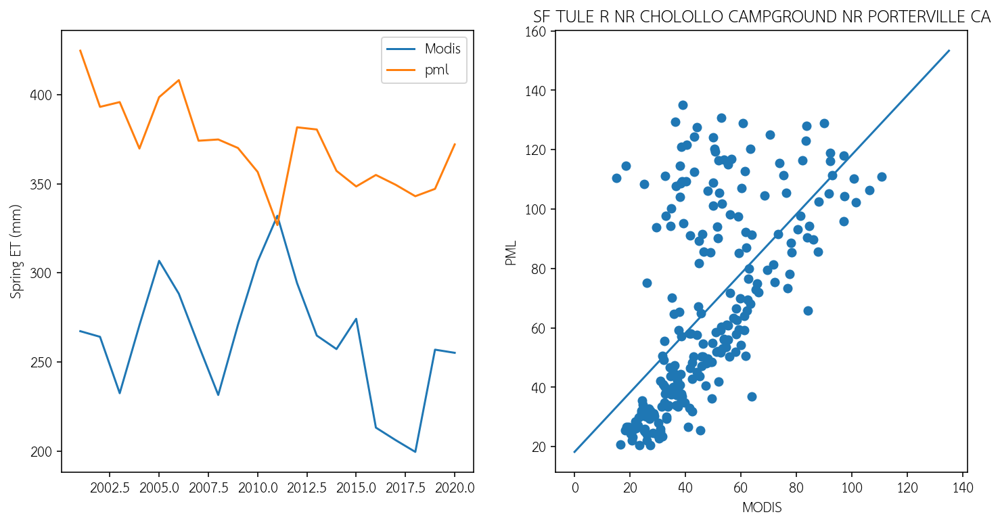

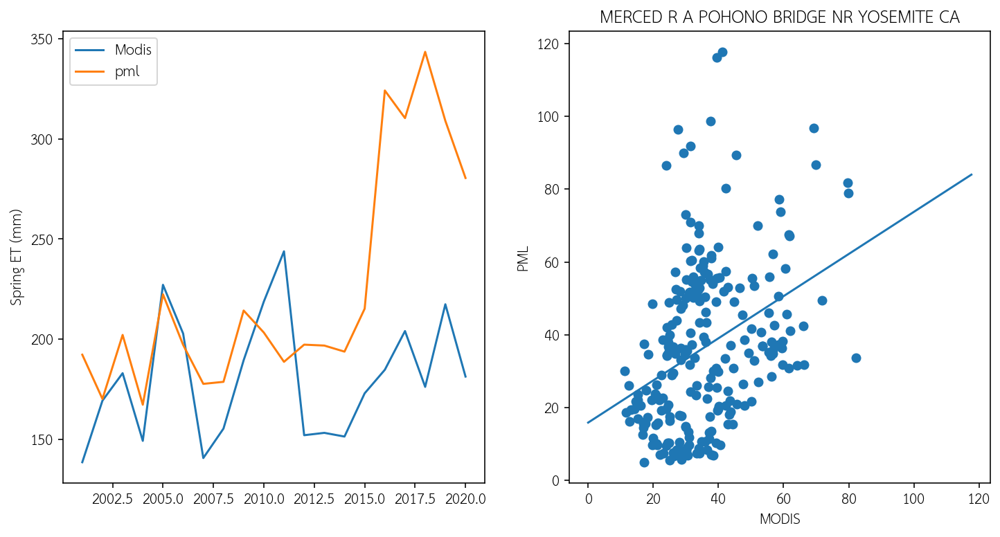

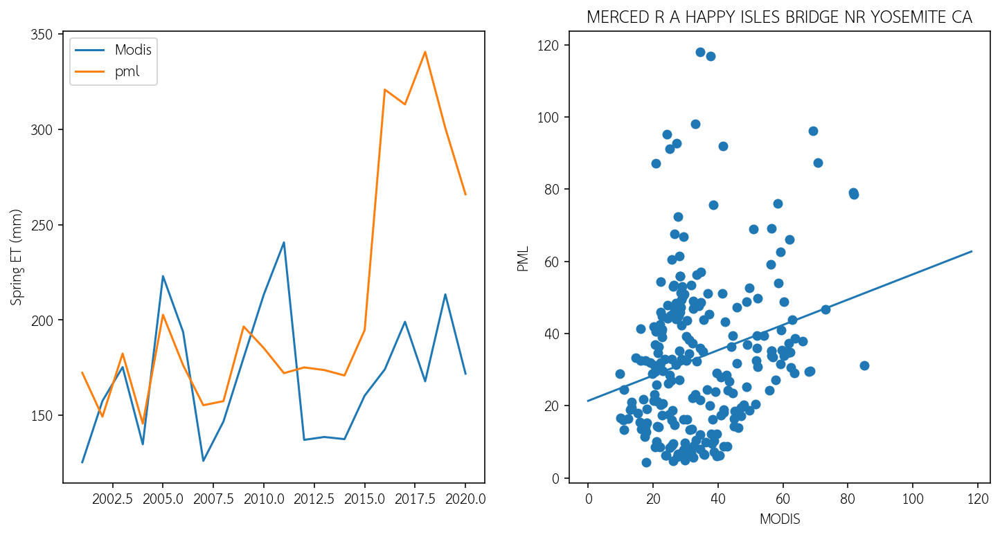

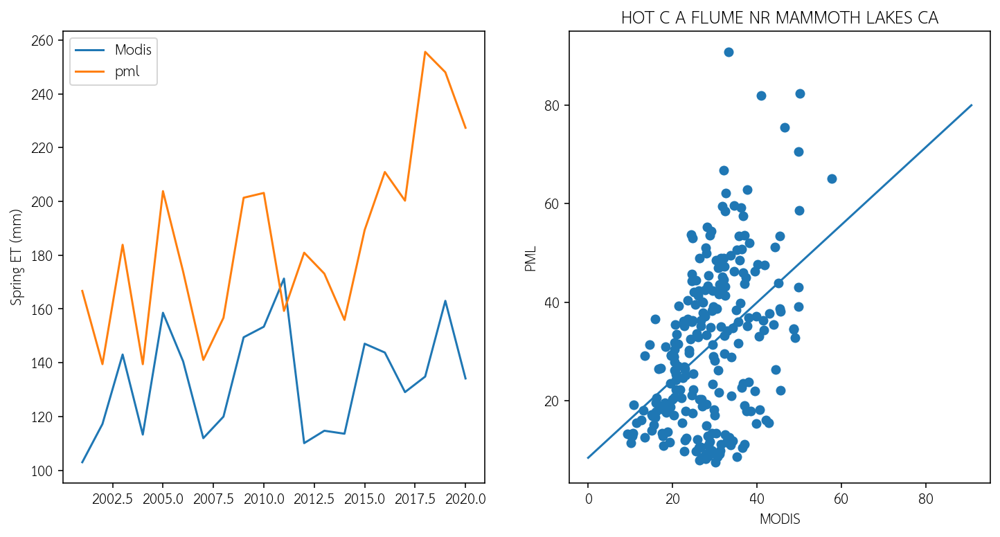

In [ ]:
# calculate parameters for bias-correcting MODIS data based on PML V2

def func(modis,a,b):
  return a*modis+b

r2vals=[]
modis_correct_params = {}
for site in gages.STATION_NM.values:
  fig, ax = plt.subplots(1,2,figsize = (12,6))

  # combine MODIS and PML ET data into single dataframe
  pml = data[site][['ET']].rename(columns={'ET':'pml'})
  modis = modis_data[site][['ET']].rename(columns={'ET':'modis'})
  merged = pml.merge(modis,left_index=True,
                     right_index=True,how='inner').dropna()

  # find a linear fit between PML and MODIS
  popt, pcov = curve_fit(func, merged.modis, merged.pml)
  xvals = np.linspace(0,max(merged.pml))
  ypredict = func(xvals,*popt)

  # plot results
  ax1=ax[0]
  merged['wy'] = np.where(merged.index.month.isin([10,11,12]),
                          merged.index.year+1,merged.index.year)
  merged_spring = merged[merged.index.month.isin([4,5,6,7])].groupby('wy').sum()
  ax1.plot(merged_spring.modis,label='Modis')
  ax1.plot(merged_spring.pml,label='pml')
  ax1.legend()
  ax1.set_ylabel('Spring ET (mm)')

  ax0=ax[1]
  ax0.plot(xvals, ypredict)
  ax0.scatter(merged.modis,merged.pml)
  ax0.set_xlabel('MODIS')
  ax0.set_ylabel('PML')
  ax0.set_title(site)

  # find R2 value
  residuals = merged.pml - func(merged.modis, *popt)
  ss_res = np.sum(residuals**2)
  ss_tot = np.sum((merged.pml-np.mean(merged.pml))**2)
  r_squared = 1 - (ss_res / ss_tot)
  std = np.std(residuals)
  r2vals.append(r_squared)

  # save parameters
  modis_correct_params[site] = popt

In [ ]:
# print median R2 value for bias-correcting linear fit
np.nanpercentile(r2vals,50)

0.41687073407123143

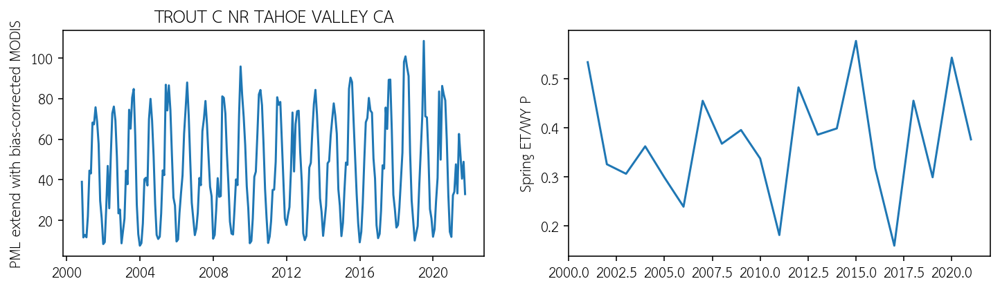

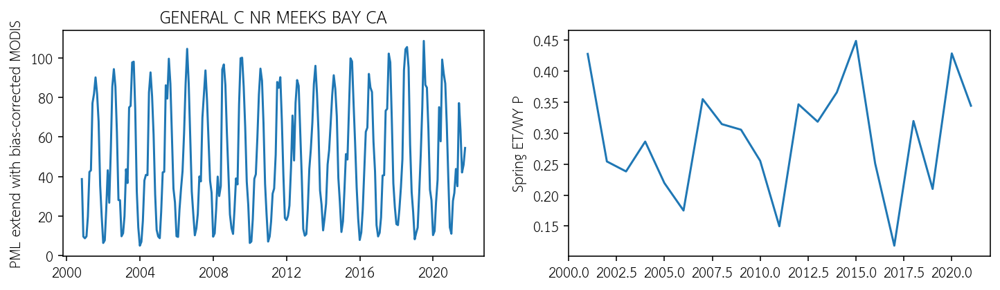

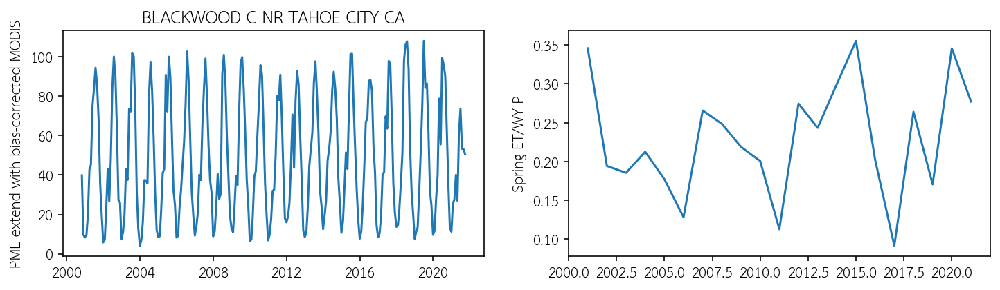

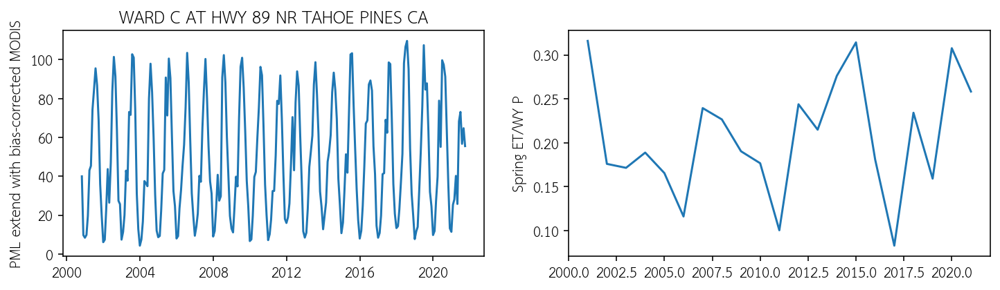

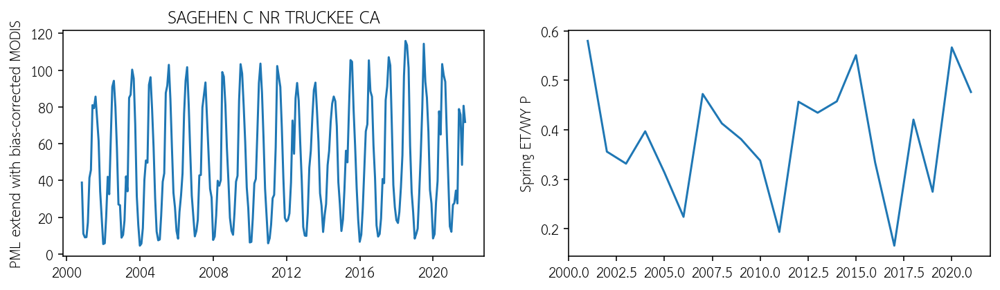

...

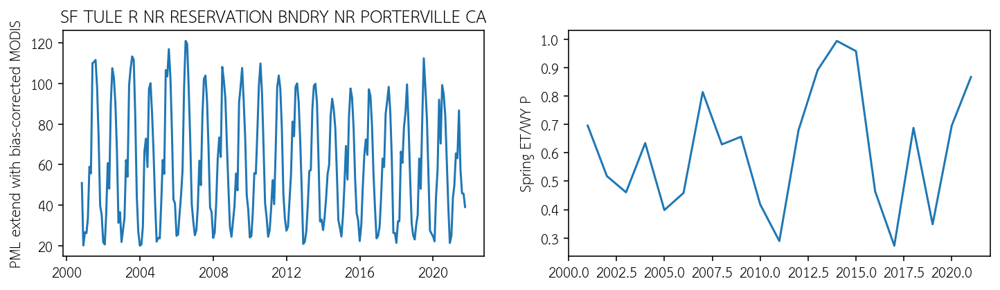

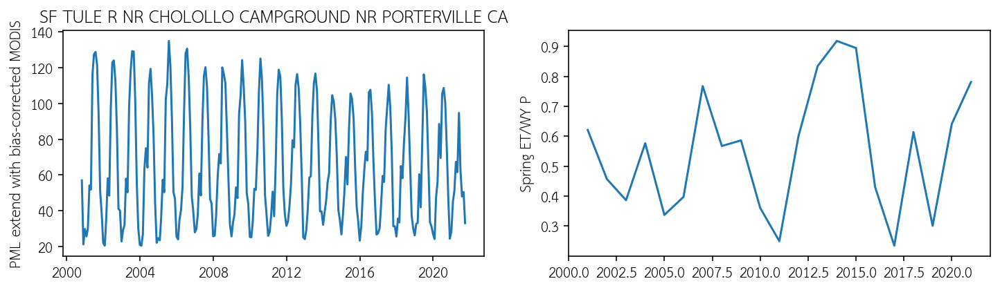

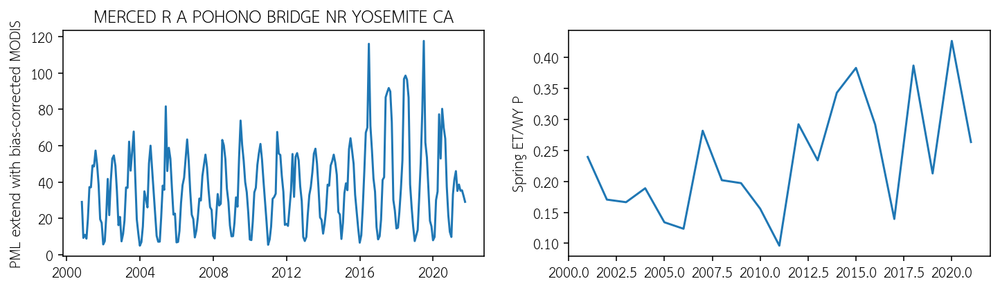

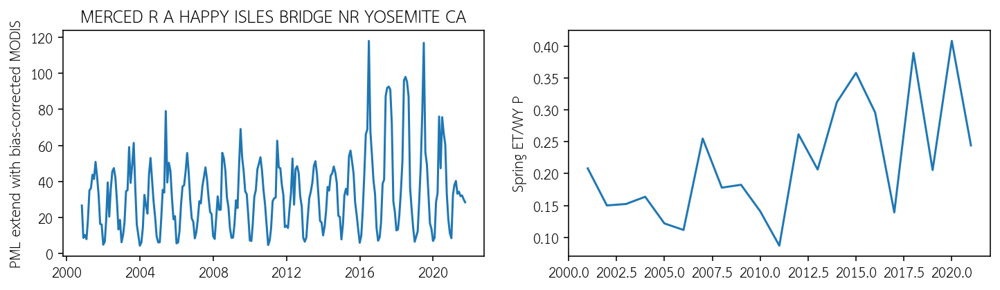

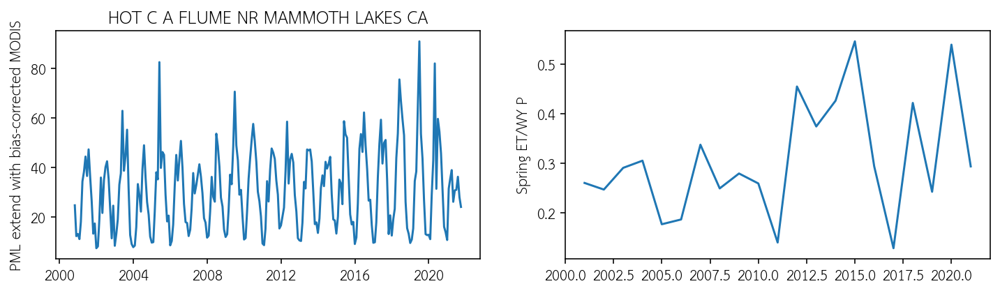

In [ ]:
# since PML dataset ends in 2020, extend with bias-corrected MODIS

for i in range(len(gages)):
  
  # get MODIS data
  site = gages.STATION_NM.values[i]
  sitedata = modis_data[site]
  etdf = sitedata[['ET','wy']]
  etdf = etdf.resample('M').sum()
  
  # get PML data
  sitedata_pml = data[site]
  etdf_pml = sitedata_pml[['ET','wy']].resample('M').sum()
  etdf_pml = etdf_pml[etdf_pml.ET>0]
  etdf = etdf.reset_index()[~(etdf.reset_index()['Unnamed: 0'].isin(etdf_pml.index))]

  # use parameters from linear fit (above) to extend PML using bias-corrected MODIS
  etdf['ET'] = func(etdf.ET,*modis_correct_params[site])
  etdf = etdf.set_index('Unnamed: 0')
  df = pd.concat([etdf_pml,etdf])
  wys = df.wy.drop_duplicates()
  ets = []
  for yr in wys:
    ets.append(df.loc['04-01-'+str(yr):'07-01-'+str(yr)].ET.sum())
  data[site]['ET_with_modis'] = df.ET

  # plot resulting ET timeseries
  fig,axs = plt.subplots(1,2,figsize = (12,3))
  ax=axs[0]
  ax.plot(df.ET)
  ax.set_ylabel('PML extend with bias-corrected MODIS')
  ax.set_title(site)

  ax=axs[1]
  df_spring = df[df.index.month.isin([4,5,6,7])].groupby('wy').sum()
  wy_P = data[site].groupby('wy').sum().P
  ET_P = df_spring.values.flatten()/data[site].groupby('wy').sum().P.values.flatten()
  ax.plot(df_spring.index,ET_P)
  ax.set_ylabel('Spring ET/WY P')

## Import soil storage capacity information

In [ ]:
# soil storage capacity
Ssoil = ee.Image('users/ericamccormick/20_RockMoisture/products/gNATSGO/Ssoil_500m')
soildepth = {site:0 for site in gages.SITE_NO.values}
for i in range(len(soildepth.keys())):
  ft = Ssoil.reduceRegion(ee.Reducer.mean(), geos[i], 30)
  soildepth[gages.SITE_NO.values[i]] = ft.getInfo()

In [ ]:
# root zone storage capacity
Sr = ee.Image('users/ericamccormick/20_RockMoisture/deficit/root-zone/Sr2003_2017_Mask')
Srz = {site:0 for site in gages.SITE_NO.values}
for i in range(len(Srz.keys())):
  ft = Sr.reduceRegion(ee.Reducer.mean(), geos[i], 30)
  Srz[gages.SITE_NO.values[i]] = ft.getInfo()
Srz

{'10265150': {'S_R_snow_corr': 328.85667219182596},
 '10308783': {'S_R_snow_corr': 634.4538438969171},
 '10336645': {'S_R_snow_corr': 304.3792916227778},
 '10336660': {'S_R_snow_corr': 356.2825788868788},
 '10336676': {'S_R_snow_corr': 328.25084242095136},
 '10336780': {'S_R_snow_corr': 322.29783224407026},
 '10343500': {'S_R_snow_corr': 437.34256600417785},
 '11189500': {'S_R_snow_corr': 622.4596126497971},
 '11203580': {'S_R_snow_corr': 1289.7216142206291},
 '11204100': {'S_R_snow_corr': 1285.6463338004655},
 '11264500': {'S_R_snow_corr': 187.57499326288098},
 '11266500': {'S_R_snow_corr': 206.2059392872984},
 '11383500': {'S_R_snow_corr': 414.833083129733}}

## Calculate deficit from mass balance

In [ ]:
# Wang-Erlandsson storage deficit mass balance approach 
# including snow from SNODAS

for site in gages.STATION_NM.values:
  gageid = gages[gages.STATION_NM==site].SITE_NO.values[0]
  
  temp = data[site]
  snowdat = swe_data[[int(gageid)]].resample('M').last().rename(columns={int(gageid):'snodas'}).fillna(0)
  try:
    temp = temp.drop(columns=['snodas',])
  except:
    print('')
  temp = temp.merge(snowdat,left_index=True,right_index=True,
                    how='left')
  
  # find snowfall as all positive changes in SWE
  # and snowmelt is all negative changes in SWE
  snowchange = temp.snodas.diff()
  snowchange = np.where(np.isnan(snowchange),0,snowchange)

  # calculate total water inputs as P (take out snowfall, add in snowmelt)
  P_adj = temp.P-snowchange

  df = temp
  deficit = [0]
  counter = 0
  gage = gageid

  # deficit calculation
  for idx,row in df.fillna(0).iterrows():
    if np.isnan(row.snodas):
      deficit.append(0)
      counter += 1
    else:
      A = row.ET_with_modis - P_adj.loc[idx] 
      next = np.max([0, deficit[counter] + A])
      deficit.append(next)
      counter = counter + 1

  df['D_snodas'] = deficit[1:]

  data[site] = df

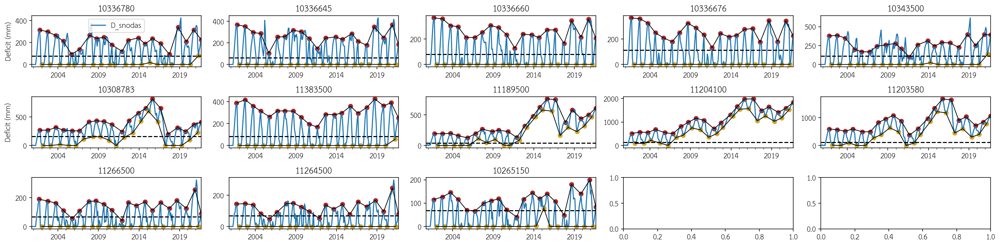

In [ ]:
# plot running deficit calculation at all sites

f,axs = plt.subplots(3,5,figsize=(20,5))#,sharey=True)
axs[0][0].set_ylabel('Deficit (mm)')
axs[1][0].set_ylabel('Deficit (mm)')
# axs[2][0].set_ylabel('Deficit (mm)')
axlab = [[0,0],[0,1],[0,2],[0,3],[0,4],
         [1,0],[1,1],[1,2],[1,3],[1,4],
         [2,0],[2,1],[2,2],[2,3],[2,4],
         [3,0],[3,1],[3,2],[3,3],[3,4],
         [4,0],[4,1],[4,2],[4,3],
         [5,0],[5,1],[5,2],[5,3],
         [6,0],[6,1],[6,2],[6,3],
         ]
for i in range(len(gages)):
  ax = axs[axlab[i][0]][axlab[i][1]]
  temp = data[gages.STATION_NM.values[i]]
  temp.D_snodas.plot(ax=ax,label=None)
  # ax.scatter(temp[temp.index.month==10].index,temp[temp.index.month==10].D_snodas,
  #            c='firebrick',label = 'October deficit')
  # ax.scatter(temp[temp.index.month==4].index,temp[temp.index.month==4].D_snodas,
  #            c='goldenrod',label = 'Min. deficit')
  if i==0:
    ax.legend()
  # temp[temp.index.month==4].D_snodas.plot(ax=ax,c='k',lw=1,label=None)
  temp['wy_shift'] = temp.index.year+1
  maxDates = temp.loc[temp[temp.index.month.isin([8,9,10,11,12,])].groupby("wy_shift")["D_snodas"].idxmax()].iloc[1:]
  minDates = temp.loc[temp[temp.index.month.isin([1,2,3,4,5,6])].groupby("wy")["D_snodas"].idxmin()].iloc[1:]
  maxDates.D_snodas.plot(ax=ax,c='k',lw=1,label=None)
  minDates.D_snodas.plot(ax=ax,c='k',lw=1,label=None)
  ax.scatter(maxDates.index,maxDates.D_snodas,c='firebrick',label='Max. deficit')
  ax.scatter(minDates.index,minDates.D_snodas,c='goldenrod',label='Min. deficit')
  ax.set_title(gages.SITE_NO.values[i])
  ax.axhline(soildepth[gages.SITE_NO.values[i]]['b1'],c='k',ls='--')
f.tight_layout()

## Import LST data from MODIS (not using this anymore I don't think)

In [ ]:
# # get temperature data from MODIS

# # code below adapted from https://colab.research.google.com/github/google/earthengine-community/blob/master/tutorials/intro-to-python-api-guiattard/index.ipynb

# modisT = ee.ImageCollection("MODIS/006/MOD11A2")

# # Initial date of interest (inclusive).
# i_date = '2000-10-01'

# # Final date of interest (exclusive).
# f_date = '2021-10-01'

# T_modis = modisT.select('LST_Day_1km').filterDate(i_date, f_date) #kelvin

# scale = 1000  # scale in meters

# def addTime(image) :
#   return image.addBands(image.metadata('system:time_start'))

# def reduceregions(image):
#   meanT = image.reduceRegion(ee.Reducer.mean(),geo,1000)
#   return image.set(meanT)

# modisT = {}

# for i,geo in enumerate(geos):
#   et_modis = T_modis.select('LST_Day_1km')
#   et1 = et_modis.toBands()
#   ft = et1.reduceRegion(ee.Reducer.mean(), geo, 500)
#   vals = ft.getInfo()
#   dates = pd.to_datetime([item[:10].replace('_','-')
#                                       for item in list(vals)])
#   etvals = [item for item in vals.values()]
#   Tdf = pd.DataFrame({'T':etvals},index=dates)
#   Tdf = Tdf.resample('M').mean()
#   # convert to celsius
#   Tdf = Tdf* 0.02 - 273.15
  
#   modisT[names[i]] = Tdf

# for key in modisT.keys():
#   sitenum = gages[gages.STATION_NM==key].SITE_NO.values[0]
#   modisT[key].to_csv(str(int(sitenum))+'.csv')

In [ ]:
base_loc = 'https://raw.githubusercontent.com/lapidesd/CA_missing_freshet/main/Data/modis_temperature/'

modisT = ''
for site in gages.SITE_NO.values:
  # print(site)
  sitename = gages[gages.SITE_NO==site].STATION_NM.values[0]
  T_site = pd.read_csv(base_loc+str(site)+'.csv')
  # print(T_site.head())
  T_site['Unnamed: 0'] = pd.to_datetime(T_site['Unnamed: 0'])
  T_site = T_site.set_index('Unnamed: 0')
  if len(modisT)==0:
    modisT = T_site.rename(columns={'T':site})
  else:
    modisT = modisT.merge(T_site.rename(columns={'T':site}),
                          left_index=True,right_index=True)

## Import plant stress data
https://climateserv.servirglobal.net/

10336780
10336645
10336660
10336676
10343500
10308783
11383500
11189500
11204100
11203580
11266500
11264500
10265150


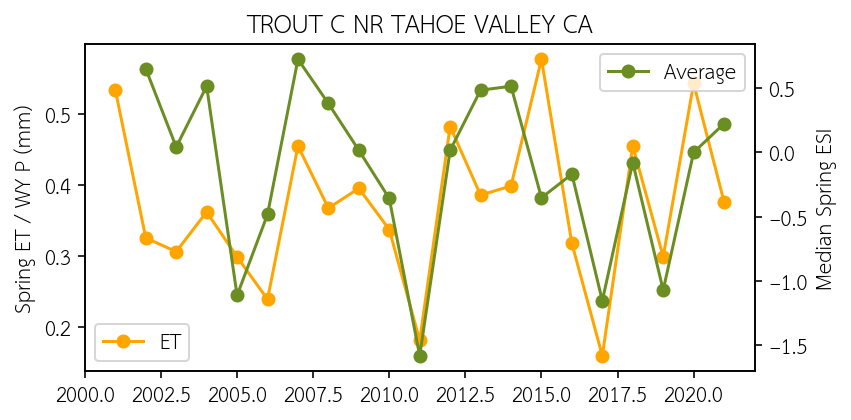

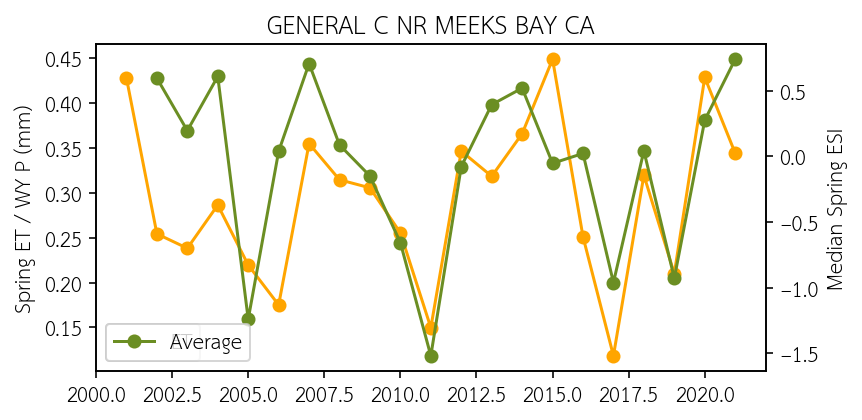

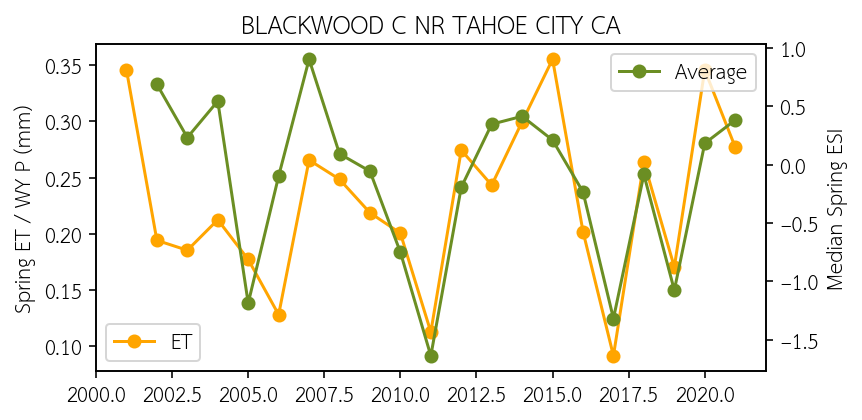

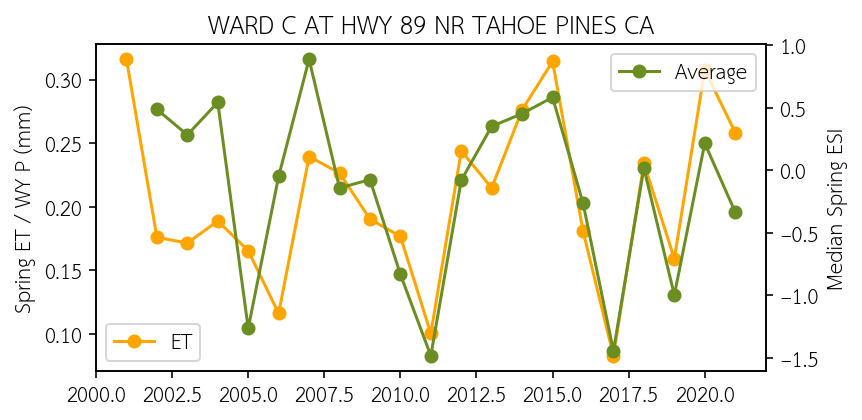

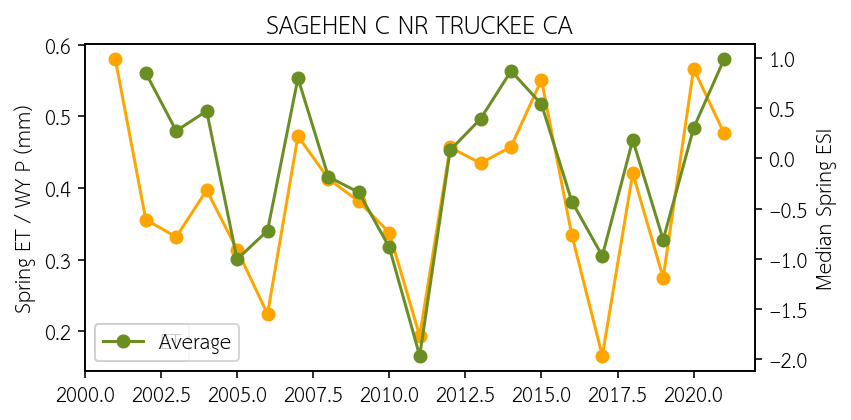

...

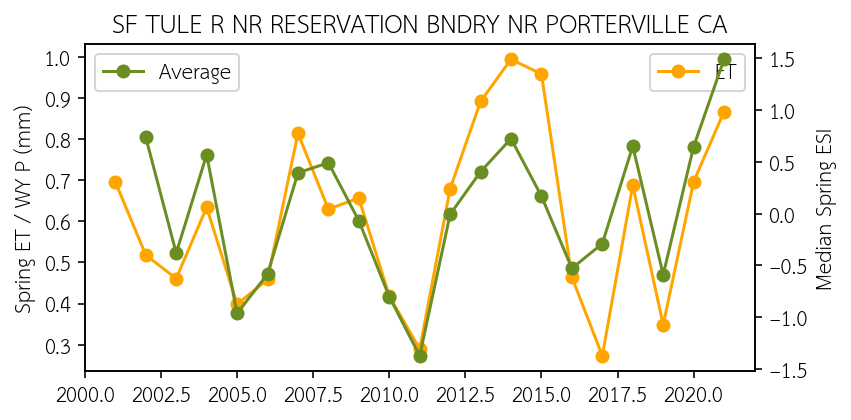

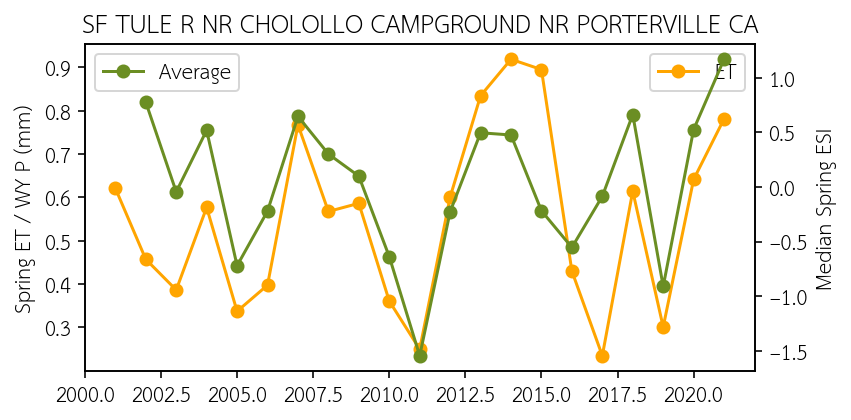

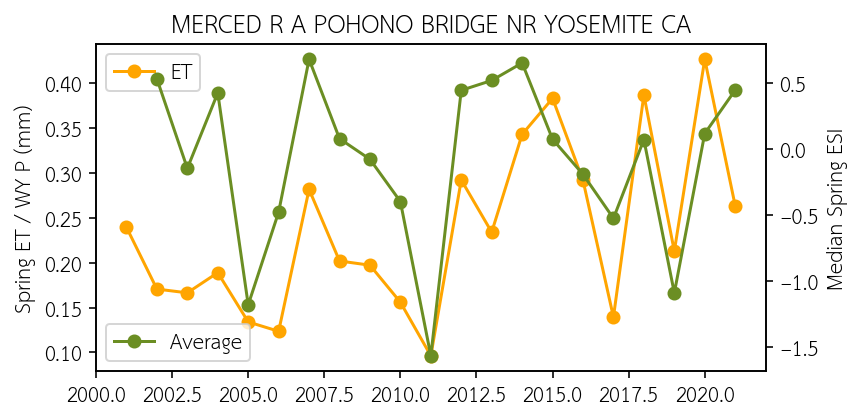

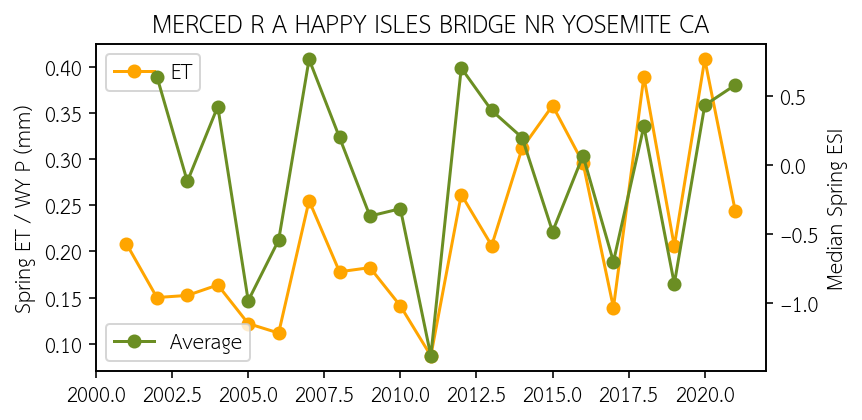

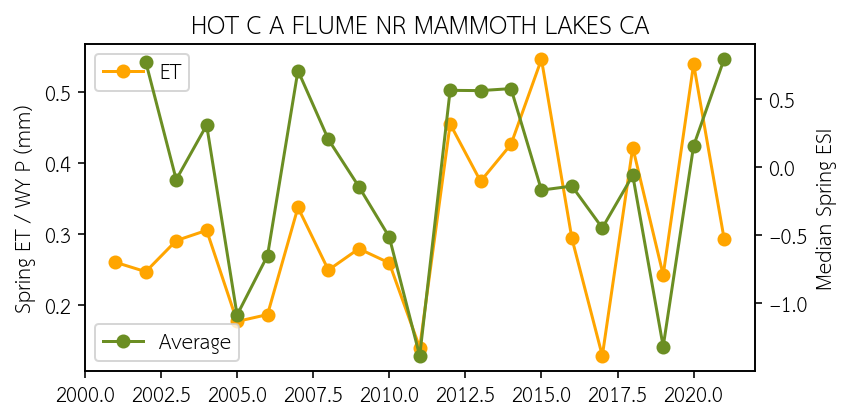

In [ ]:
base_loc = 'https://raw.githubusercontent.com/lapidesd/CA_missing_freshet/main/Data/evaporative_stress_index/'

ESI = ''
for site in gages.SITE_NO.values:
  print(site)
  try:
    site_esi = pd.read_csv(base_loc+str(site)+'.csv',skiprows=1)
    site_esi['Date'] = pd.to_datetime(site_esi.Date)
    site_esi = site_esi.set_index('Date')
    site_esi = site_esi*-1
  except:
    site_esi = pd.read_csv(base_loc+str(site)+'.csv')
    site_esi = site_esi.rename(columns={'DateTime':'Date'})
    site_esi['Date'] = pd.to_datetime(site_esi.Date)
    site_esi = site_esi.set_index('Date')
    site_esi = site_esi*-1
  if len(ESI)==0:
    ESI = site_esi.rename(columns={'Average':site})
  else:
    ESI = ESI.merge(site_esi.rename(columns={'Average':site}),
                    left_index=True,
                    right_index=True)
    
  fig,ax = plt.subplots(1,figsize = (6,3))
  sitename = gages[gages.SITE_NO==site].STATION_NM.values[0]
  spring_site = data[sitename][data[sitename].index.month.isin([4,5,6,7])].groupby('wy').sum().ET_with_modis.values.flatten()
  wy_site = data[sitename].groupby('wy').sum().P
  ax.plot(wy_site.index,spring_site/wy_site.values.flatten(),label='ET',c='orange',marker='o')
  ax.legend()
  ax.set_title(sitename)
  ax.set_ylabel('Spring ET / WY P (mm)')
  ax1=ax.twinx()
  site_esi['wy'] = np.where(site_esi.index.month.isin([10,11,12]),
                            site_esi.index.year+1,site_esi.index.year)
  (site_esi[site_esi.index.month.isin([4,5,6,7])].groupby('wy').mean()).plot(ax=ax1,label='ESI',c='olivedrab',marker='o')
  ax1.legend()
  ax1.set_ylabel('Median Spring ESI')
  # ax1.set_ylim(max(site_esi.Average),0)

## Aggregate all data for all sites

In [ ]:
# calculate snowfall by using a temperature threshold to decide
# if precip is snow or rain
# this matches well with just using the snow data to determine if
# snow accumulated or not, so we will just use that
for site in gages.SITE_NO.values:
  sitenm = gages[gages.SITE_NO==str(site)].STATION_NM.values[0]
  df = data[sitenm]
  temp = modisT[[str(site)]].rename(columns={str(site):'modisT'})
  df = df.merge(temp,left_index=True,right_index=True)
  df['snowfall_t'] = np.where(df.modisT<=0,df.P,0)
  data[sitenm] = df


In [ ]:
# aggregate all data by taking mean across all sites
for col in ['P','ET_with_modis','D_snodas','snodas','snowfall_t']:
  coldata = ''
  for key in gages.STATION_NM.values:
    if len(coldata)==0:
      coldata = data[key][[col]]
    else:
      coldata = coldata.merge(data[key][[col]],
                              left_index=True,
                              right_index=True)
  coldata = coldata.mean(axis=1)
  if col=='P':
    agg_data = coldata.to_frame().rename(columns={0:col})
  else:
    agg_data[col] = coldata
agg_data['wy'] = np.where(agg_data.index.month.isin([10,11,12]),
                          agg_data.index.year+1,agg_data.index.year)


/usr/local/lib/python3.7/dist-packages/pandas/core/frame.py:9203: FutureWarning: Passing 'suffixes' which cause duplicate columns {'P_x'} in the result is deprecated and will raise a MergeError in a future version.
  validate=validate,
/usr/local/lib/python3.7/dist-packages/pandas/core/frame.py:9203: FutureWarning: Passing 'suffixes' which cause duplicate columns {'ET_with_modis_x'} in the result is deprecated and will raise a MergeError in a future version.
  validate=validate,
/usr/local/lib/python3.7/dist-packages/pandas/core/frame.py:9203: FutureWarning: Passing 'suffixes' which cause duplicate columns {'D_snodas_x'} in the result is deprecated and will raise a MergeError in a future version.
  validate=validate,
/usr/local/lib/python3.7/dist-packages/pandas/core/frame.py:9203: FutureWarning: Passing 'suffixes' which cause duplicate columns {'snodas_x'} in the result is deprecated and will raise a MergeError in a future version.
  validate=validate,
/usr/local/lib/python3.7/dist-pa

In [ ]:
# calculate duration of snow cover and timing of peak swe and snow fraction
# these data aren't used anymore--didn't end up being relevant
# now this cell just calculates snow fraction, which I think is also not used
# since we're just using rain fraction calculated from fluxes in later cells

from datetime import datetime
snow_fraction = ''

for site in gages.SITE_NO.values:
  sitenm = gages[gages.SITE_NO==str(site)].STATION_NM.values[0]
  swedat = snodas_data[snodas_data.sitenum==site][['swe']]
  swedat['snowy'] = np.where(swedat.swe>5,1,0) 
  swedat['wy'] = np.where(swedat.index.month.isin([10,11,12]),
                          swedat.index.year+1,swedat.index.year)
  swedur = swedat.groupby('wy').sum().snowy.to_frame().rename(columns={'snowy':site})
  swepeak = swedat.loc[swedat.groupby("wy")["swe"].idxmax()]
  swepeak = swepeak.reset_index().set_index('wy')
  swepeak['peak_doy'] = [pd.to_datetime(swepeak.date.values[i]).timetuple().tm_yday for
                          i in range(len(swepeak))]
  swepeak['peak_doy'] = np.where(swepeak.peak_doy>=275,
                                 swepeak.peak_doy-275,
                                 swepeak.peak_doy+365-275)
  swepeak_d = swepeak[['peak_doy']].rename(columns={'peak_doy':site})
  df = data[sitenm]
  df['snowfall'] = df.snodas.fillna(method='bfill')
  df['snowfall'] = df.snowfall.diff()
  df['snowfall'] = np.where(df.snowfall<0,0,df.snowfall)
  df['snowfall'] = df.snowfall.fillna(value=0)
  wy_totals = df[['P','snowfall','wy']].groupby('wy').sum()
  snowfrac = (wy_totals.snowfall/wy_totals.P)#.iloc[3:]
  snowfrac = snowfrac.to_frame().rename(columns={0:site})

  if len(snow_fraction)==0:
    snow_duration = swedur
    snow_peakdate = swepeak_d
    snow_fraction = snowfrac
  else:
    # snow_duration = snow_duration.merge(swedur,left_index=True,right_index=True)
    # snow_peakdate = snow_peakdate.merge(swepeak_d,left_index=True,right_index=True)
    snow_fraction = snow_fraction.merge(snowfrac,left_index=True,right_index=True)
# snow_duration.to_csv('snow_duration.csv')
# snow_peakdate.to_csv('snow_peakdate.csv')

In [ ]:
# save summary data for each study site
for key in gages.STATION_NM.values:
  sitenum = gages[gages.STATION_NM==key].SITE_NO.values[0]
  df = data[key]
  wyP = df.groupby('wy').sum().P.values.flatten()
  df['Temp'] = modisT[sitenum]
  df['snowfall'] = df.snodas.fillna(method='bfill')
  df['snowfall'] = df.snowfall.diff()
  df['snowfall'] = np.where(df.snowfall<0,0,df.snowfall)
  df['snowfall'] = df.snowfall.fillna(value=0)
  df['P_adj'] = df.P-df.snowfall
  df['P_adj'] = np.where(df.P_adj<0,0,df.P_adj)
  df['spring_rain'] = np.where(df.index.month.isin([1,2,3,8,9,10,11,12]),
                               0,df.P_adj)
  df['winter_P'] = np.where(df.index.month.isin([10,11,12,1,2,3]),
                            df.P,0)
  winter_rain = df[df.index.month.isin([10,11,12,1,2,3])].groupby('wy').sum()
  winter_rain = winter_rain.P-winter_rain.snowfall
  wy_precip_adj = df.groupby('wy').sum().P_adj.values
  wys = df.wy.drop_duplicates().values.flatten()
  wySWE = df.groupby('wy').sum().snowfall.values.flatten()
  wySWE_t = df.groupby('wy').sum().snowfall_t.values.flatten()
  wyET = df[df.index.month.isin([4,5,6,7])].groupby('wy').sum().ET.values.flatten()
  winterET = df[df.index.month.isin([10,11,12,1,2,3])].groupby('wy').sum().ET.values.flatten()
  octD = df[df.index.month==10].D_snodas.values.flatten()
  aprD = df[df.index.month==4].D_snodas.values.flatten()
  df['wy_shift'] = np.where(df.index.isin([9,10,11,12]),
                                df.index.year+1,df.index.year)
  maxD = df[df.index.month.isin([8,9,10,11,12])].groupby('wy_shift').max().D_snodas.values.flatten()[1:]
  minD = df[df.index.month.isin([8,9,10,11,12])].groupby('wy_shift').min().D_snodas.values.flatten()[1:]

  site_wy_info = pd.DataFrame.from_dict({'wy':wys,
                                            'P':wyP,
                                            'adjP':wy_precip_adj,
                                            'spring_rain':df.groupby('wy').sum().spring_rain.values,
                                            'winter_P':df.groupby('wy').sum().winter_P.values,
                                            'winter_rain':winter_rain,
                                            'snow_frac':snow_fraction[sitenum].values,
                                            'total_swe':wySWE,
                                            'snowfall_t':wySWE_t,
                                            'springET':wyET,
                                            'winterET':winterET,
                                            'maxDeficit':maxD,
                                            'minDeficit':minD,
                                            'octDeficit':octD,
                                            'aprDeficit':aprD})
  site_wy_info.to_csv('all_deficit_data_'+str(sitenum)+'.csv')

In [ ]:
# calculate water year totals and save summary data for all sites (mean)

octDeficit = agg_data[(agg_data.index.month==10)].D_snodas#.values
agg_data['wy_shift'] = np.where(agg_data.index.isin([9,10,11,12]),
                                agg_data.index.year+1,agg_data.index.year)
agg_data['Temp'] = modisT.mean(axis=1)
maxDates = agg_data.loc[agg_data[agg_data.index.month.isin([8,9,10,11,12])].groupby("wy_shift")["D_snodas"].idxmax()].iloc[1:]
minDates = agg_data.loc[agg_data[agg_data.index.month.isin([2,3,4,5])].groupby("wy")["D_snodas"].idxmin()]
aprDeficit = agg_data[(agg_data.index.month==4)].D_snodas#.values
springET = agg_data[(agg_data.index.month.isin([4,5,6,7]))].groupby('wy').sum().ET_with_modis.values.flatten()
winterET = agg_data[(agg_data.index.month.isin([10,11,12,1,2,3]))].groupby('wy').sum().ET_with_modis.values.flatten()
wyP = agg_data.groupby('wy').sum().P.values.flatten()
wys = agg_data.wy.drop_duplicates()
wys = pd.to_datetime(['10-31-'+str(y) for y in wys])

agg_data['snowfall'] = agg_data.snodas.fillna(method='bfill')
agg_data['snowfall'] = agg_data.snowfall.diff()
agg_data['snowfall'] = np.where(agg_data.snowfall<0,0,agg_data.snowfall)
agg_data['snowfall'] = agg_data.snowfall.fillna(value=0)
wySWE = df.groupby('wy').sum().snowfall.values.flatten()
wySWE_t = df.groupby('wy').sum().snowfall_t.values.flatten()

winterrain = agg_data[agg_data.index.month.isin([10,11,12,1,2,3])].groupby('wy').sum()
winterrain = winterrain.P-winterrain.snowfall

df = agg_data
df['P_adj'] = df.P-df.snowfall
df['P_adj'] = np.where(df.P_adj<0,0,df.P_adj)
wy_precip_adj = df.groupby('wy').sum().P_adj.values
df['spring_rain'] = np.where(df.index.month.isin([1,2,3,8,9,10,11,12]),
                               0,df.P_adj)
df['winter_P'] = np.where(df.index.month.isin([10,11,12,1,2,3]),
                            df.P,0)

all_sites_wy_info = pd.DataFrame.from_dict({'wy':[d.year for d in wys],
                                            'P':wyP,
                                            'adjP':wy_precip_adj,
                                            'spring_rain':df.groupby('wy').sum().spring_rain.values,
                                            'winter_P':df.groupby('wy').sum().winter_P.values,
                                            'winter_rain':winterrain,
                                            'snow_frac':snow_fraction.sum(axis=1).values,
                                            'total_swe':wySWE,
                                            'snowfall_t':wySWE_t,
                                            'springET':springET,
                                            'winterET':winterET,
                                            'maxDeficit':list(maxDates.D_snodas.values.flatten()),
                                            'minDeficit':minDates.D_snodas.values.flatten(),
                                            'octDeficit':octDeficit.values.flatten(),
                                            'aprDeficit':aprDeficit.values.flatten()})
all_sites_wy_info.to_csv('WY_data_allsites.csv')

## Plot all results

In [ ]:
# import residuals in SWE-Q relationship calculated in other notebook
loc = 'https://raw.githubusercontent.com/lapidesd/CA_missing_freshet/main/Data/swe_q_residuals_mm.csv'
residuals = pd.read_csv(loc).set_index('wy')

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stab

median r2: 0.21868536436960007


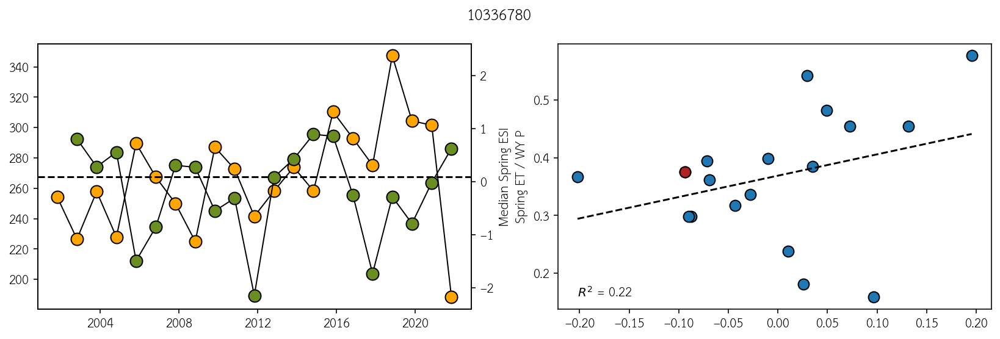

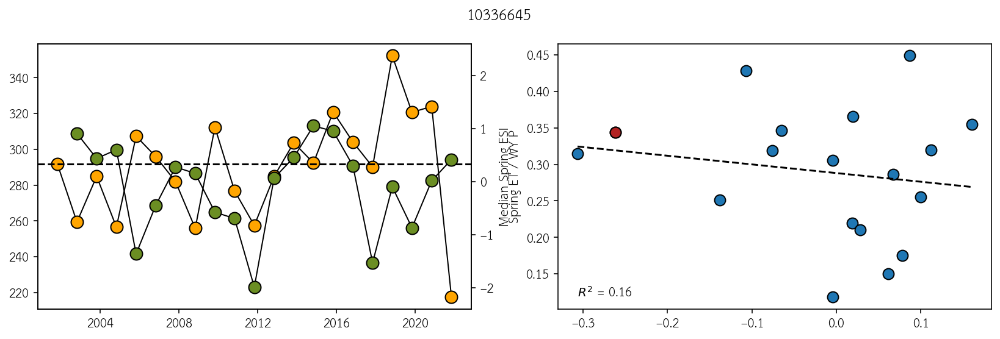

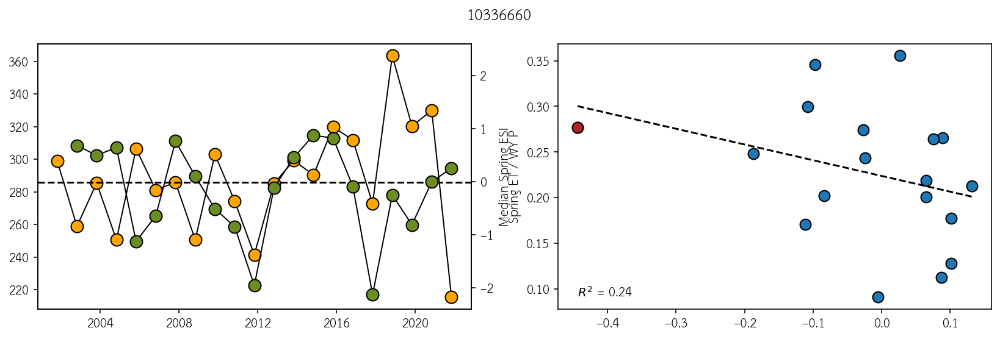

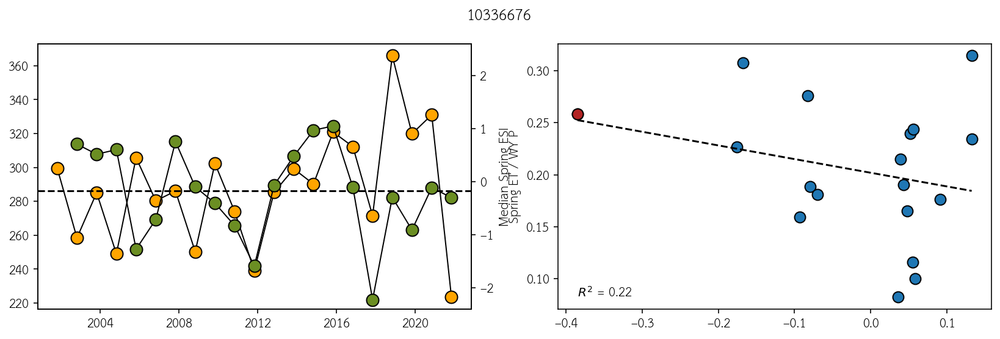

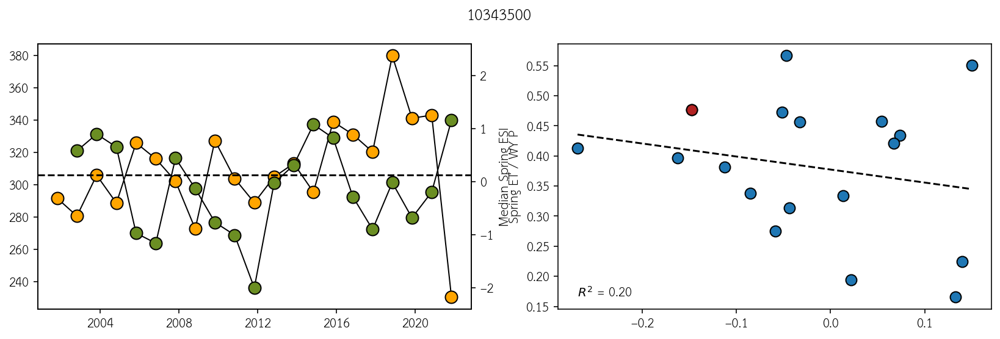

...

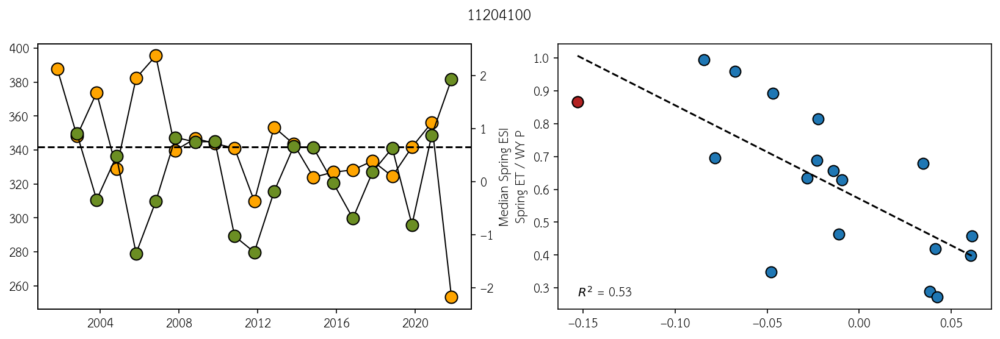

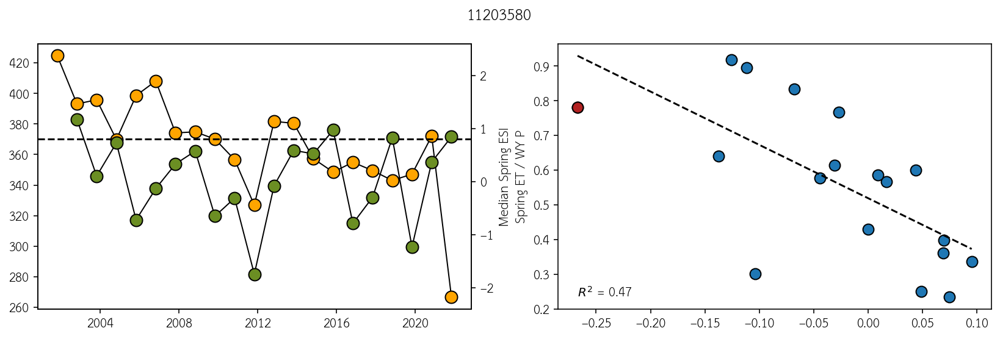

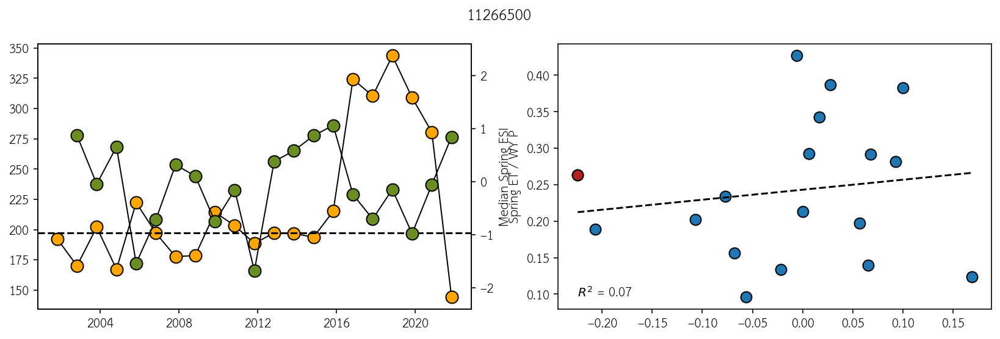

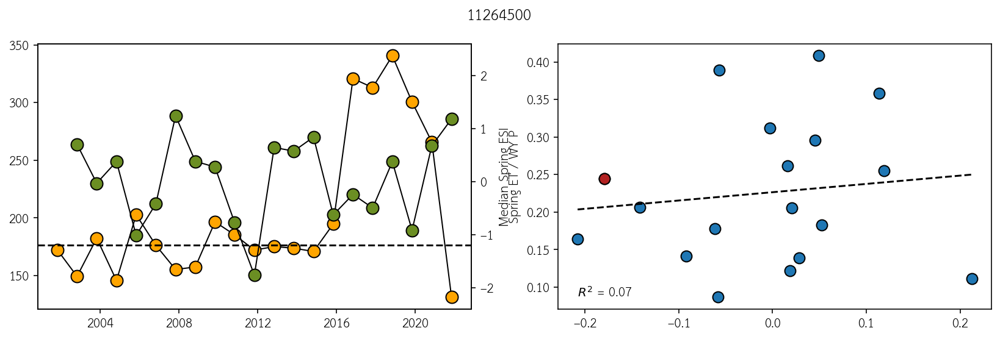

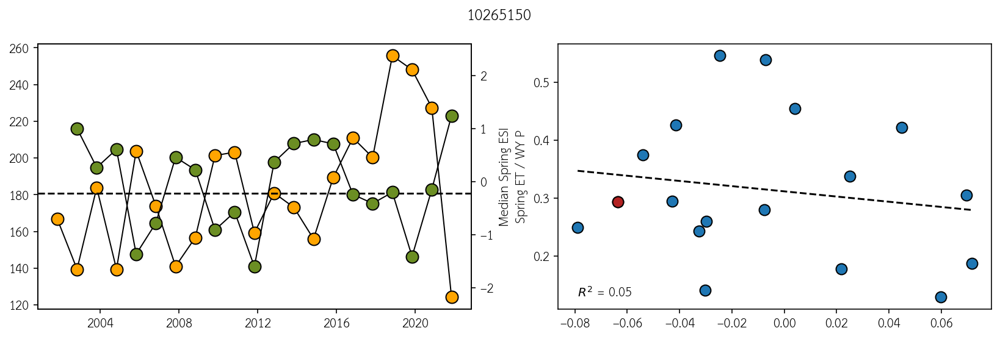

In [ ]:
# Examine spring ET at all sites
r2vals = []
for site in gages.SITE_NO.values:
  size = 100
  size1=80
  fig,axs = plt.subplots(1,2,figsize = (14,4))
  station_nm = gages[gages.SITE_NO==str(site)].STATION_NM.values[0]
  # ax.set_title(station_nm)
  df = data[station_nm]
  
  ax = axs[0]
  wyP = df.groupby('wy').sum().P
  springET1 = df[df.index.month.isin([4,5,6,7])].groupby('wy').sum().ET_with_modis
  springrain = df.groupby('wy').sum().spring_rain
  apr1swe = df.groupby('wy').sum().winter_P
  res_use = residuals[str(site)]/wyP
  divby =(springET1).values[-len(apr1swe):] 
  divby = springET1#/wyP
  ax.plot(wys[-len(divby):],divby, c='k',lw=1,zorder=-1)
  ax.scatter(wys[-len(divby):],divby, s = size, label = 'Spring ET / WY P',
            c='orange',edgecolor = 'k',lw=1)
  medianET = np.nanmedian(divby)
  ax.axhline(medianET,ls='--',c='k',)
  divby = springET1/wyP
  
  if i==0:
    ax.set_ylabel('Spring ET / WY P')
    ax.text(pd.to_datetime('11-1-2000'),medianET*1.05,'median')
  ax1 = ax.twinx()
  ESIsite = ESI[[str(site)]]
  ESIsite['wy'] = np.where(ESIsite.index.month.isin([10,11,12]),
                          ESIsite.index.year+1,ESIsite.index.year)
  ESImed = ESIsite[ESIsite.index.month.isin([4,5,6,7])].groupby('wy').median()
  ax1.plot(wys[-len(ESImed):],ESImed,c='k',lw=1,zorder=-1)
  ax1.scatter(wys[-len(ESImed):],ESImed,
              c='olivedrab',edgecolor = 'k',lw=1,s=size, label = 'ESI')
  ax1.set_ylabel('Median Spring ESI')
  ax1.set_ylim(-2.4,2.6)
  if i==0:
    ax.legend(frameon=False,loc='lower left')
    ax1.legend(frameon=False,loc='lower left',bbox_to_anchor=(0,0.1))


  
  ax = axs[1]
  ax.scatter(res_use,divby[-len(res_use):],s=size1,edgecolor = 'k')
  ax.scatter(res_use[-1:],divby[-1:],c='firebrick',s=size1,edgecolor = 'k',label='2021')
  ax.set_ylabel('Spring ET / WY P')

  popt,pcov = curve_fit(func,res_use.values[3:],
                        divby[-len(res_use):][3:],
                        )
  xvals = np.linspace(np.nanmin(res_use),np.nanmax(res_use),5)
  yvals = func(xvals,*popt)
  ax.plot(xvals,yvals,c='k',ls='--')

  yvals = divby[-len(res_use):]
  y_pred = func(res_use,*popt)
  residuals1 = np.array(yvals) - y_pred
  ss_res = np.sum(residuals1**2)
  ss_tot = np.sum((yvals-np.mean(yvals))**2)
  r_squared = 1 - (ss_res / ss_tot)
  r2vals.append(r_squared)
  ax.text(np.nanmin(res_use),np.nanmin(divby),'$R^2$ = '+'%2.2f' % (r_squared))
  fig.suptitle(site)
  # axs[0].set_title('Spring ET [mm]')

print('median r2:',np.nanmedian(r2vals))

median r2: 0.37815064740037607


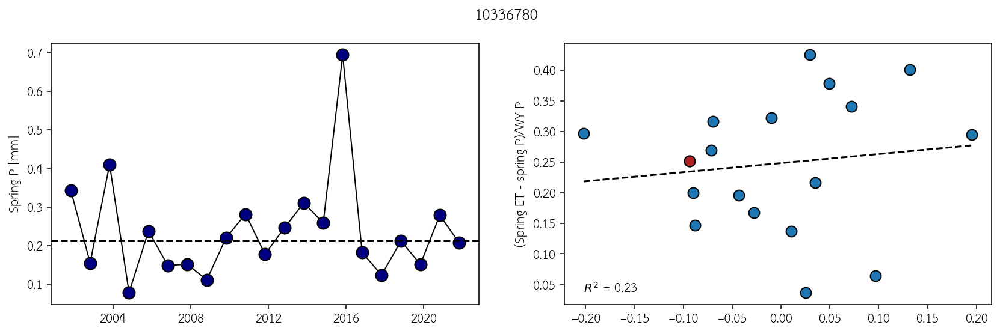

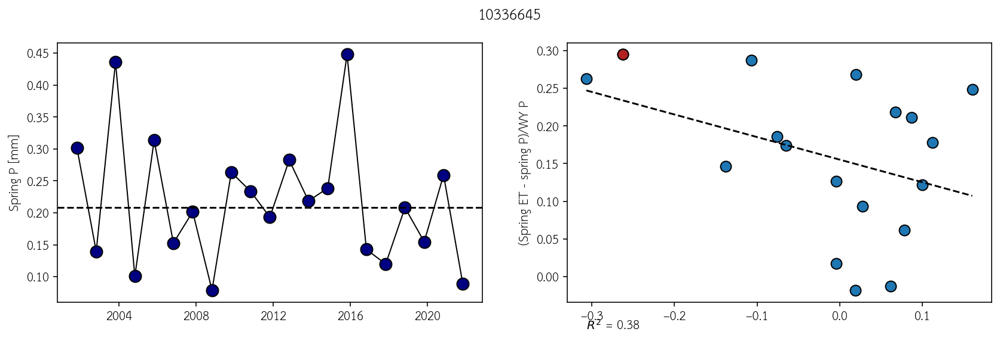

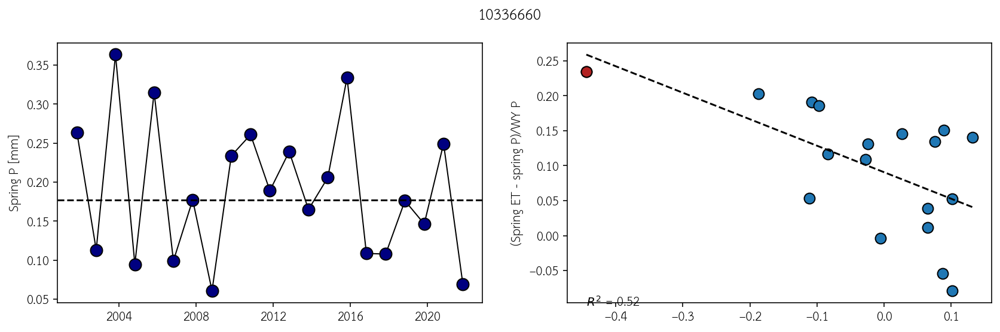

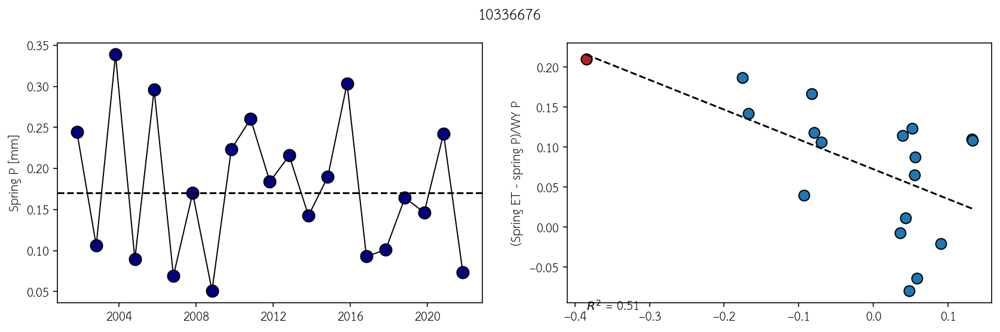

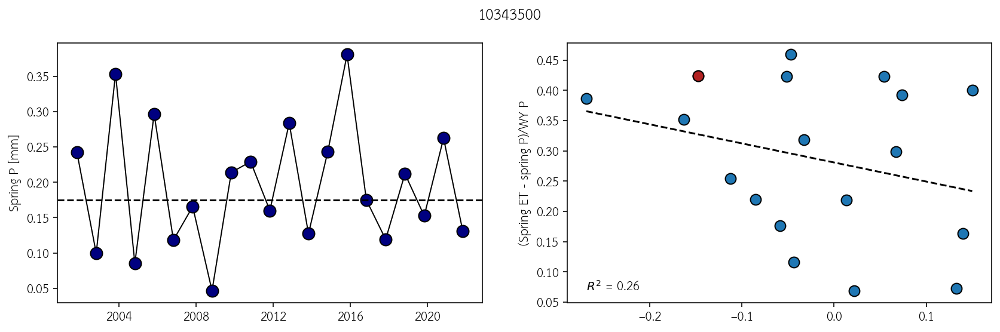

...

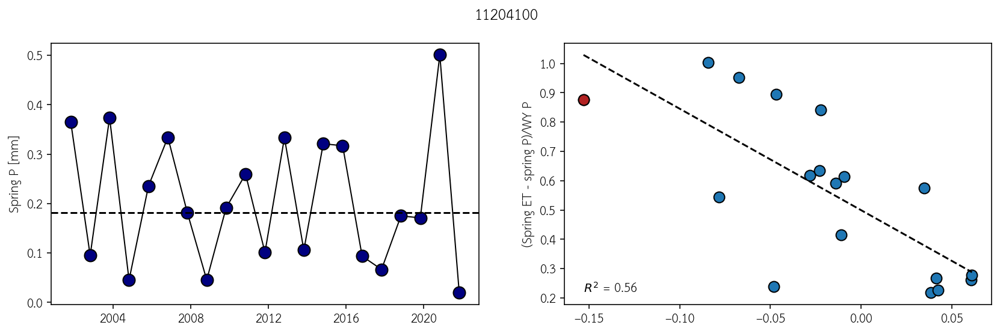

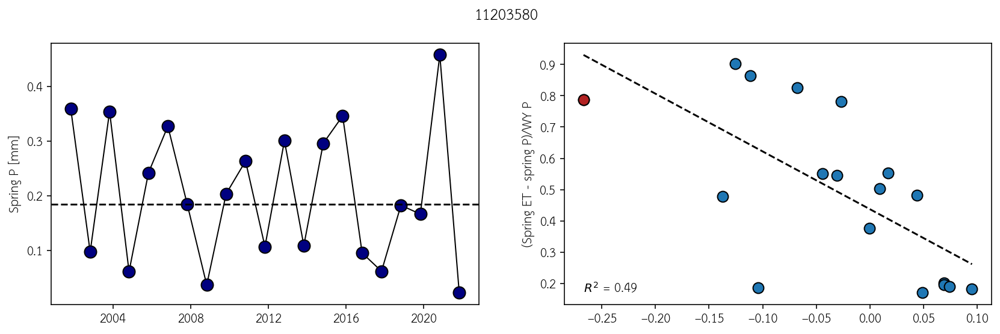

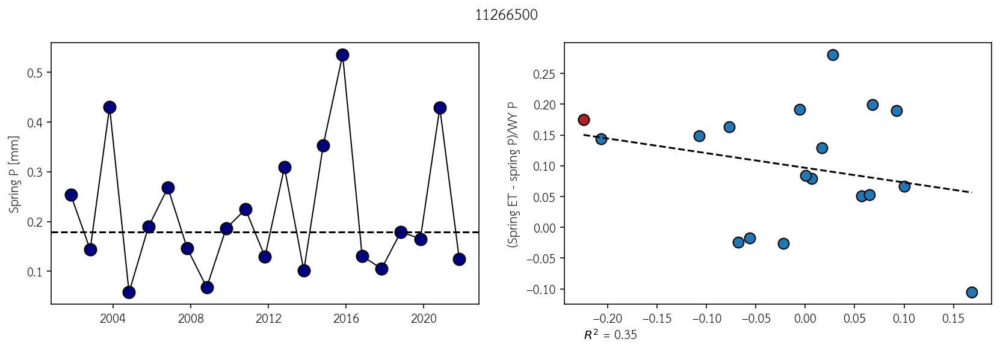

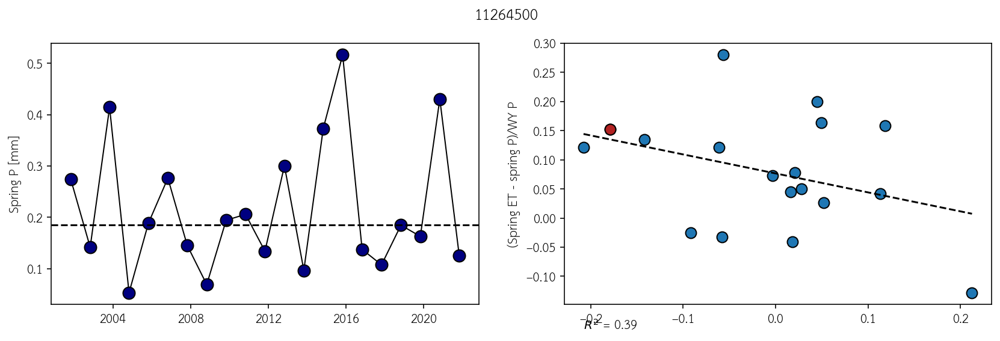

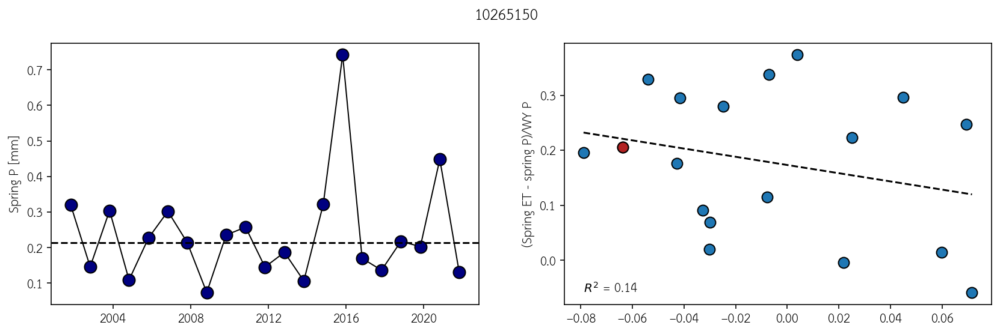

In [ ]:
# Examine spring P at all sites
r2vals = []
for site in gages.SITE_NO.values:
  size = 100
  size1=80
  fig,axs = plt.subplots(1,2,figsize = (14,4))
  station_nm = gages[gages.SITE_NO==str(site)].STATION_NM.values[0]
  df = data[station_nm]
  
  wyP = df.groupby('wy').sum().P
  springET1 = df[df.index.month.isin([4,5,6,7])].groupby('wy').sum().ET_with_modis
  springrain = df.groupby('wy').sum().spring_rain
  apr1swe = df.groupby('wy').sum().winter_P
  res_use = residuals[str(site)]/wyP

  ax = axs[0]
  wyP = df.groupby('wy').sum().P
  divbyP =(springrain)/apr1swe
  ax.plot(wys[-len(divbyP):],divbyP, c='k',lw=1,zorder=-1)
  ax.scatter(wys[-len(divbyP):],divbyP, s = size, label = '(Spring ET - spring P) / WY P',
            c='navy',edgecolor = 'k',lw=1)
  medianP = np.nanmedian(divbyP)
  ax.axhline(medianP,ls='--',c='k',)
  
  if i==0:
    ax.set_ylabel('Spring P/ WY P')
    ax.text(pd.to_datetime('11-1-2000'),0.85*medianP,'median')


  
  ax = axs[1]
  dp = (springET1-springrain)/apr1swe
  ax.scatter(res_use,dp[-len(res_use):],s=size1,edgecolor = 'k')
  ax.scatter(res_use[-1:],dp[-1:],c='firebrick',s=size1,edgecolor = 'k',label='2021')
  ax.set_ylabel('(Spring ET - spring P)/WY P')

  divbyP = dp
  popt,pcov = curve_fit(func,res_use.values[3:],
                        divbyP[-len(res_use):][3:],
                        )
  xvals = np.linspace(np.nanmin(res_use),np.nanmax(res_use),5)
  yvals = func(xvals,*popt)
  ax.plot(xvals,yvals,c='k',ls='--')

  yvals = divbyP[-len(res_use):]
  y_pred = func(res_use,*popt)
  residuals1 = np.array(yvals) - y_pred
  ss_res = np.sum(residuals1**2)
  ss_tot = np.sum((yvals-np.mean(yvals))**2)
  r_squared = 1 - (ss_res / ss_tot)
  r2vals.append(r_squared)
  ax.text(np.nanmin(res_use),np.nanmin(dp),'$R^2$ = '+'%2.2f' % (r_squared))
  fig.suptitle(site)
  axs[0].set_ylabel('Spring P [mm]')
print('median r2:',np.nanmedian(r2vals))

median r2: 0.05509058465383254


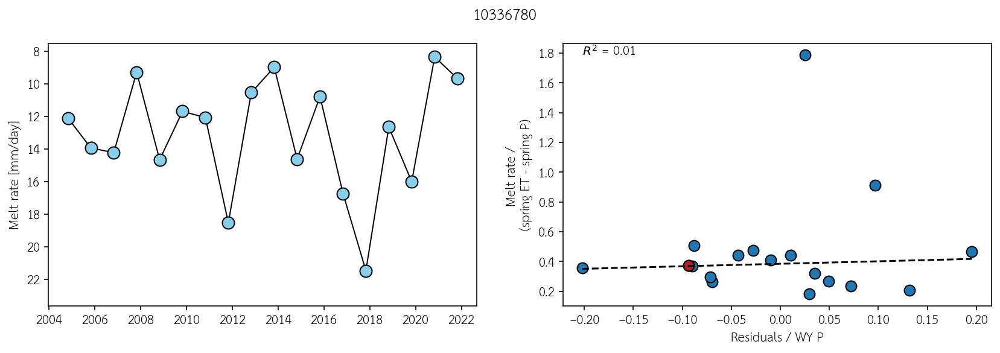

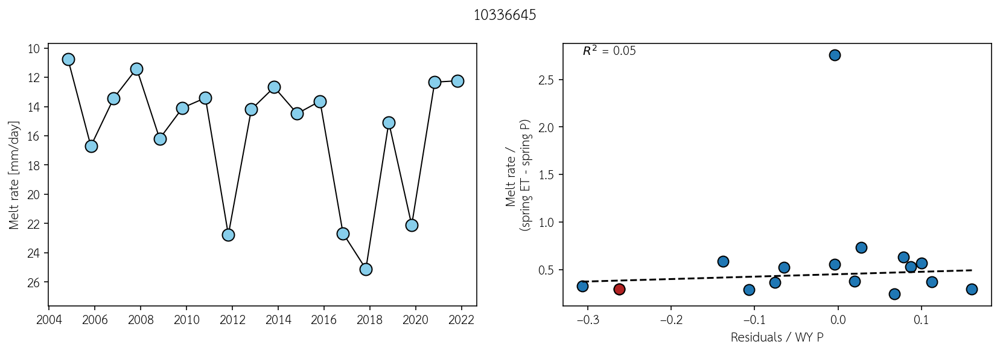

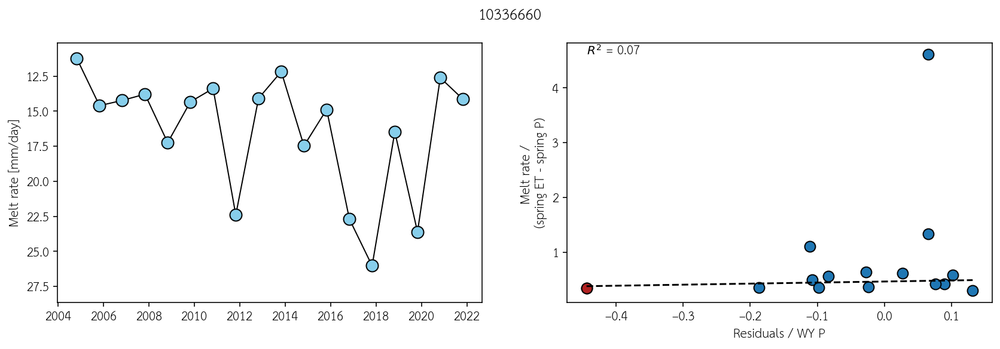

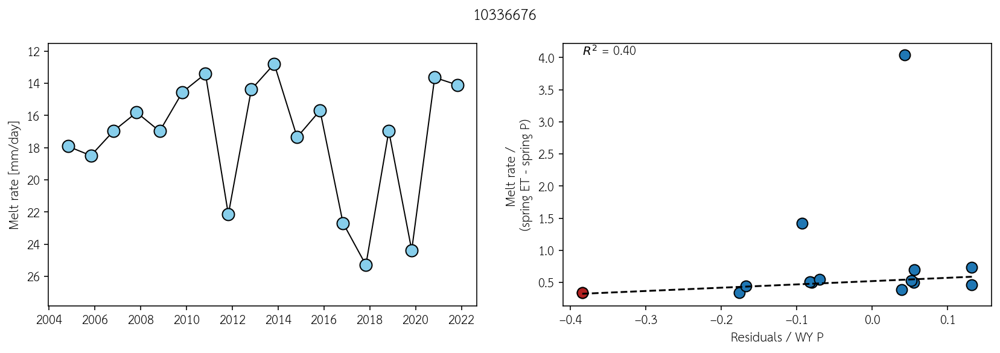

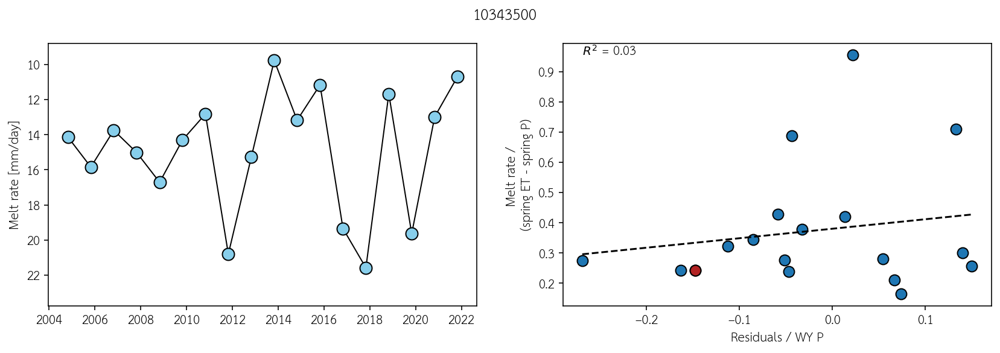

...

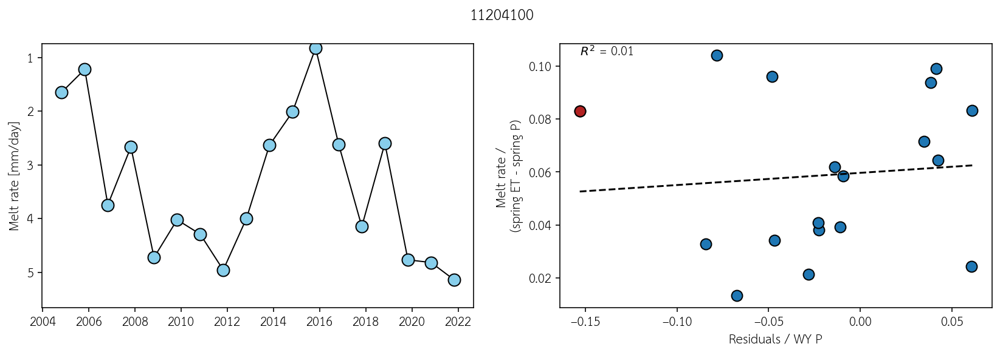

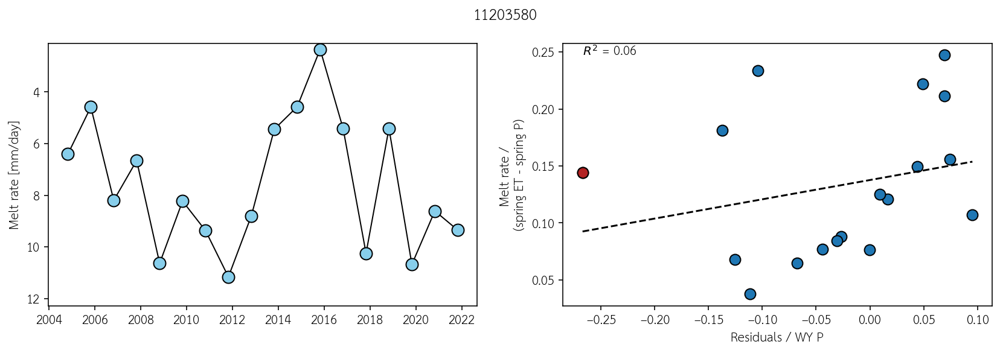

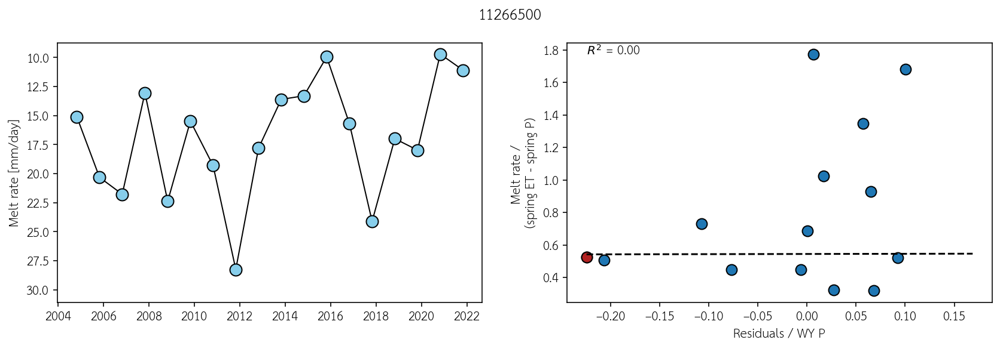

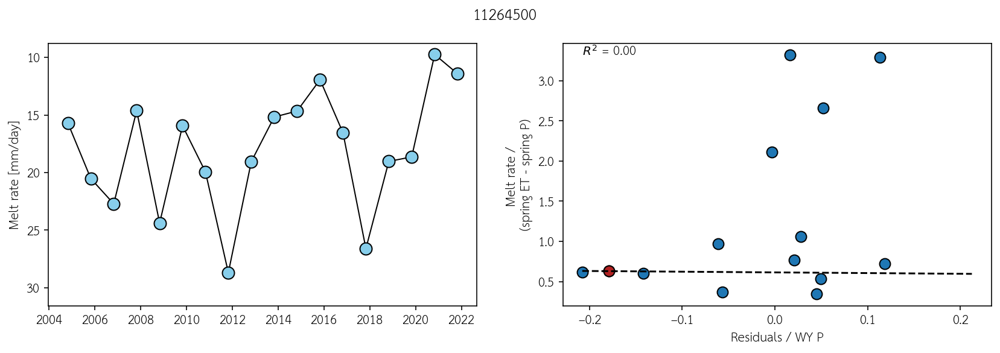

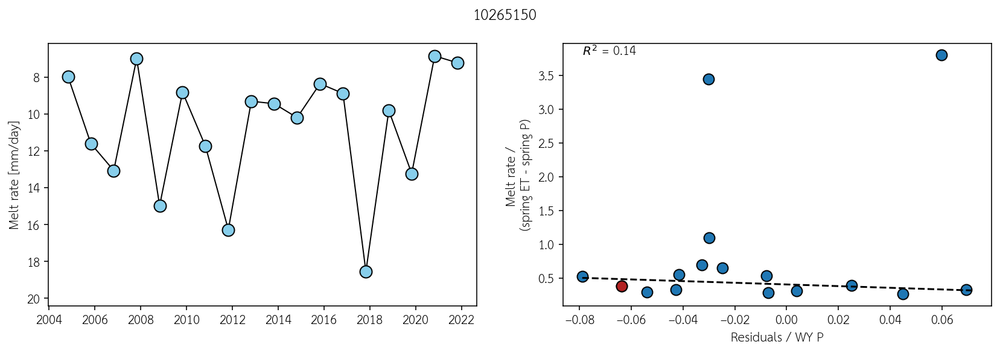

In [ ]:
# Examine snowmelt rate at all sites
r2vals = []
for site in gages.SITE_NO.values:
  size = 100
  size1=80
  fig,axs = plt.subplots(1,2,figsize = (14,4))
  station_nm = gages[gages.SITE_NO==str(site)].STATION_NM.values[0]
  df = data[station_nm]
  
  wyP = df.groupby('wy').sum().P
  springET1 = df[df.index.month.isin([4,5,6,7])].groupby('wy').sum().ET_with_modis
  springrain = df.groupby('wy').sum().spring_rain
  apr1swe = df.groupby('wy').sum().winter_P
  res_use = residuals[str(site)]/wyP

  ax = axs[0]
  ax.scatter(wys[3:],meltrates[int(site)], s = size, edgecolor = 'k', lw=1,c='skyblue')
  ax.plot(wys[3:],meltrates[int(site)],c='k',lw=1,zorder = -1)
  ax.set_ylim(max(meltrates[int(site)])*1.1,min(meltrates[int(site)])*0.9)
  ax.set_ylabel('Melt rate [mm/day]')


  ax = axs[1]
  mplot = meltrates[int(site)].values/((springET1-springrain).values[-len(meltrates):]/4)
  mplot = np.where(mplot<0,np.nan,mplot)
  ax.scatter(res_use[-len(mplot):],mplot,s=size1,edgecolor = 'k')
  ax.scatter(res_use[-1:],mplot[-1:],c='firebrick',s=size1,edgecolor = 'k')
  ax.set_ylabel('Melt rate / \n(spring ET - spring P)')
  ax.set_xlabel('Residuals / WY P')
  mask = (np.isfinite(res_use.values[3:])) & (np.isfinite(mplot)) & (mplot<1)
  popt,pcov = curve_fit(func,res_use.values[3:][mask],
                        mplot[mask],
                        )
  xvals = np.linspace(np.nanmin(res_use),np.nanmax(res_use),5)
  yvals = func(xvals,*popt)
  ax.plot(xvals,yvals,c='k',ls='--')

  mask1 = (np.isfinite(res_use.values[3:])) & (np.isfinite(mplot)) & (mplot<1)
  yvals = mplot[mask1]
  y_pred = func(res_use[-len(mplot):].values[mask1],*popt)
  residuals1 = np.array(yvals) - y_pred
  ss_res = np.sum(residuals1**2)
  ss_tot = np.sum((yvals-np.mean(yvals))**2)
  r_squared = 1 - (ss_res / ss_tot)
  r2vals.append(r_squared)
  ax.text(np.nanmin(res_use),np.nanmax(mplot),'$R^2$ = '+'%2.2f' % (r_squared))
  fig.suptitle(site)
print('median r2:',np.nanmedian(r2vals))

median r2: 0.32450032111285


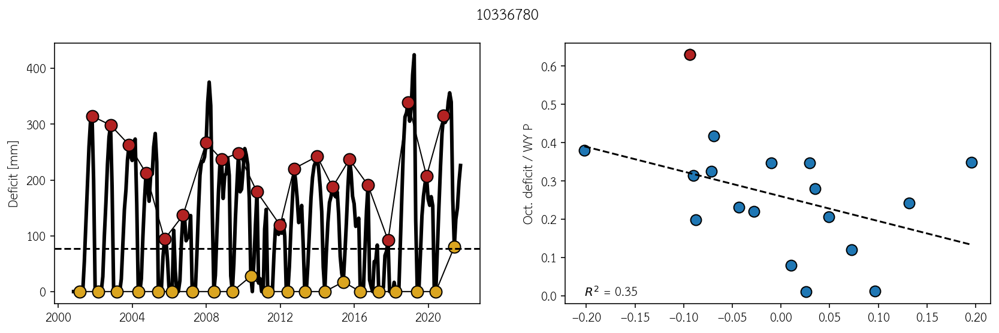

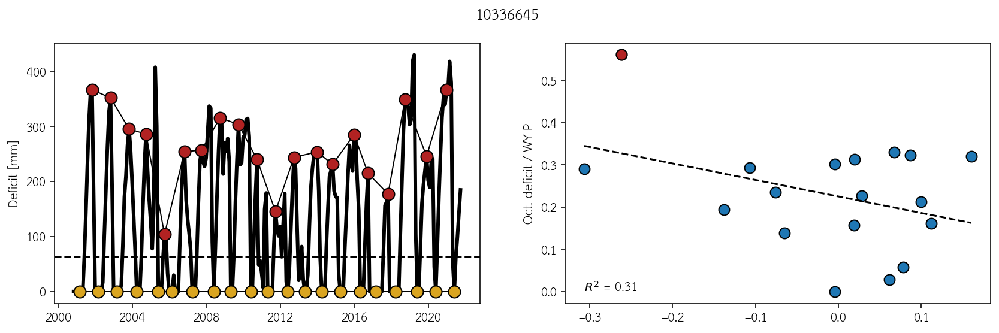

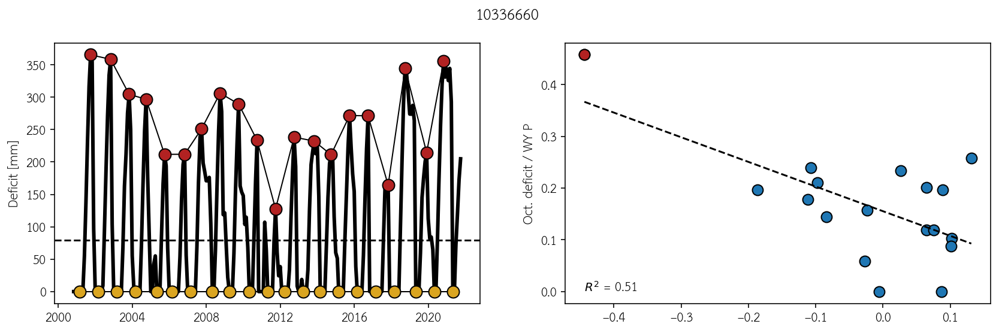

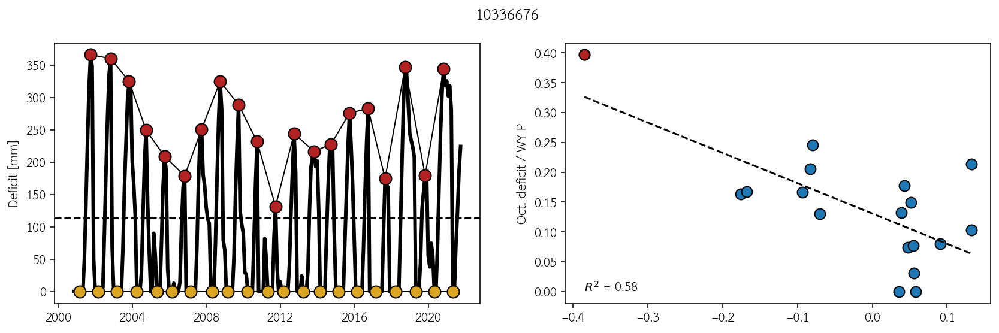

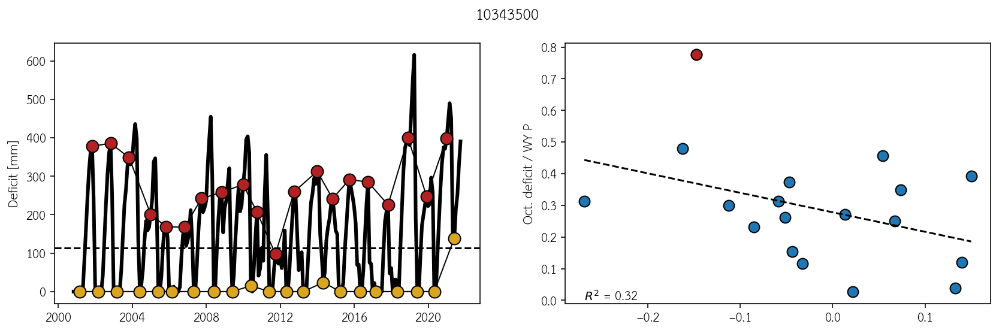

...

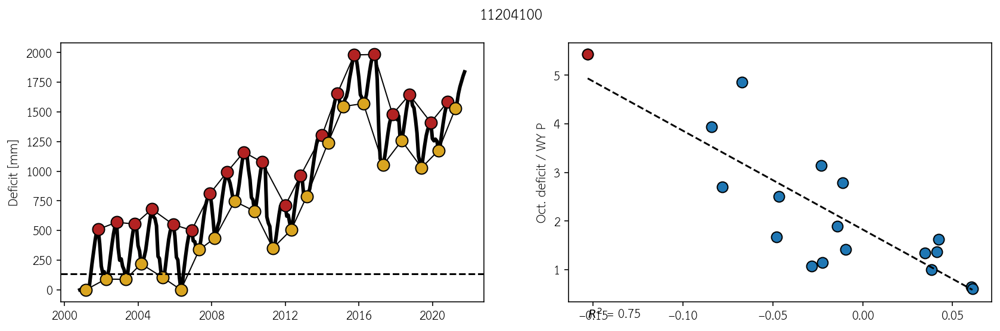

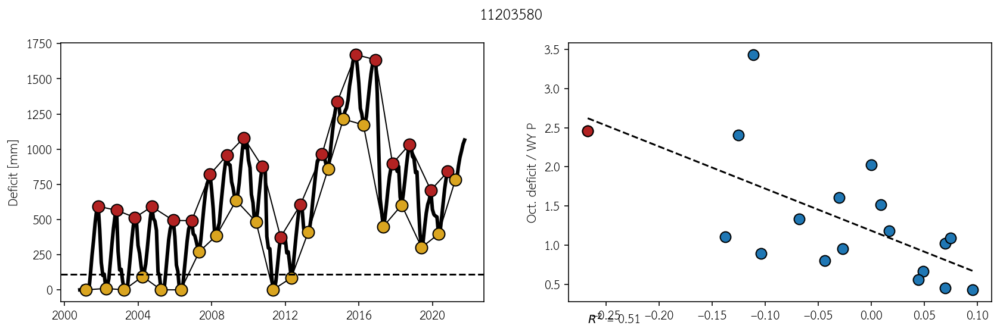

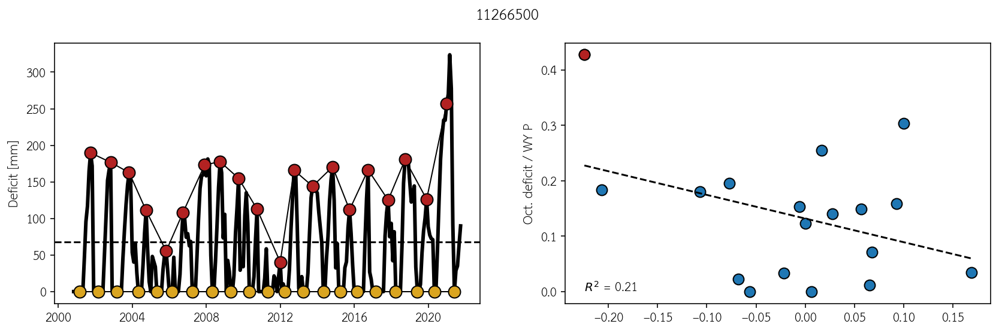

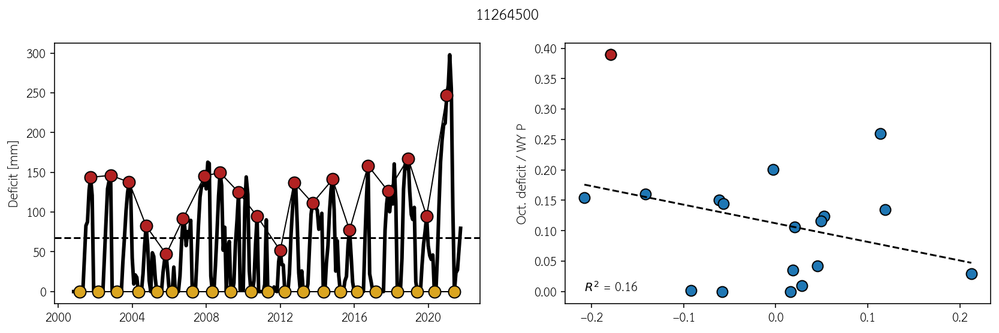

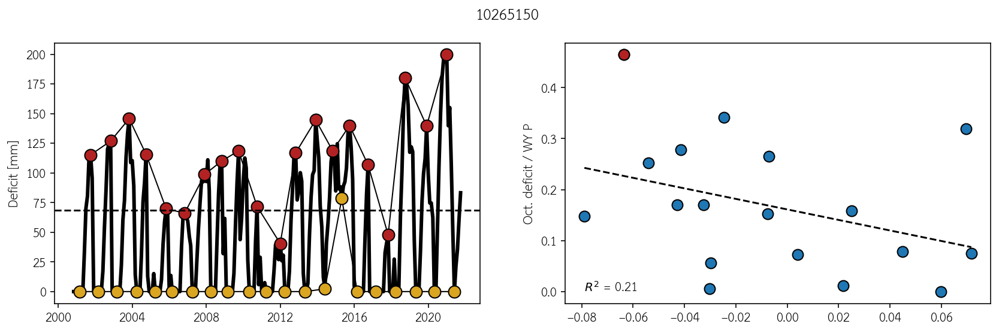

In [ ]:
# Examine deficit at all sites
r2vals = []
for site in gages.SITE_NO.values:
  size = 100
  size1=80
  fig,axs = plt.subplots(1,2,figsize = (14,4))
  station_nm = gages[gages.SITE_NO==str(site)].STATION_NM.values[0]
  df = data[station_nm]
  
  wyP = df.groupby('wy').sum().P
  springET1 = df[df.index.month.isin([4,5,6,7])].groupby('wy').sum().ET_with_modis
  springrain = df.groupby('wy').sum().spring_rain
  apr1swe = df.groupby('wy').sum().P
  res_use = residuals[str(site)]/wyP


  ax = axs[0]
  ax.plot(df.index,df.D_snodas,zorder = -1,
          c='k',lw=3)
  maxDates = df.loc[df[df.index.month.isin([8,9,10,11,12])].groupby("wy_shift")["D_snodas"].idxmax()].iloc[1:]
  minDates = df.loc[df[df.index.month.isin([2,3,4,5])].groupby("wy")["D_snodas"].idxmin()]

  ax.plot(maxDates.index.values[:-1],maxDates.D_snodas.values[:-1],#.values/apr1swe[-len(maxDates):]
           c='k',lw=1,zorder=-1)
  ax.scatter(maxDates.index.values[:-1],maxDates.D_snodas.values[:-1],#.values/apr1swe[-len(maxDates):],
             s = size, label = 'Maximum WY Deficit',
            c='firebrick',edgecolor = 'k',lw=1)

  ax.plot(minDates.index,minDates.D_snodas#.values/apr1swe[-len(minDates):]
          , c='k',lw=1,zorder=-1)
  ax.scatter(minDates.index,minDates.D_snodas,#.values/apr1swe[-len(minDates):],
             s = size, label = 'Minimum WY Deficit',
            c='goldenrod',edgecolor = 'k',lw=1)
  ax.axhline(soildepth[str(site)]['b1'],c='k',ls='--',label='Soil water storage capacity')
  if i==0:
    ax.set_ylabel('    Root zone\nstorage deficit [mm]')# (mm)')
    ax.legend(loc='upper left',frameon=False,bbox_to_anchor=(0.4,1.05))

  ax = axs[1]
  Dratio = ((df[df.index.month==10].D_snodas).values)/apr1swe
  ax.scatter(res_use,Dratio,s=size1,edgecolor = 'k')
  ax.scatter(res_use[-1:],Dratio[-1:],c='firebrick',s=size1,edgecolor = 'k')
  ax.set_ylabel('Oct. deficit / WY P')
  popt,pcov = curve_fit(func,res_use.values[3:],
                        Dratio[3:],
                        )
  xvals = np.linspace(np.nanmin(res_use),np.nanmax(res_use),5)
  yvals = func(xvals,*popt)
  ax.plot(xvals,yvals,c='k',ls='--')

  yvals = Dratio
  y_pred = func(res_use,*popt)
  residuals1 = np.array(yvals) - y_pred
  ss_res = np.sum(residuals1**2)
  ss_tot = np.sum((yvals-np.mean(yvals))**2)
  r_squared = 1 - (ss_res / ss_tot)
  r2vals.append(r_squared)
  ax.text(np.nanmin(res_use),np.nanmin(Dratio),'$R^2$ = '+'%2.2f' % (r_squared))
  axs[0].set_ylabel('Deficit [mm]')
  fig.suptitle(site)
print('median r2:',np.nanmedian(r2vals))

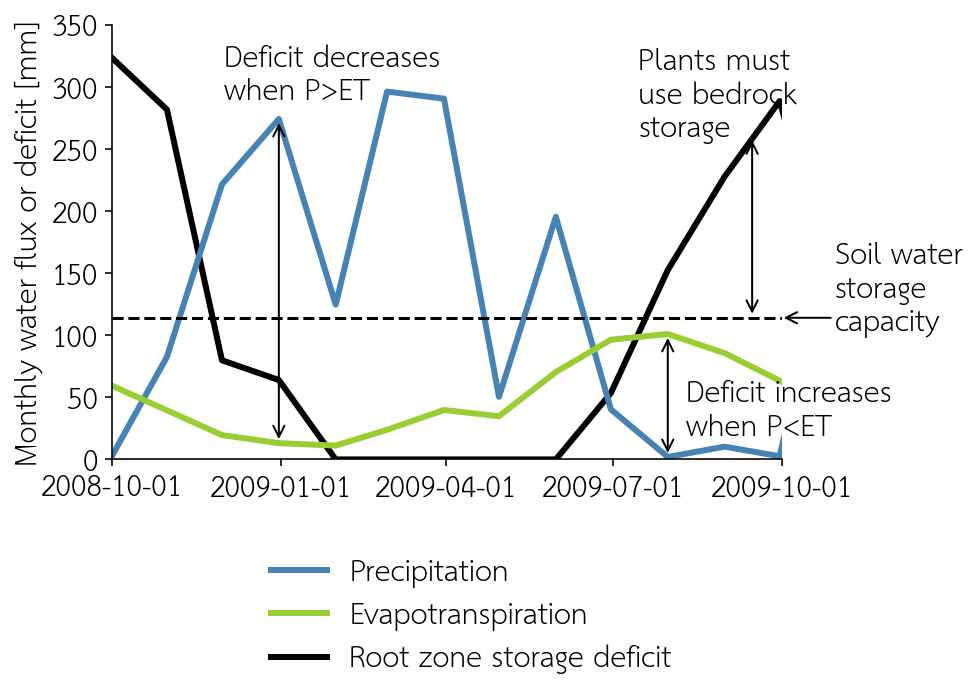

In [ ]:
# schematic graphic of how the deficit works

plt.rcParams.update({'font.size': 14})

site =10336676
size = 100
size1=80
fig,axs = plt.subplots(1,figsize = (6,4))
station_nm = gages[gages.SITE_NO==str(site)].STATION_NM.values[0]
df = data[station_nm]

wyP = df.groupby('wy').sum().P
springET1 = df[df.index.month.isin([4,5,6,7])].groupby('wy').sum().ET_with_modis
springrain = df.groupby('wy').sum().spring_rain
apr1swe = df.groupby('wy').sum().P
res_use = residuals[str(site)]/wyP


ax = axs
ax.plot(df.index,df.P,c='steelblue',lw=3,label = 'Precipitation')
ax.plot(df.index,df.ET_with_modis, c='yellowgreen',lw=3,
        label = 'Evapotranspiration')
ax.set_ylim(0,350)

# ax = axs.twinx()
ax.plot(df.index,df.D_snodas,zorder = -1,
        c='k',lw=3,label = 'Root zone storage deficit')
maxDates = df.loc[df[df.index.month.isin([8,9,10,11,12])].groupby("wy_shift")["D_snodas"].idxmax()].iloc[1:]
minDates = df.loc[df[df.index.month.isin([2,3,4,5])].groupby("wy")["D_snodas"].idxmin()]

ax.axhline(soildepth[str(site)]['b1'],c='k',ls='--')#,label='Soil water storage capacity')
if i==0:
  
  ax.legend(loc='upper left',bbox_to_anchor=(0.0,1.35))
ax.set_ylabel('Monthly water flux or deficit [mm]')# (mm)')
ax.set_xlim(pd.to_datetime('10-1-2008'),
            pd.to_datetime('10-1-2009'))

ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)

ax.text(pd.to_datetime('10-30-2009'),
        soildepth[str(site)]['b1']-10,
        'Soil water\nstorage\ncapacity')
ax.annotate('',xy = (pd.to_datetime('9-30-2009'),
                     soildepth[str(site)]['b1']),
            xytext = (pd.to_datetime('10-30-2009'),
                      soildepth[str(site)]['b1']),
            arrowprops = dict(arrowstyle="->",
                            connectionstyle="arc3"),
            clip_on=False
            )

ax.text(pd.to_datetime('7-15-2009'),
        260,
        'Plants must\nuse bedrock\nstorage')
ax.annotate('',xy = (pd.to_datetime('9-15-2009'),
                     soildepth[str(site)]['b1']),
            xytext = (pd.to_datetime('9-15-2009'),
                      260),
            arrowprops = dict(arrowstyle="<->",
                            connectionstyle="arc3"),
            clip_on=False
            )

december = df[(df.index.year==2008) & (df.index.month==12)]
ax.text(pd.to_datetime('12-1-2008'),
        290,
        'Deficit decreases\nwhen P>ET')
ax.annotate('',xy = (december.index,
                     december.ET_with_modis),
            xytext = (december.index,
                      december.P),
            arrowprops = dict(arrowstyle="<->",
                            connectionstyle="arc3"),
            clip_on=False
            )

december = df[(df.index.year==2009) & (df.index.month==7)]
ax.text(pd.to_datetime('8-10-2009'),
        20,
        'Deficit increases\nwhen P<ET')
ax.annotate('',xy = (december.index,
                     december.ET_with_modis),
            xytext = (december.index,
                      december.P),
            arrowprops = dict(arrowstyle="<->",
                            connectionstyle="arc3"),
            clip_on=False
            )
datelist = ['10-1-2008','1-1-2009','4-1-2009','7-1-2009','10-1-2009']
ax.set_xticks([pd.to_datetime(d) for d in datelist])

ax.legend(loc = 'lower left',bbox_to_anchor = (0.2,-0.55),frameon=False)

plt.savefig('deficit_example.png',format='png',dpi=300,bbox_inches='tight')

In [ ]:
# Examine deficit/winterP at all sites
r2vals = []
for site in gages.SITE_NO.values:
  station_nm = gages[gages.SITE_NO==str(site)].STATION_NM.values[0]
  df = data[station_nm]
  
  wyP = df.groupby('wy').sum().P
  springET1 = df[df.index.month.isin([4,5,6,7])].groupby('wy').sum().ET_with_modis
  springrain = df.groupby('wy').sum().spring_rain
  apr1swe = df.groupby('wy').sum().winter_P
  res_use = residuals[str(site)]/wyP


  
  Dratio = ((df[df.index.month==10].D_snodas).values)/apr1swe
  popt,pcov = curve_fit(func,res_use.values[3:],
                        Dratio[3:],
                        )
  xvals = np.linspace(np.nanmin(res_use),np.nanmax(res_use),5)
  yvals = func(xvals,*popt)

  yvals = Dratio
  y_pred = func(res_use,*popt)
  residuals1 = np.array(yvals) - y_pred
  ss_res = np.sum(residuals1**2)
  ss_tot = np.sum((yvals-np.mean(yvals))**2)
  r_squared = 1 - (ss_res / ss_tot)
  r2vals.append(r_squared)
print('median r2:',np.nanmedian(r2vals))

median r2: 0.2797563896203594


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stab

median r2: 0.25816884638280724


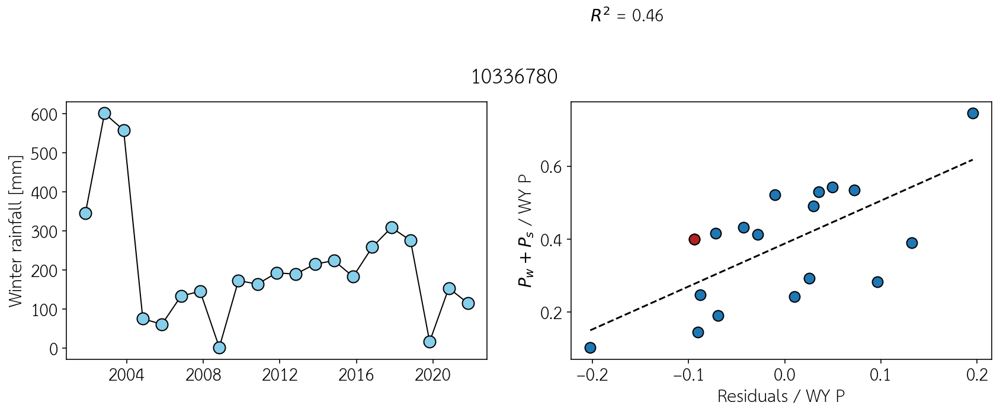

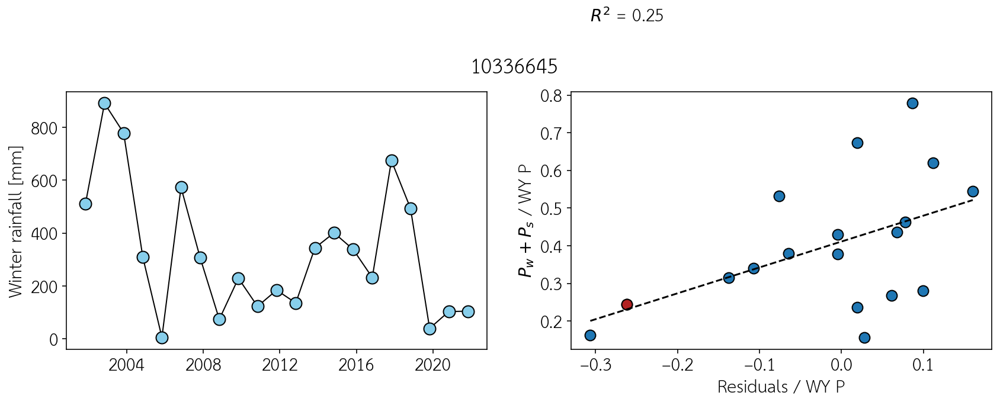

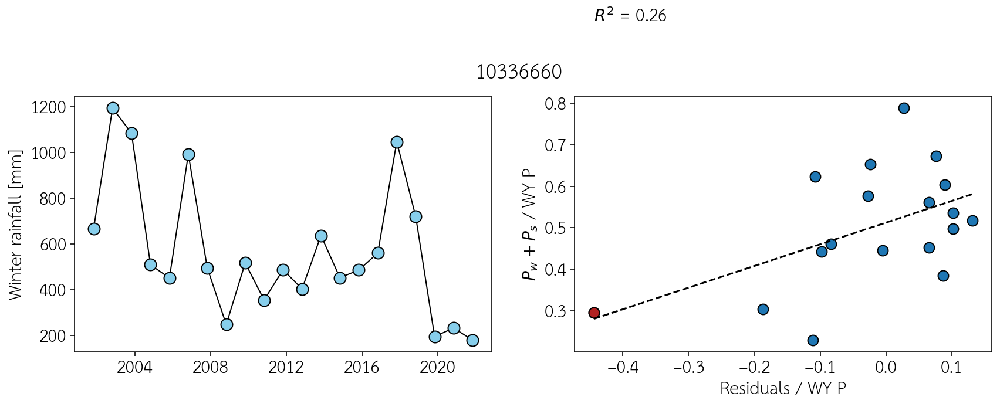

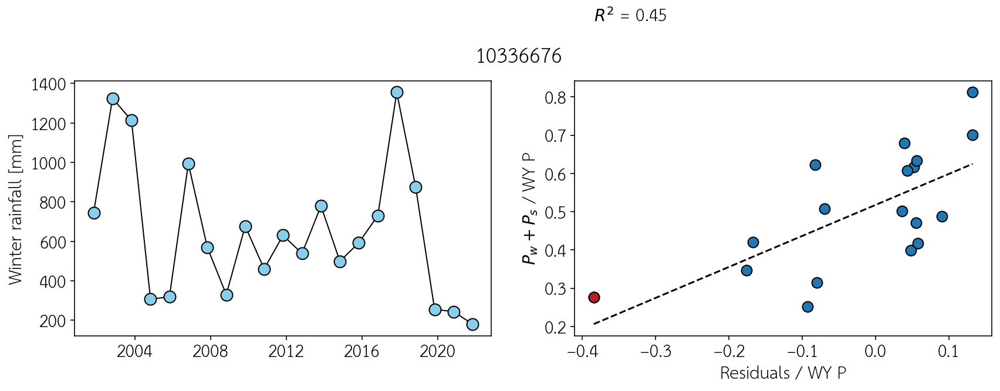

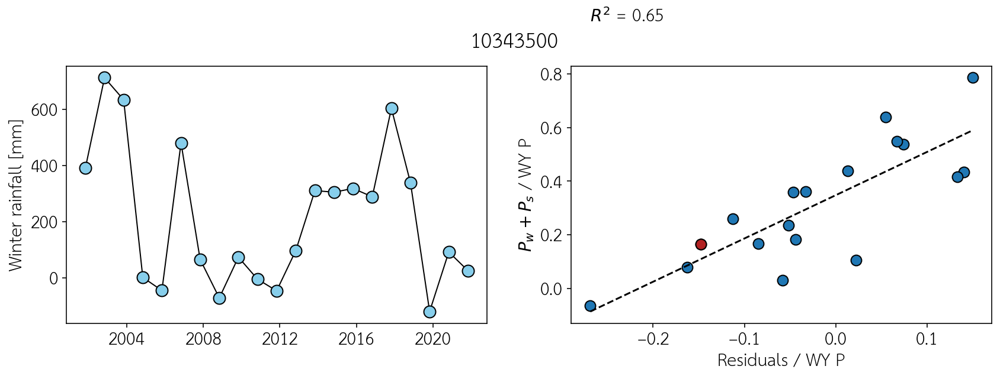

...

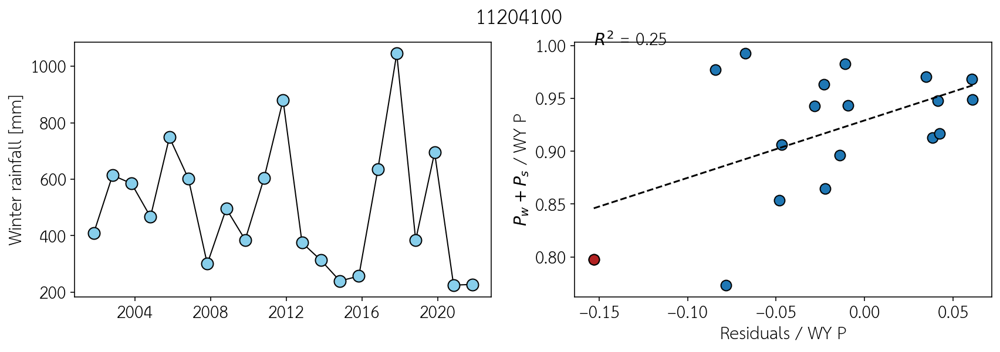

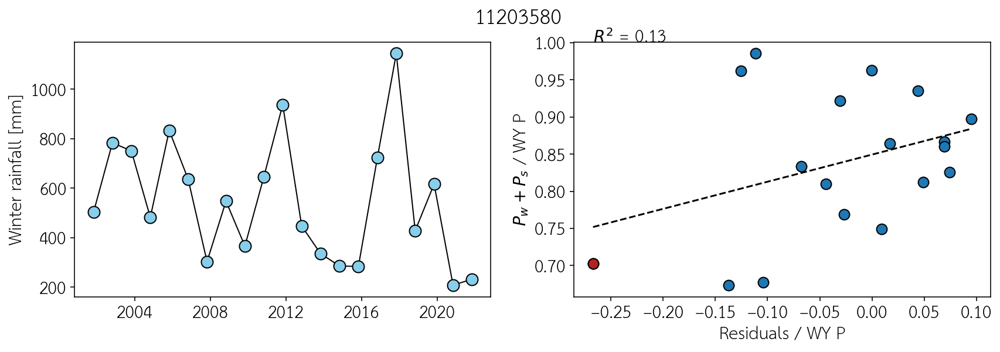

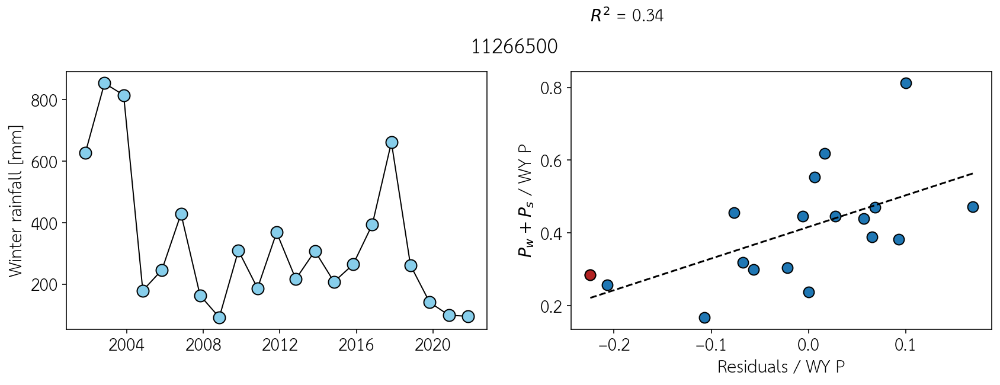

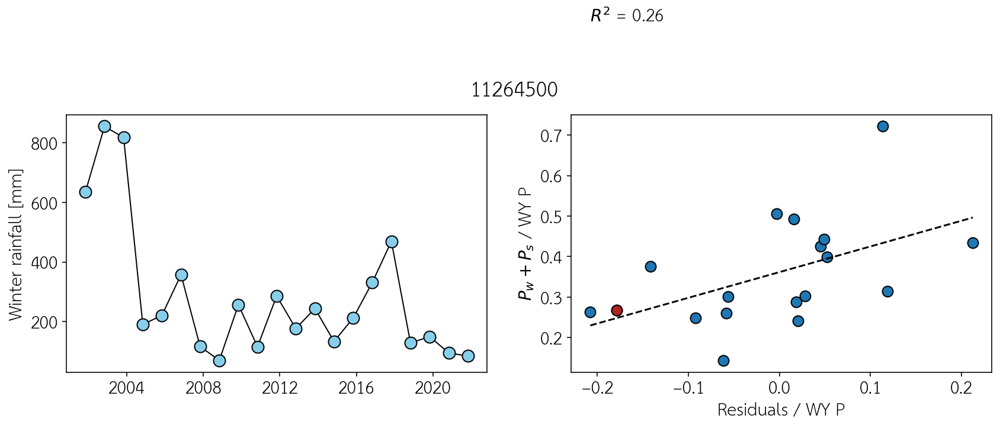

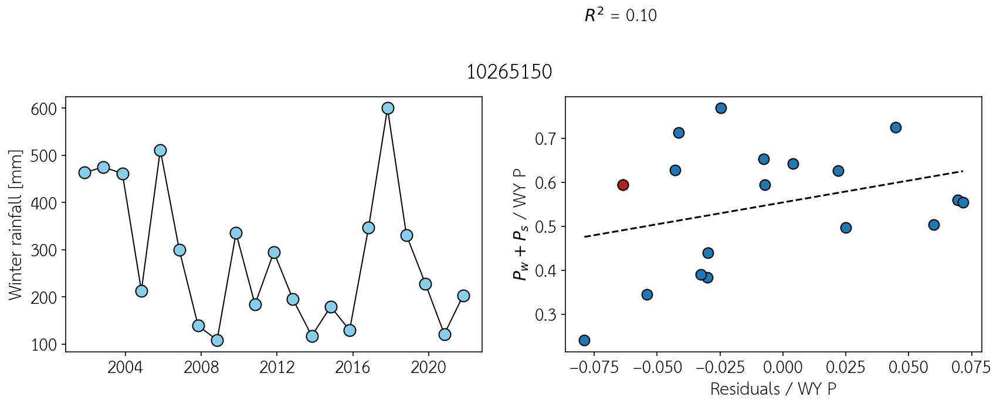

In [ ]:
# examine winter rain at all sites

r2vals = []
for site in gages.SITE_NO.values:
  size = 100
  size1=80
  fig,axs = plt.subplots(1,2,figsize = (14,4))
  station_nm = gages[gages.SITE_NO==str(site)].STATION_NM.values[0]
  df = data[station_nm]
  
  wyP = df.groupby('wy').sum().P
  winterET1 = df[df.index.month.isin([10,11,12,1,2,3])].groupby('wy').sum().ET_with_modis
  apr1swe = df.groupby('wy').sum().winter_P
  res_use = residuals[str(site)]/wyP
  winterP = df[df.index.month.isin([10,11,12,1,2,3])]
  springP = df.groupby('wy').sum().spring_rain
  winterP['winterP'] = winterP.P-winterP.snowfall
  winterP = winterP.groupby('wy').sum().winterP

  ax = axs[0]
  ax.scatter(wys,winterP, s = size, edgecolor = 'k', lw=1,c='skyblue')
  ax.plot(wys,winterP,c='k',lw=1,zorder = -1)
  # ax.set_ylim(max(meltrates[int(site)])*1.1,min(meltrates[int(site)])*0.9)
  ax.set_ylabel('Winter rainfall [mm]')


  ax = axs[1]
  mplot = (winterP+springP)/wyP
  # mplot = np.where(mplot<0,np.nan,mplot)
  ax.scatter(res_use[-len(mplot):],mplot,s=size1,edgecolor = 'k')
  ax.scatter(res_use[-1:],mplot[-1:],c='firebrick',s=size1,edgecolor = 'k')
  ax.set_ylabel('$P_w+P_s$ / WY P')
  ax.set_xlabel('Residuals / WY P')
  mask = (np.isfinite(res_use)) & (np.isfinite(mplot)) 
  popt,pcov = curve_fit(func,res_use[mask],
                        mplot[mask],
                        )
  xvals = np.linspace(np.nanmin(res_use),np.nanmax(res_use),5)
  yvals = func(xvals,*popt)
  ax.plot(xvals,yvals,c='k',ls='--')

  mask1 = (np.isfinite(res_use)) & (np.isfinite(mplot)) 
  yvals = mplot[mask1]
  y_pred = func(res_use[-len(mplot):].values[mask1],*popt)
  residuals1 = np.array(yvals) - y_pred
  ss_res = np.sum(residuals1**2)
  ss_tot = np.sum((yvals-np.mean(yvals))**2)
  r_squared = 1 - (ss_res / ss_tot)
  r2vals.append(r_squared)
  ax.text(np.nanmin(res_use),np.nanmax(mplot),'$R^2$ = '+'%2.2f' % (r_squared))
  fig.suptitle(site)
print('median r2:',np.nanmedian(r2vals))

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stab

median r2: 0.38003414888730447


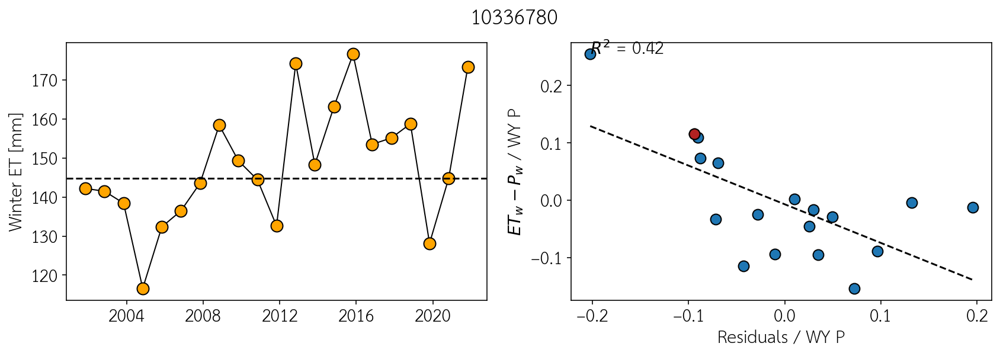

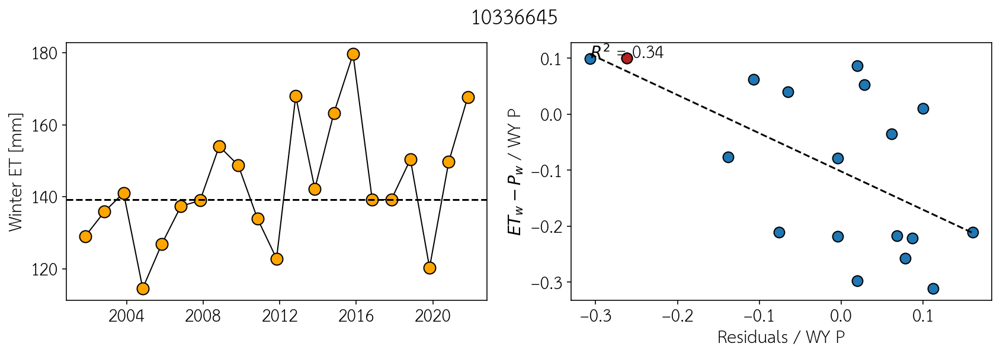

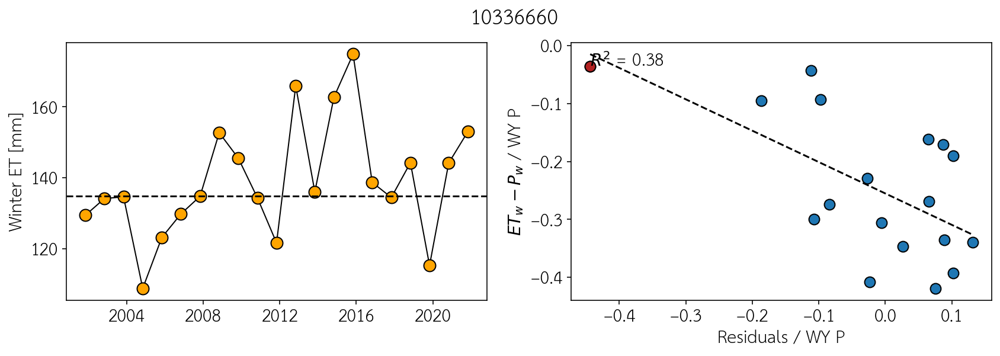

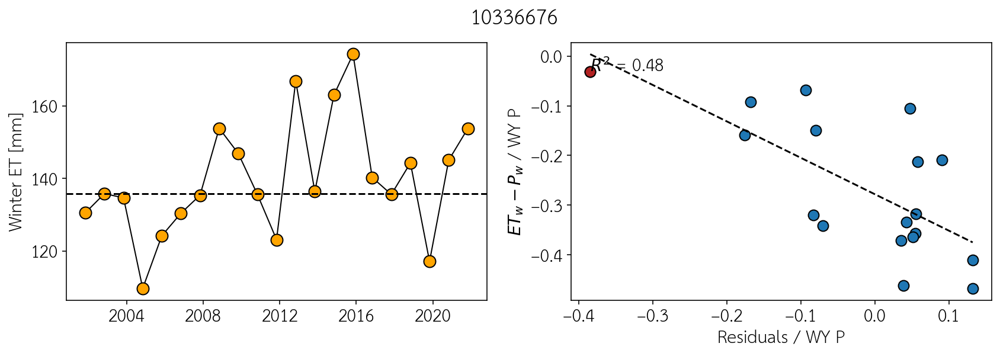

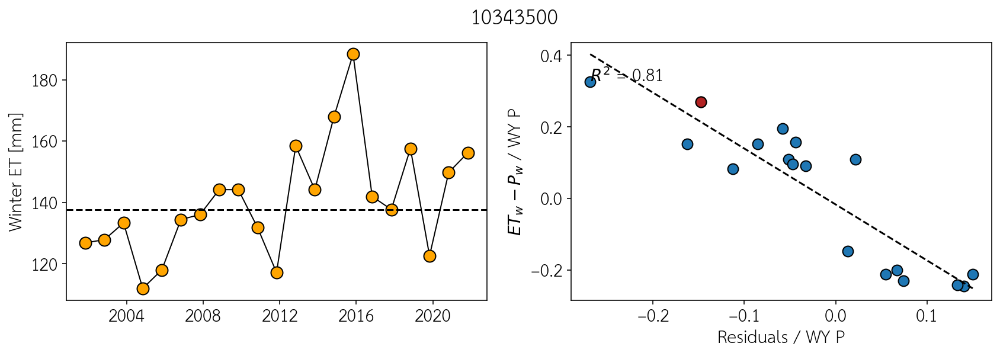

...

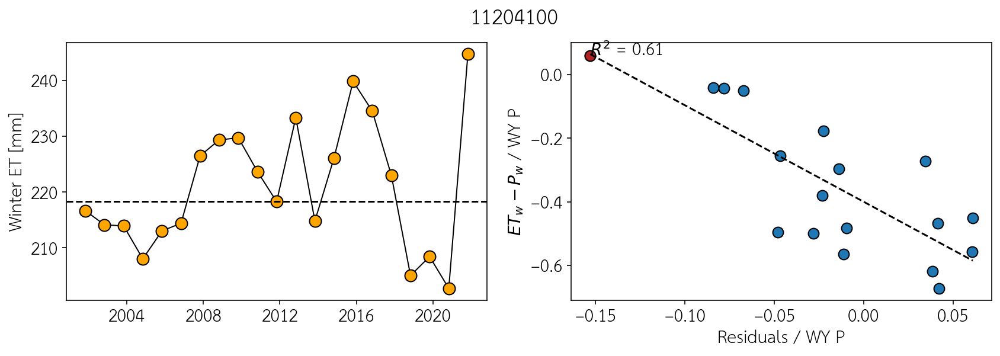

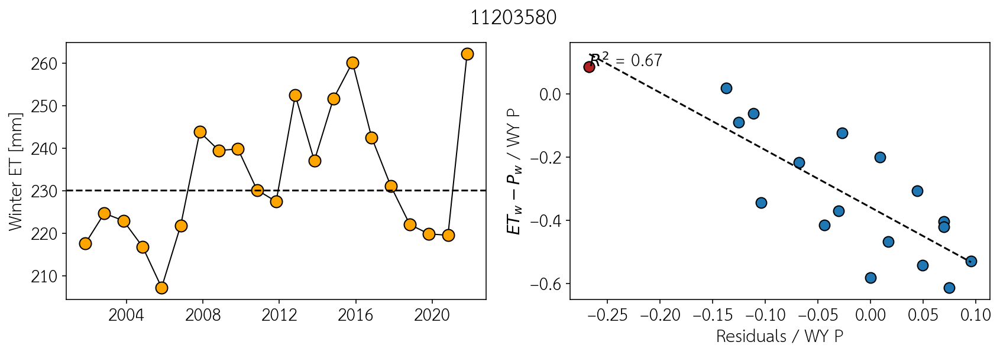

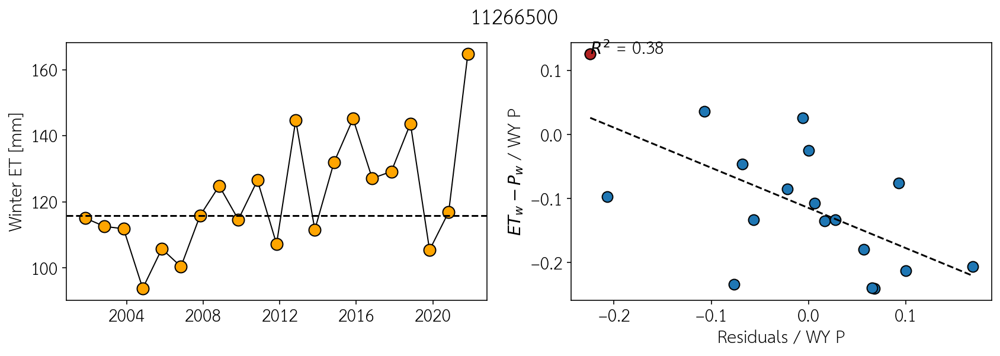

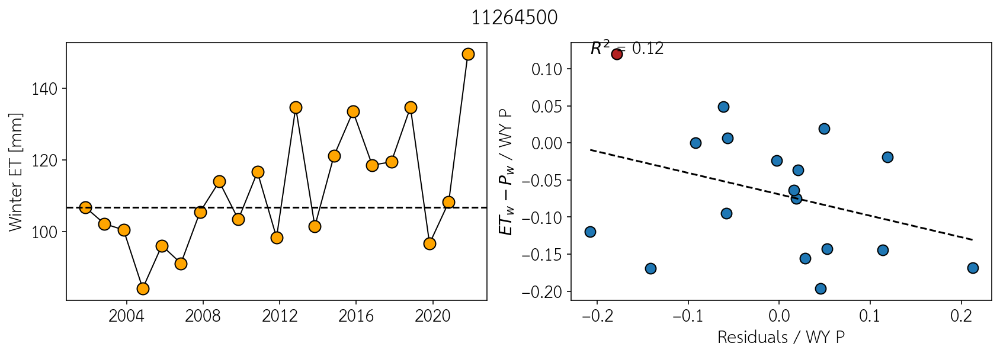

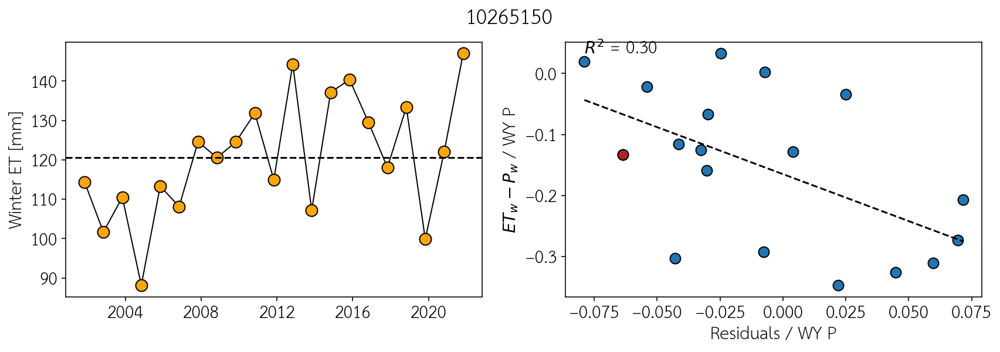

In [ ]:
# Examine winter ET at all sites
r2vals = []
for site in gages.SITE_NO.values:
  size = 100
  size1=80
  fig,axs = plt.subplots(1,2,figsize = (14,4))
  station_nm = gages[gages.SITE_NO==str(site)].STATION_NM.values[0]
  # ax.set_title(station_nm)
  df = data[station_nm]
  
  ax = axs[0]
  wyP = df.groupby('wy').sum().P
  springET1 = df[df.index.month.isin([10,11,12,1,2,3])].groupby('wy').sum().ET_with_modis
  springrain = df.groupby('wy').sum().spring_rain
  apr1swe = df.groupby('wy').sum().winter_P
  res_use = residuals[str(site)]/wyP
  divby =(springET1).values[-len(apr1swe):] 
  divby = springET1#/wyP
  ax.plot(wys[-len(divby):],divby, c='k',lw=1,zorder=-1)
  ax.scatter(wys[-len(divby):],divby, s = size, label = 'winter ET / WY P',
            c='orange',edgecolor = 'k',lw=1)
  medianET = np.nanmedian(divby)
  ax.axhline(medianET,ls='--',c='k',)
  divby = springET1/wyP
  
  if i==0:
    ax.set_ylabel('Spring ET / WY P')
    ax.text(pd.to_datetime('11-1-2000'),medianET*1.05,'median')
  # ax1 = ax.twinx()
  # ESIsite = ESI[[str(site)]]
  # ESIsite['wy'] = np.where(ESIsite.index.month.isin([10,11,12]),
  #                         ESIsite.index.year+1,ESIsite.index.year)
  # ESImed = ESIsite[ESIsite.index.month.isin([4,5,6,7])].groupby('wy').median()
  # ax1.plot(wys[-len(ESImed):],ESImed,c='k',lw=1,zorder=-1)
  # ax1.scatter(wys[-len(ESImed):],ESImed,
  #             c='olivedrab',edgecolor = 'k',lw=1,s=size, label = 'ESI')
  # ax1.set_ylabel('Median Spring ESI')
  # ax1.set_ylim(-2.4,2.6)
  if i==0:
    ax.legend(frameon=False,loc='lower left')
    # ax1.legend(frameon=False,loc='lower left',bbox_to_anchor=(0,0.1))


  
  # ax = axs[1]
  # ax.scatter(res_use,divby[-len(res_use):],s=size1,edgecolor = 'k')
  # ax.scatter(res_use[-1:],divby[-1:],c='firebrick',s=size1,edgecolor = 'k',label='2021')
  # ax.set_ylabel('winter ET / WY P')

  # popt,pcov = curve_fit(func,res_use.values[3:],
  #                       divby[-len(res_use):][3:],
  #                       )
  # xvals = np.linspace(np.nanmin(res_use),np.nanmax(res_use),5)
  # yvals = func(xvals,*popt)
  # ax.plot(xvals,yvals,c='k',ls='--')

  # yvals = divby[-len(res_use):]
  # y_pred = func(res_use,*popt)
  # residuals1 = np.array(yvals) - y_pred
  # ss_res = np.sum(residuals1**2)
  # ss_tot = np.sum((yvals-np.mean(yvals))**2)
  # r_squared = 1 - (ss_res / ss_tot)
  # r2vals.append(r_squared)
  # ax.text(np.nanmin(res_use),np.nanmin(divby),'$R^2$ = '+'%2.2f' % (r_squared))
  # fig.suptitle(site)

  ax = axs[1]
  winterP = df[df.index.month.isin([10,11,12,1,2,3])]
  winterP['winterP'] = winterP.P-winterP.snowfall
  winterP = winterP.groupby('wy').sum().winterP
  mplot = -(winterP-springET1)/wyP
  # mplot = np.where(mplot<0,np.nan,mplot)
  ax.scatter(res_use[-len(mplot):],mplot,s=size1,edgecolor = 'k')
  ax.scatter(res_use[-1:],mplot[-1:],c='firebrick',s=size1,edgecolor = 'k')
  ax.set_ylabel('$ET_w-P_w$ / WY P')
  ax.set_xlabel('Residuals / WY P')
  mask = (np.isfinite(res_use)) & (np.isfinite(mplot)) 
  popt,pcov = curve_fit(func,res_use[mask],
                        mplot[mask],
                        )
  xvals = np.linspace(np.nanmin(res_use),np.nanmax(res_use),5)
  yvals = func(xvals,*popt)
  ax.plot(xvals,yvals,c='k',ls='--')

  mask1 = (np.isfinite(res_use)) & (np.isfinite(mplot)) 
  yvals = mplot[mask1]
  y_pred = func(res_use[-len(mplot):].values[mask1],*popt)
  residuals1 = np.array(yvals) - y_pred
  ss_res = np.sum(residuals1**2)
  ss_tot = np.sum((yvals-np.mean(yvals))**2)
  r_squared = 1 - (ss_res / ss_tot)
  r2vals.append(r_squared)
  ax.text(np.nanmin(res_use),np.nanmax(mplot),'$R^2$ = '+'%2.2f' % (r_squared))
  fig.suptitle(site)
  axs[0].set_ylabel('Winter ET [mm]')

print('median r2:',np.nanmedian(r2vals))

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:55: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:64: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stab

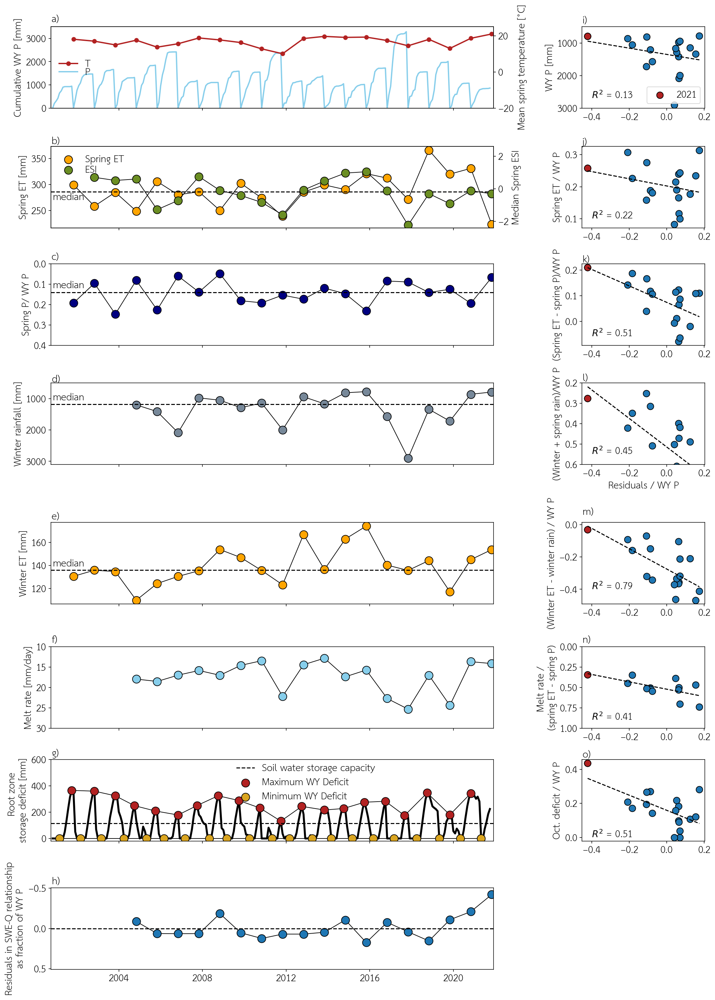

In [ ]:
# plot all together as display figure for one site
import matplotlib.gridspec as gridspec
%matplotlib inline
plt.rcParams.update({'font.size': 14})

def func(x,a,b):
  return a*x+b

size = 150
size1 = 100

fig2 = plt.figure(constrained_layout=True, figsize = (15,21))
spec2 = gridspec.GridSpec(ncols=3, nrows=8, figure=fig2)

ax0 = fig2.add_subplot(spec2[0, :2]) 
ax1 = fig2.add_subplot(spec2[1, :2]) 
ax2 = fig2.add_subplot(spec2[2, :2]) 
ax3 = fig2.add_subplot(spec2[3, :2]) 
ax4 = fig2.add_subplot(spec2[4, :2]) 
ax5 = fig2.add_subplot(spec2[5, :2])
ax51 = fig2.add_subplot(spec2[6, :2]) 
ax52 = fig2.add_subplot(spec2[7, :2])
ax60 = fig2.add_subplot(spec2[0, 2]) 
ax6 = fig2.add_subplot(spec2[1, 2]) 
ax7 = fig2.add_subplot(spec2[2, 2]) 
ax8 = fig2.add_subplot(spec2[3, 2]) 
ax9 = fig2.add_subplot(spec2[4, 2])
ax10 = fig2.add_subplot(spec2[5, 2]) 
ax11 = fig2.add_subplot(spec2[6, 2]) 

# ax10 = fig2.add_subplot(spec2[0, 2]) 


axs = [[ax0,ax60],
       [ax1,ax6,],
       [ax2,ax7,],
       [ax3,ax8,],
       [ax4,ax9],
       [ax5,ax10],
       [ax51,ax11],
       [ax52,0,]]

i=0
for site in [10336676]:
  ax = axs[0][i]
  station_nm = gages[gages.SITE_NO==str(site)].STATION_NM.values[0]
  df = data[station_nm]
  cumP = df[['P']]
  cumP['wy'] = np.where(cumP.index.month.isin([10,11,12]),
                        cumP.index.year+1,cumP.index.year)
  cumPvals = []
  for wy in cumP.wy.drop_duplicates():
    wyP0 = [0]+list(cumP[cumP.wy==wy].P.cumsum().values)[1:]
    cumPvals = cumPvals + wyP0
  cumP['cumP'] = cumPvals
  ax.plot(cumP.index,cumP.cumP,lw=2,c='skyblue',label='P')
  if i==0:
    ax.set_ylabel('Cumulative WY P [mm]')
    ax.legend(frameon=False,loc='upper left',bbox_to_anchor = (0,0.6))
  ax.set_ylim(0,3500)
  ax1 = ax.twinx()
  modisT_all = modisT[[str(site)]]
  modisT_all['wy'] = np.where(modisT_all.index.month.isin([10,11,12]),
                              modisT_all.index.year+1,modisT_all.index.year)
  modisT_spring = modisT_all[modisT_all.index.month.isin([4,5,6,7])].groupby('wy').mean()
  apr1swe = df.groupby('wy').sum().winter_P
  res_use = residuals[str(site)]/apr1swe

  


  ax = axs[0][i+1]
  ax.scatter(res_use,apr1swe,s=size1,edgecolor = 'k')
  ax.scatter(res_use[-1:],apr1swe[-1:],c='firebrick',s=size1,edgecolor = 'k',label='2021')
  ax.legend(loc='lower right')
  ax.set_ylabel('WY P [mm]')
  ax.set_ylim(3000,500)

  popt,pcov = curve_fit(func,res_use.values[3:],
                        apr1swe[-len(res_use):][3:],
                        )
  xvals = np.linspace(np.nanmin(res_use),np.nanmax(res_use),5)
  yvals = func(xvals,*popt)
  ax.plot(xvals,yvals,c='k',ls='--')

  yvals = apr1swe[-len(res_use):]
  y_pred = func(res_use,*popt)
  residuals1 = np.array(yvals) - y_pred
  ss_res = np.sum(residuals1**2)
  ss_tot = np.sum((yvals-np.mean(yvals))**2)
  r_squared = 1 - (ss_res / ss_tot)
  ax.text(-0.4,2700,'$R^2$ = '+'%2.2f' % (r_squared))



  ax1.plot(wys,modisT_spring[str(site)],c='firebrick',lw=2,marker='o',label='T')
  ax1.set_ylabel('Mean spring temperature [$^{\circ}$C]')
  ax1.set_ylim(-20,25)
  if i==0:
    ax1.legend(frameon=False,loc='upper left',bbox_to_anchor = (0,0.7))

  ax = axs[1][i]
  wyP = df.groupby('wy').sum().P
  springET1 = df[df.index.month.isin([4,5,6,7])].groupby('wy').sum().ET_with_modis
  springrain = df.groupby('wy').sum().spring_rain
  divby =(springET1).values[-len(apr1swe):] 
  
  ax.plot(wys[-len(divby):],divby, 
          c='k',lw=1,zorder=-1)
  ax.scatter(wys[-len(divby):],divby, 
             s = size, label = 'Spring ET',
            c='orange',edgecolor = 'k',lw=1)
  medianET = np.nanmedian(divby)
  ax.axhline(medianET,ls='--',c='k',)
  divby = springET1/wyP

  
  if i==0:
    ax.set_ylabel('Spring ET [mm]')
    ax.text(pd.to_datetime('11-1-2000'),270,#medianET*1.05,
            'median')
  ax1 = ax.twinx()

  ESIsite = ESI[[str(site)]]
  ESIsite['wy'] = np.where(ESIsite.index.month.isin([10,11,12]),
                          ESIsite.index.year+1,ESIsite.index.year)
  ESImed = ESIsite[ESIsite.index.month.isin([4,5,6,7])].groupby('wy').median()
  ax1.plot(wys[-len(ESImed):],ESImed,c='k',lw=1,zorder=-1)
  ax1.scatter(wys[-len(ESImed):],ESImed,
              c='olivedrab',edgecolor = 'k',lw=1,s=size, label = 'ESI')
  ax1.set_ylabel('Median Spring ESI')
  ax1.set_ylim(-2.4,2.6)
  if i==0:
    ax.legend(frameon=False,loc='upper left')
    ax1.legend(frameon=False,loc='upper left',bbox_to_anchor=(0,0.87))


  
  ax = axs[1][1+i]
  ax.scatter(res_use,divby[-len(res_use):],s=size1,edgecolor = 'k')
  ax.scatter(res_use[-1:],divby[-1:],c='firebrick',s=size1,edgecolor = 'k',label='2021')
  ax.set_ylabel('Spring ET / WY P')

  popt,pcov = curve_fit(func,res_use.values[3:],
                        divby[-len(res_use):][3:],
                        )
  xvals = np.linspace(np.nanmin(res_use),np.nanmax(res_use),5)
  yvals = func(xvals,*popt)
  ax.plot(xvals,yvals,c='k',ls='--')

  yvals = divby[-len(res_use):]
  y_pred = func(res_use,*popt)
  residuals1 = np.array(yvals) - y_pred
  ss_res = np.sum(residuals1**2)
  ss_tot = np.sum((yvals-np.mean(yvals))**2)
  r_squared = 1 - (ss_res / ss_tot)
  ax.text(-0.4,.1,'$R^2$ = '+'%2.2f' % (r_squared))

  ax = axs[2][i]
  wyP = df.groupby('wy').sum().P
  divbyP =(springrain)/wyP#apr1swe
  ax.plot(wys[-len(divbyP):],divbyP, c='k',lw=1,zorder=-1)
  ax.scatter(wys[-len(divbyP):],divbyP, s = size, label = '(Spring ET - spring P) / WY P',
            c='navy',edgecolor = 'k',lw=1)
  medianP = np.nanmedian(divbyP)
  ax.axhline(medianP,ls='--',c='k',)
  ax.set_ylim(0.4,0)
  
  if i==0:
    ax.set_ylabel('Spring P/ WY P')
    ax.text(pd.to_datetime('11-1-2000'),0.85*medianP,'median')


  
  ax = axs[2][1+i]
  dp = (springET1-springrain)/apr1swe
  ax.scatter(res_use,dp[-len(res_use):],s=size1,edgecolor = 'k')
  ax.scatter(res_use[-1:],dp[-1:],c='firebrick',s=size1,edgecolor = 'k',label='2021')
  ax.set_ylabel('(Spring ET - spring P)/WY P')

  divbyP = dp
  popt,pcov = curve_fit(func,res_use.values[3:],
                        divbyP[-len(res_use):][3:],
                        )
  xvals = np.linspace(np.nanmin(res_use),np.nanmax(res_use),5)
  yvals = func(xvals,*popt)
  ax.plot(xvals,yvals,c='k',ls='--')

  yvals = divbyP[-len(res_use):]
  y_pred = func(res_use,*popt)
  residuals1 = np.array(yvals) - y_pred
  ss_res = np.sum(residuals1**2)
  ss_tot = np.sum((yvals-np.mean(yvals))**2)
  r_squared = 1 - (ss_res / ss_tot)
  ax.text(-0.4,-0.06,'$R^2$ = '+'%2.2f' % (r_squared))

  

  ax = axs[6][i]
  ax.plot(df.index,df.D_snodas,zorder = -1,
          c='k',lw=3)
  maxDates = df.loc[df[df.index.month.isin([8,9,10,11,12])].groupby("wy_shift")["D_snodas"].idxmax()].iloc[1:]
  minDates = df.loc[df[df.index.month.isin([2,3,4,5])].groupby("wy")["D_snodas"].idxmin()]

  ax.plot(maxDates.index.values[:-1],maxDates.D_snodas.values[:-1],
           c='k',lw=1,zorder=-1)
  ax.scatter(maxDates.index.values[:-1],maxDates.D_snodas.values[:-1],
             s = size, label = 'Maximum WY Deficit',
            c='firebrick',edgecolor = 'k',lw=1)

  ax.plot(minDates.index,minDates.D_snodas
          , c='k',lw=1,zorder=-1)
  ax.scatter(minDates.index,minDates.D_snodas,
             s = size, label = 'Minimum WY Deficit',
            c='goldenrod',edgecolor = 'k',lw=1)
  ax.axhline(soildepth[str(site)]['b1'],c='k',ls='--',label='Soil water storage capacity')
  if i==0:
    ax.set_ylabel('    Root zone\nstorage deficit [mm]')
    ax.legend(loc='upper left',frameon=False,bbox_to_anchor=(0.4,1.05))
  ax.set_ylim(-20,600)

  ax = axs[6][1+i]
  Dratio = ((df[df.index.month==10].D_snodas).values)/apr1swe
  ax.scatter(res_use,Dratio,s=size1,edgecolor = 'k')
  ax.scatter(res_use[-1:],Dratio[-1:],c='firebrick',s=size1,edgecolor = 'k')
  ax.set_ylabel('Oct. deficit / WY P')
  popt,pcov = curve_fit(func,res_use.values[3:],
                        Dratio[3:],
                        )
  xvals = np.linspace(np.nanmin(res_use),np.nanmax(res_use),5)
  yvals = func(xvals,*popt)
  ax.plot(xvals,yvals,c='k',ls='--')

  yvals = Dratio
  y_pred = func(res_use,*popt)
  residuals1 = np.array(yvals) - y_pred
  ss_res = np.sum(residuals1**2)
  ss_tot = np.sum((yvals-np.mean(yvals))**2)
  r_squared = 1 - (ss_res / ss_tot)
  ax.text(-0.4,0,'$R^2$ = '+'%2.2f' % (r_squared))

  ax = axs[5][i]
  ax.scatter(wys[3:],meltrates[site], s = size, edgecolor = 'k', lw=1,c='skyblue')
  ax.plot(wys[3:],meltrates[site],c='k',lw=1,zorder = -1)
  ax.set_ylim(max(meltrates[site])*1.1,min(meltrates[site])*0.9)
  ax.set_ylabel('Melt rate [mm/day]')
  ax.set_ylim(30,10)


  ax = axs[5][i+1]
  mplot = meltrates[site].values/((springET1-springrain).values[-len(meltrates):]/4)
  mplot = np.where(mplot<0,np.nan,mplot)
  ax.scatter(res_use[-len(mplot):],mplot,s=size1,edgecolor = 'k')
  ax.scatter(res_use[-1:],mplot[-1:],c='firebrick',s=size1,edgecolor = 'k')
  ax.set_ylabel('Melt rate / \n(spring ET - spring P)')
  
  mask = (np.isfinite(res_use.values[3:])) & (np.isfinite(mplot)) & (mplot<1)
  popt,pcov = curve_fit(func,res_use.values[3:][mask],
                        mplot[mask],
                        )
  xvals = np.linspace(np.nanmin(res_use),np.nanmax(res_use),5)
  yvals = func(xvals,*popt)
  ax.plot(xvals,yvals,c='k',ls='--')

  mask1 = (np.isfinite(res_use.values[3:])) & (np.isfinite(mplot)) & (mplot<1) & (res_use.values[3:]<1)
  yvals = mplot[mask1]
  y_pred = func(res_use[-len(mplot):].values[mask1],*popt)
  residuals1 = np.array(yvals) - y_pred
  ss_res = np.sum(residuals1**2)
  ss_tot = np.sum((yvals-np.mean(yvals))**2)
  r_squared = 1 - (ss_res / ss_tot)
  ax.text(-0.4,0.9,'$R^2$ = '+'%2.2f' % (r_squared))
  ax.set_ylim(1,0)


  ax = axs[3][i]
  # snowfrac = df.groupby('wy').sum()
  # snowfrac = snowfrac.snowfall/snowfrac.P
  winter_rain = data[station_nm]
  winter_rain = winter_rain[winter_rain.index.month.isin([10,11,12,1,2,3])]
  winter_rain['winter_rain'] = winter_rain.P-winter_rain.snowfall
  winter_rain = winter_rain.groupby('wy').sum()
  ax.scatter(wys[3:],winter_rain.P.iloc[3:], s = size, edgecolor = 'k', lw=1,c='lightslategrey')
  ax.plot(wys[3:],winter_rain.P.iloc[3:],c='k',lw=1,zorder = -1)
  # ax.set_ylim(max(meltrates[site])*1.1,min(meltrates[site])*0.9)
  ax.set_ylabel('Winter rainfall [mm]')
  snowmed = np.nanmedian(winter_rain.P.iloc[3:])
  ax.axhline(snowmed,ls='--',c='k')
  ax.text(pd.to_datetime('11-1-2000'),1050,'median')
  ax.set_ylim(3100,500)

  ax = axs[3][i+1]
  mplot = ((winter_rain.winter_rain+springrain)/wyP).iloc[3:]
  # mplot = np.where(mplot<0,np.nan,mplot)
  ax.scatter(res_use[-len(mplot):],mplot,s=size1,edgecolor = 'k')
  ax.scatter(res_use[-1:],mplot[-1:],c='firebrick',s=size1,edgecolor = 'k')
  ax.set_ylabel('(Winter + spring rain)/WY P')
  
  mask = (np.isfinite(res_use.values[3:])) & (np.isfinite(mplot)) 
  popt,pcov = curve_fit(func,res_use.values[3:][mask],
                        mplot[mask],
                        )
  xvals = np.linspace(np.nanmin(res_use),np.nanmax(res_use),5)
  yvals = func(xvals,*popt)
  ax.plot(xvals,yvals,c='k',ls='--')

  mask1 = (np.isfinite(res_use.values[3:])) & (np.isfinite(mplot)) #& (mplot<1) & (res_use.values[3:]<1)
  yvals = mplot[mask1]
  y_pred = func(res_use[-len(mplot):].values[mask1],*popt)
  residuals1 = np.array(yvals) - y_pred
  ss_res = np.sum(residuals1**2)
  ss_tot = np.sum((yvals-np.mean(yvals))**2)
  r_squared = 1 - (ss_res / ss_tot)
  ax.text(-0.4,0.55,'$R^2$ = '+'%2.2f' % (r_squared))
  ax.set_ylim(0.6,0.2)
  ax.set_xlabel('Residuals / WY P')


  ax = axs[4][i]
  wyP = df.groupby('wy').sum().P
  winterET1 = df[df.index.month.isin([10,11,12,1,2,3])].groupby('wy').sum().ET_with_modis
  divbyP =(winterET1)/wyP
  ax.plot(wys[-len(divbyP):],winterET1, c='k',lw=1,zorder=-1)
  ax.scatter(wys[-len(divbyP):],winterET1, s = size, label = 'Winter ET',
            c='orange',edgecolor = 'k',lw=1)
  medianP = np.nanmedian(winterET1)
  ax.axhline(medianP,ls='--',c='k',)
  # ax.set_ylim(0.4,0)
  
  if i==0:
    ax.set_ylabel('Winter ET [mm]')
    ax.text(pd.to_datetime('11-1-2000'),1.025*medianP,'median')


  
  ax = axs[4][1+i]
  dp = (winter_rain.ET_with_modis-winter_rain.winter_rain)/wyP
  ax.scatter(res_use,dp[-len(res_use):],s=size1,edgecolor = 'k')
  ax.scatter(res_use[-1:],dp[-1:],c='firebrick',s=size1,edgecolor = 'k',label='2021')
  ax.set_ylabel('(Winter ET - winter rain) / WY P')

  divbyP = dp
  popt,pcov = curve_fit(func,res_use.values[3:],
                        divbyP[-len(res_use):][3:],
                        )
  xvals = np.linspace(np.nanmin(res_use),np.nanmax(res_use),5)
  yvals = func(xvals,*popt)
  ax.plot(xvals,yvals,c='k',ls='--')

  yvals = divbyP[-len(res_use):]
  y_pred = func(res_use,*popt)
  residuals1 = np.array(yvals) - y_pred
  ss_res = np.sum(residuals1**2)
  ss_tot = np.sum((yvals-np.mean(yvals))**2)
  r_squared = 1 - (ss_res / ss_tot)
  ax.text(-0.4,-.4,'$R^2$ = '+'%2.2f' % (r_squared))


  ax = axs[7][i]
  
  ax.scatter(wys[-len(res_use):],res_use, s = size, edgecolor = 'k', lw=1,)
  
  ax.plot(wys[-len(res_use):],res_use, lw = 1, c= 'k',zorder = -1)
  maxres = np.nanmax(abs(res_use))*1.2
  ax.set_ylim(maxres,-maxres)
  ax.axhline(0,ls='--',c='k')
  if i==0:
    ax.set_ylabel('Residuals in SWE-Q relationship\nas fraction of WY P')
  i+=2

for ax in [ax0,ax1,ax2,ax3,ax4,ax5,ax51,]:
  ax.set_xlim(pd.to_datetime('10-1-2000'),
              pd.to_datetime('12-1-2021'))
  ax.set_xticklabels([])
ax52.set_xlim(pd.to_datetime('10-1-2000'),
              pd.to_datetime('12-1-2021'))

# for ax in [ax52,]:
#   ax.set_xticklabels([])


xv = pd.to_datetime('10-15-2000')
xv1 = -0.45
ax0.text(xv,3700,'a)')
ax1.text(xv,2.75,'b)')
ax2.text(xv,-0.02,'c)')
ax4.text(xv,180,'e)')
ax5.text(xv,9,'f)')
ax51.text(xv,625,'g)')
ax3.text(xv,480,'d)')
ax52.text(xv,-0.55,'h)')
ax60.text(xv1,400,'i)')
ax6.text(xv1,0.33,'j)')
ax7.text(xv1,0.23,'k)')
ax8.text(xv1,0.19,'l)')
ax10.text(xv1,-0.05,'n)')
ax11.text(xv1,0.47,'o)')
ax9.text(xv1,0.06,'m)')

plt.savefig('all_hypothesis_data.png',format='png',dpi=300)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stab

(730394.0, 738125.0)

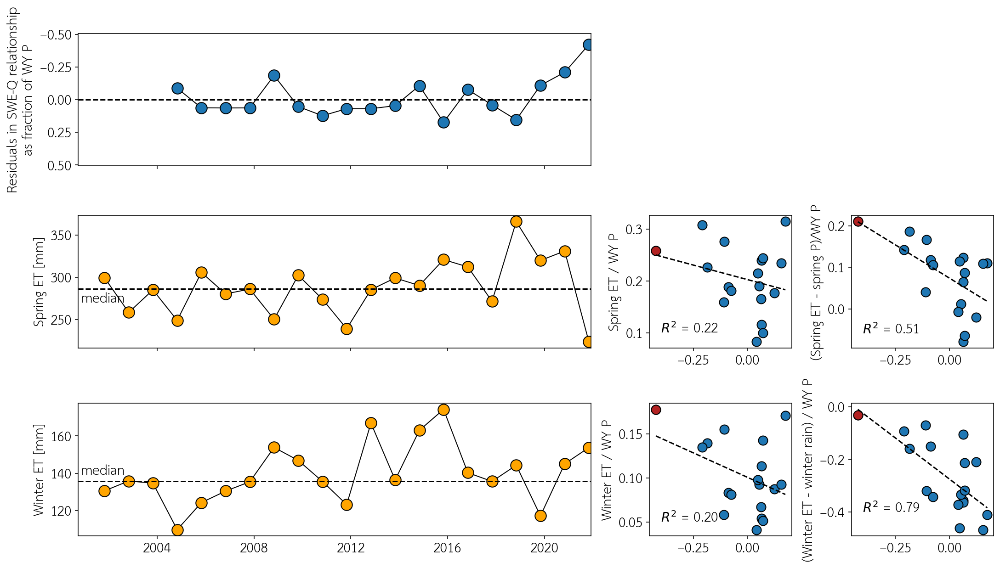

In [ ]:
# plot all together as display figure for one site
import matplotlib.gridspec as gridspec
%matplotlib inline
plt.rcParams.update({'font.size': 14})

def func(x,a,b):
  return a*x+b

size = 150
size1 = 100

fig2 = plt.figure(constrained_layout=True, figsize = (15,8.5))
spec2 = gridspec.GridSpec(ncols=4, nrows=3, figure=fig2)

ax0 = fig2.add_subplot(spec2[1, :2]) 
ax1 = fig2.add_subplot(spec2[2, :2]) 
ax2 = fig2.add_subplot(spec2[0, :2]) 
ax60 = fig2.add_subplot(spec2[1, 2]) 
ax6 = fig2.add_subplot(spec2[2, 2]) 
ax70 = fig2.add_subplot(spec2[1, 3]) 
ax7 = fig2.add_subplot(spec2[2, 3]) 



axs = [[ax0,ax60,ax70],
       [ax1,ax6,ax7],
       [ax2,],
       ]

i=0
for site in [10336676]:
  # ax = axs[0][i]
  station_nm = gages[gages.SITE_NO==str(site)].STATION_NM.values[0]
  df = data[station_nm]
  cumP = df[['P']]
  cumP['wy'] = np.where(cumP.index.month.isin([10,11,12]),
                        cumP.index.year+1,cumP.index.year)
  cumPvals = []
  for wy in cumP.wy.drop_duplicates():
    wyP0 = [0]+list(cumP[cumP.wy==wy].P.cumsum().values)[1:]
    cumPvals = cumPvals + wyP0
  cumP['cumP'] = cumPvals
  modisT_all = modisT[[str(site)]]
  modisT_all['wy'] = np.where(modisT_all.index.month.isin([10,11,12]),
                              modisT_all.index.year+1,modisT_all.index.year)
  modisT_spring = modisT_all[modisT_all.index.month.isin([4,5,6,7])].groupby('wy').mean()
  apr1swe = df.groupby('wy').sum().winter_P
  res_use = residuals[str(site)]/apr1swe

  


  ax = axs[0][i]
  wyP = df.groupby('wy').sum().P
  springET1 = df[df.index.month.isin([4,5,6,7])].groupby('wy').sum().ET_with_modis
  springrain = df.groupby('wy').sum().spring_rain
  divby =(springET1).values[-len(apr1swe):] 
  
  ax.plot(wys[-len(divby):],divby, 
          c='k',lw=1,zorder=-1)
  ax.scatter(wys[-len(divby):],divby, 
             s = size, label = 'Spring ET',
            c='orange',edgecolor = 'k',lw=1)
  medianET = np.nanmedian(divby)
  ax.axhline(medianET,ls='--',c='k',)
  divby = springET1/wyP

  
  if i==0:
    ax.set_ylabel('Spring ET [mm]')
    ax.text(pd.to_datetime('11-1-2000'),270,#medianET*1.05,
            'median')
  # ax1 = ax.twinx()

  # ESIsite = ESI[[str(site)]]
  # ESIsite['wy'] = np.where(ESIsite.index.month.isin([10,11,12]),
  #                         ESIsite.index.year+1,ESIsite.index.year)
  # ESImed = ESIsite[ESIsite.index.month.isin([4,5,6,7])].groupby('wy').median()
  # ax1.plot(wys[-len(ESImed):],ESImed,c='k',lw=1,zorder=-1)
  # ax1.scatter(wys[-len(ESImed):],ESImed,
  #             c='olivedrab',edgecolor = 'k',lw=1,s=size, label = 'ESI')
  # ax1.set_ylabel('Median Spring ESI')
  # ax1.set_ylim(-2.4,2.6)
  # if i==0:
  #   ax.legend(frameon=False,loc='upper left')
  #   ax1.legend(frameon=False,loc='upper left',bbox_to_anchor=(0,0.87))


  
  ax = axs[0][1+i]
  ax.scatter(res_use,divby[-len(res_use):],s=size1,edgecolor = 'k')
  ax.scatter(res_use[-1:],divby[-1:],c='firebrick',s=size1,edgecolor = 'k',label='2021')
  ax.set_ylabel('Spring ET / WY P')

  popt,pcov = curve_fit(func,res_use.values[3:],
                        divby[-len(res_use):][3:],
                        )
  xvals = np.linspace(np.nanmin(res_use),np.nanmax(res_use),5)
  yvals = func(xvals,*popt)
  ax.plot(xvals,yvals,c='k',ls='--')

  yvals = divby[-len(res_use):]
  y_pred = func(res_use,*popt)
  residuals1 = np.array(yvals) - y_pred
  ss_res = np.sum(residuals1**2)
  ss_tot = np.sum((yvals-np.mean(yvals))**2)
  r_squared = 1 - (ss_res / ss_tot)
  ax.text(-0.4,.1,'$R^2$ = '+'%2.2f' % (r_squared))


  
  ax = axs[0][2+i]
  dp = (springET1-springrain)/apr1swe
  ax.scatter(res_use,dp[-len(res_use):],s=size1,edgecolor = 'k')
  ax.scatter(res_use[-1:],dp[-1:],c='firebrick',s=size1,edgecolor = 'k',label='2021')
  ax.set_ylabel('(Spring ET - spring P)/WY P')

  divbyP = dp
  popt,pcov = curve_fit(func,res_use.values[3:],
                        divbyP[-len(res_use):][3:],
                        )
  xvals = np.linspace(np.nanmin(res_use),np.nanmax(res_use),5)
  yvals = func(xvals,*popt)
  ax.plot(xvals,yvals,c='k',ls='--')

  yvals = divbyP[-len(res_use):]
  y_pred = func(res_use,*popt)
  residuals1 = np.array(yvals) - y_pred
  ss_res = np.sum(residuals1**2)
  ss_tot = np.sum((yvals-np.mean(yvals))**2)
  r_squared = 1 - (ss_res / ss_tot)
  ax.text(-0.4,-0.06,'$R^2$ = '+'%2.2f' % (r_squared))


  ax = axs[1][i]
  wyP = df.groupby('wy').sum().P
  winterET1 = df[df.index.month.isin([10,11,12,1,2,3])].groupby('wy').sum().ET_with_modis
  divbyP =(winterET1)/wyP
  ax.plot(wys[-len(divbyP):],winterET1, c='k',lw=1,zorder=-1)
  ax.scatter(wys[-len(divbyP):],winterET1, s = size, label = 'Winter ET',
            c='orange',edgecolor = 'k',lw=1)
  medianP = np.nanmedian(winterET1)
  ax.axhline(medianP,ls='--',c='k',)
  # ax.set_ylim(0.4,0)
  
  if i==0:
    ax.set_ylabel('Winter ET [mm]')
    ax.text(pd.to_datetime('11-1-2000'),1.025*medianP,'median')


  
  ax = axs[1][1+i]
  dp = (winter_rain.ET_with_modis)/wyP
  ax.scatter(res_use,dp[-len(res_use):],s=size1,edgecolor = 'k')
  ax.scatter(res_use[-1:],dp[-1:],c='firebrick',s=size1,edgecolor = 'k',label='2021')
  ax.set_ylabel('Winter ET / WY P')

  divbyP = dp
  popt,pcov = curve_fit(func,res_use.values[3:],
                        divbyP[-len(res_use):][3:],
                        )
  xvals = np.linspace(np.nanmin(res_use),np.nanmax(res_use),5)
  yvals = func(xvals,*popt)
  ax.plot(xvals,yvals,c='k',ls='--')

  yvals = divbyP[-len(res_use):]
  y_pred = func(res_use,*popt)
  residuals1 = np.array(yvals) - y_pred
  ss_res = np.sum(residuals1**2)
  ss_tot = np.sum((yvals-np.mean(yvals))**2)
  r_squared = 1 - (ss_res / ss_tot)
  ax.text(-0.4,0.05,'$R^2$ = '+'%2.2f' % (r_squared))

  ax = axs[1][2+i]
  dp = (winter_rain.ET_with_modis-winter_rain.winter_rain)/wyP
  ax.scatter(res_use,dp[-len(res_use):],s=size1,edgecolor = 'k')
  ax.scatter(res_use[-1:],dp[-1:],c='firebrick',s=size1,edgecolor = 'k',label='2021')
  ax.set_ylabel('(Winter ET - winter rain) / WY P')

  divbyP = dp
  popt,pcov = curve_fit(func,res_use.values[3:],
                        divbyP[-len(res_use):][3:],
                        )
  xvals = np.linspace(np.nanmin(res_use),np.nanmax(res_use),5)
  yvals = func(xvals,*popt)
  ax.plot(xvals,yvals,c='k',ls='--')

  yvals = divbyP[-len(res_use):]
  y_pred = func(res_use,*popt)
  residuals1 = np.array(yvals) - y_pred
  ss_res = np.sum(residuals1**2)
  ss_tot = np.sum((yvals-np.mean(yvals))**2)
  r_squared = 1 - (ss_res / ss_tot)
  ax.text(-0.4,-.4,'$R^2$ = '+'%2.2f' % (r_squared))


  ax = axs[2][i]
  
  ax.scatter(wys[-len(res_use):],res_use, s = size, edgecolor = 'k', lw=1,)
  
  ax.plot(wys[-len(res_use):],res_use, lw = 1, c= 'k',zorder = -1)
  maxres = np.nanmax(abs(res_use))*1.2
  ax.set_ylim(maxres,-maxres)
  ax.axhline(0,ls='--',c='k')
  if i==0:
    ax.set_ylabel('Residuals in SWE-Q relationship\nas fraction of WY P')
  i+=2

for ax in [ax2,ax0,]:
  ax.set_xlim(pd.to_datetime('10-1-2000'),
              pd.to_datetime('12-1-2021'))
  ax.set_xticklabels([])
ax1.set_xlim(pd.to_datetime('10-1-2000'),
              pd.to_datetime('12-1-2021'))



/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stab

(730394.0, 738125.0)

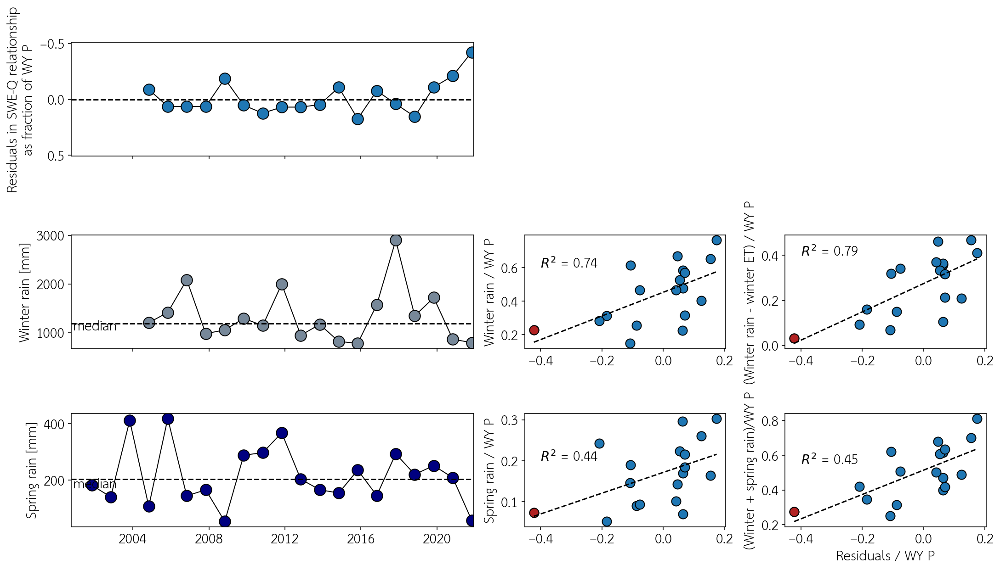

In [ ]:
# plot all together as display figure for one site
import matplotlib.gridspec as gridspec
%matplotlib inline
plt.rcParams.update({'font.size': 14})

def func(x,a,b):
  return a*x+b

size = 150
size1 = 100

fig2 = plt.figure(constrained_layout=True, figsize = (15,8.5))
spec2 = gridspec.GridSpec(ncols=4, nrows=3, figure=fig2)

ax0 = fig2.add_subplot(spec2[1, :2]) 
ax1 = fig2.add_subplot(spec2[2, :2]) 
ax2 = fig2.add_subplot(spec2[0, :2]) 
ax60 = fig2.add_subplot(spec2[1, 2]) 
ax6 = fig2.add_subplot(spec2[2, 2]) 
ax70 = fig2.add_subplot(spec2[1, 3]) 
ax7 = fig2.add_subplot(spec2[2, 3]) 



axs = [[ax0,ax60,ax70],
       [ax1,ax6,ax7],
       [ax2,],
       ]

i=0
for site in [10336676]:
  # ax = axs[0][i]
  station_nm = gages[gages.SITE_NO==str(site)].STATION_NM.values[0]
  df = data[station_nm]
  cumP = df[['P']]
  cumP['wy'] = np.where(cumP.index.month.isin([10,11,12]),
                        cumP.index.year+1,cumP.index.year)
  cumPvals = []
  for wy in cumP.wy.drop_duplicates():
    wyP0 = [0]+list(cumP[cumP.wy==wy].P.cumsum().values)[1:]
    cumPvals = cumPvals + wyP0
  cumP['cumP'] = cumPvals
  modisT_all = modisT[[str(site)]]
  modisT_all['wy'] = np.where(modisT_all.index.month.isin([10,11,12]),
                              modisT_all.index.year+1,modisT_all.index.year)
  modisT_spring = modisT_all[modisT_all.index.month.isin([4,5,6,7])].groupby('wy').mean()
  apr1swe = df.groupby('wy').sum().winter_P
  res_use = residuals[str(site)]/apr1swe

  


  ax = axs[0][i]
  # snowfrac = df.groupby('wy').sum()
  # snowfrac = snowfrac.snowfall/snowfrac.P
  winter_rain = data[station_nm]
  winter_rain = winter_rain[winter_rain.index.month.isin([10,11,12,1,2,3])]
  winter_rain['winter_rain'] = winter_rain.P-winter_rain.snowfall
  winter_rain = winter_rain.groupby('wy').sum()
  ax.scatter(wys[3:],winter_rain.P.iloc[3:], s = size, edgecolor = 'k', lw=1,c='lightslategrey')
  ax.plot(wys[3:],winter_rain.P.iloc[3:],c='k',lw=1,zorder = -1)
  # ax.set_ylim(max(meltrates[site])*1.1,min(meltrates[site])*0.9)
  ax.set_ylabel('Winter rain [mm]')
  snowmed = np.nanmedian(winter_rain.P.iloc[3:])
  ax.axhline(snowmed,ls='--',c='k')
  ax.text(pd.to_datetime('11-1-2000'),1050,'median')
  # ax.set_ylim(3100,500)

  ax = axs[1][2]
  mplot = ((winter_rain.winter_rain+springrain)/wyP).iloc[3:]
  # mplot = np.where(mplot<0,np.nan,mplot)
  ax.scatter(res_use[-len(mplot):],mplot,s=size1,edgecolor = 'k')
  ax.scatter(res_use[-1:],mplot[-1:],c='firebrick',s=size1,edgecolor = 'k')
  ax.set_ylabel('(Winter + spring rain)/WY P')
  
  mask = (np.isfinite(res_use.values[3:])) & (np.isfinite(mplot)) 
  popt,pcov = curve_fit(func,res_use.values[3:][mask],
                        mplot[mask],
                        )
  xvals = np.linspace(np.nanmin(res_use),np.nanmax(res_use),5)
  yvals = func(xvals,*popt)
  ax.plot(xvals,yvals,c='k',ls='--')

  mask1 = (np.isfinite(res_use.values[3:])) & (np.isfinite(mplot)) #& (mplot<1) & (res_use.values[3:]<1)
  yvals = mplot[mask1]
  y_pred = func(res_use[-len(mplot):].values[mask1],*popt)
  residuals1 = np.array(yvals) - y_pred
  ss_res = np.sum(residuals1**2)
  ss_tot = np.sum((yvals-np.mean(yvals))**2)
  r_squared = 1 - (ss_res / ss_tot)
  ax.text(-0.4,0.55,'$R^2$ = '+'%2.2f' % (r_squared))
  # ax.set_ylim(0.6,0.2)
  ax.set_xlabel('Residuals / WY P')


  
  ax = axs[0][1]
  dp = winter_rain.winter_rain/apr1swe
  ax.scatter(res_use,dp[-len(res_use):],s=size1,edgecolor = 'k')
  ax.scatter(res_use[-1:],dp[-1:],c='firebrick',s=size1,edgecolor = 'k',label='2021')
  ax.set_ylabel('Winter rain / WY P')

  divbyP = dp
  popt,pcov = curve_fit(func,res_use.values[3:],
                        divbyP[-len(res_use):][3:],
                        )
  xvals = np.linspace(np.nanmin(res_use),np.nanmax(res_use),5)
  yvals = func(xvals,*popt)
  ax.plot(xvals,yvals,c='k',ls='--')

  yvals = divbyP[-len(res_use):]
  y_pred = func(res_use,*popt)
  residuals1 = np.array(yvals) - y_pred
  ss_res = np.sum(residuals1**2)
  ss_tot = np.sum((yvals-np.mean(yvals))**2)
  r_squared = 1 - (ss_res / ss_tot)
  ax.text(-0.4,0.6,'$R^2$ = '+'%2.2f' % (r_squared))


  ax = axs[1][0]
  wyP = df.groupby('wy').sum().P
  divbyP =(springrain)#/wyP#apr1swe
  ax.plot(wys[-len(divbyP):],divbyP, c='k',lw=1,zorder=-1)
  ax.scatter(wys[-len(divbyP):],divbyP, s = size, 
            c='navy',edgecolor = 'k',lw=1)
  medianP = np.nanmedian(divbyP)
  ax.axhline(medianP,ls='--',c='k',)
  # ax.set_ylim(0.4,0)
  
  if i==0:
    ax.set_ylabel('Spring rain [mm]')
    ax.text(pd.to_datetime('11-1-2000'),0.85*medianP,'median')


  
  ax = axs[1][1]
  dp = (springrain)/apr1swe
  ax.scatter(res_use,dp[-len(res_use):],s=size1,edgecolor = 'k')
  ax.scatter(res_use[-1:],dp[-1:],c='firebrick',s=size1,edgecolor = 'k',label='2021')
  ax.set_ylabel('Spring rain / WY P')

  divbyP = dp
  popt,pcov = curve_fit(func,res_use.values[3:],
                        divbyP[-len(res_use):][3:],
                        )
  xvals = np.linspace(np.nanmin(res_use),np.nanmax(res_use),5)
  yvals = func(xvals,*popt)
  ax.plot(xvals,yvals,c='k',ls='--')

  yvals = divbyP[-len(res_use):]
  y_pred = func(res_use,*popt)
  residuals1 = np.array(yvals) - y_pred
  ss_res = np.sum(residuals1**2)
  ss_tot = np.sum((yvals-np.mean(yvals))**2)
  r_squared = 1 - (ss_res / ss_tot)
  ax.text(-0.4,0.2,'$R^2$ = '+'%2.2f' % (r_squared))

  ax = axs[0][2]
  dp = -(winter_rain.ET_with_modis-winter_rain.winter_rain)/wyP
  ax.scatter(res_use,dp[-len(res_use):],s=size1,edgecolor = 'k')
  ax.scatter(res_use[-1:],dp[-1:],c='firebrick',s=size1,edgecolor = 'k',label='2021')
  ax.set_ylabel('(Winter rain - winter ET) / WY P')

  divbyP = dp
  popt,pcov = curve_fit(func,res_use.values[3:],
                        divbyP[-len(res_use):][3:],
                        )
  xvals = np.linspace(np.nanmin(res_use),np.nanmax(res_use),5)
  yvals = func(xvals,*popt)
  ax.plot(xvals,yvals,c='k',ls='--')

  yvals = divbyP[-len(res_use):]
  y_pred = func(res_use,*popt)
  residuals1 = np.array(yvals) - y_pred
  ss_res = np.sum(residuals1**2)
  ss_tot = np.sum((yvals-np.mean(yvals))**2)
  r_squared = 1 - (ss_res / ss_tot)
  ax.text(-0.4,0.4,'$R^2$ = '+'%2.2f' % (r_squared))

  
  ax = axs[2][i]
  
  ax.scatter(wys[-len(res_use):],res_use, s = size, edgecolor = 'k', lw=1,)
  
  ax.plot(wys[-len(res_use):],res_use, lw = 1, c= 'k',zorder = -1)
  maxres = np.nanmax(abs(res_use))*1.2
  ax.set_ylim(maxres,-maxres)
  ax.axhline(0,ls='--',c='k')
  if i==0:
    ax.set_ylabel('Residuals in SWE-Q relationship\nas fraction of WY P')
  i+=2

for ax in [ax0,ax2,]:
  ax.set_xlim(pd.to_datetime('10-1-2000'),
              pd.to_datetime('12-1-2021'))
  ax.set_xticklabels([])
ax1.set_xlim(pd.to_datetime('10-1-2000'),
              pd.to_datetime('12-1-2021'))



/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stab

(730394.0, 738125.0)

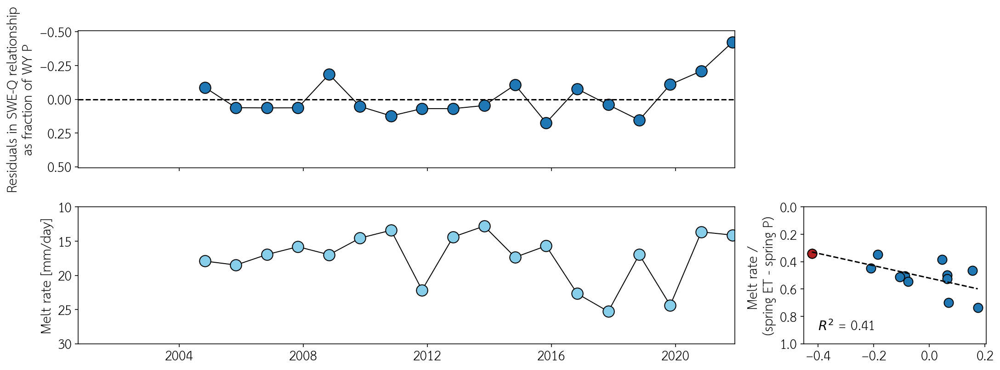

In [ ]:
# plot all together as display figure for one site
import matplotlib.gridspec as gridspec
%matplotlib inline
plt.rcParams.update({'font.size': 14})

def func(x,a,b):
  return a*x+b

size = 150
size1 = 100

fig2 = plt.figure(constrained_layout=True, figsize = (15,5.5))
spec2 = gridspec.GridSpec(ncols=3, nrows=2, figure=fig2)

ax0 = fig2.add_subplot(spec2[0, :2]) 
ax1 = fig2.add_subplot(spec2[1, :2]) 
ax60 = fig2.add_subplot(spec2[1, 2]) 



axs = [[ax0,],
       [ax1,ax60],]

i=0
for site in [10336676]:
  station_nm = gages[gages.SITE_NO==str(site)].STATION_NM.values[0]
  df = data[station_nm]
  cumP = df[['P']]
  cumP['wy'] = np.where(cumP.index.month.isin([10,11,12]),
                        cumP.index.year+1,cumP.index.year)
  cumPvals = []
  for wy in cumP.wy.drop_duplicates():
    wyP0 = [0]+list(cumP[cumP.wy==wy].P.cumsum().values)[1:]
    cumPvals = cumPvals + wyP0
  cumP['cumP'] = cumPvals
  modisT_all = modisT[[str(site)]]
  modisT_all['wy'] = np.where(modisT_all.index.month.isin([10,11,12]),
                              modisT_all.index.year+1,modisT_all.index.year)
  modisT_spring = modisT_all[modisT_all.index.month.isin([4,5,6,7])].groupby('wy').mean()
  apr1swe = df.groupby('wy').sum().winter_P
  res_use = residuals[str(site)]/apr1swe


  ax = axs[1][0]
  ax.scatter(wys[3:],meltrates[site], s = size, edgecolor = 'k', lw=1,c='skyblue')
  ax.plot(wys[3:],meltrates[site],c='k',lw=1,zorder = -1)
  ax.set_ylim(max(meltrates[site])*1.1,min(meltrates[site])*0.9)
  ax.set_ylabel('Melt rate [mm/day]')
  ax.set_ylim(30,10)


  ax = axs[1][1]
  mplot = meltrates[site].values/((springET1-springrain).values[-len(meltrates):]/4)
  mplot = np.where(mplot<0,np.nan,mplot)
  ax.scatter(res_use[-len(mplot):],mplot,s=size1,edgecolor = 'k')
  ax.scatter(res_use[-1:],mplot[-1:],c='firebrick',s=size1,edgecolor = 'k')
  ax.set_ylabel('Melt rate / \n(spring ET - spring P)')
  
  mask = (np.isfinite(res_use.values[3:])) & (np.isfinite(mplot)) & (mplot<1)
  popt,pcov = curve_fit(func,res_use.values[3:][mask],
                        mplot[mask],
                        )
  xvals = np.linspace(np.nanmin(res_use),np.nanmax(res_use),5)
  yvals = func(xvals,*popt)
  ax.plot(xvals,yvals,c='k',ls='--')

  mask1 = (np.isfinite(res_use.values[3:])) & (np.isfinite(mplot)) & (mplot<1) & (res_use.values[3:]<1)
  yvals = mplot[mask1]
  y_pred = func(res_use[-len(mplot):].values[mask1],*popt)
  residuals1 = np.array(yvals) - y_pred
  ss_res = np.sum(residuals1**2)
  ss_tot = np.sum((yvals-np.mean(yvals))**2)
  r_squared = 1 - (ss_res / ss_tot)
  ax.text(-0.4,0.9,'$R^2$ = '+'%2.2f' % (r_squared))
  ax.set_ylim(1,0)


  ax = axs[0][0]
  
  ax.scatter(wys[-len(res_use):],res_use, s = size, edgecolor = 'k', lw=1,)
  
  ax.plot(wys[-len(res_use):],res_use, lw = 1, c= 'k',zorder = -1)
  maxres = np.nanmax(abs(res_use))*1.2
  ax.set_ylim(maxres,-maxres)
  ax.axhline(0,ls='--',c='k')
  if i==0:
    ax.set_ylabel('Residuals in SWE-Q relationship\nas fraction of WY P')
  i+=2

for ax in [ax0]:
  ax.set_xlim(pd.to_datetime('10-1-2000'),
              pd.to_datetime('12-1-2021'))
  ax.set_xticklabels([])
ax1.set_xlim(pd.to_datetime('10-1-2000'),
              pd.to_datetime('12-1-2021'))



/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stab

(730394.0, 738125.0)

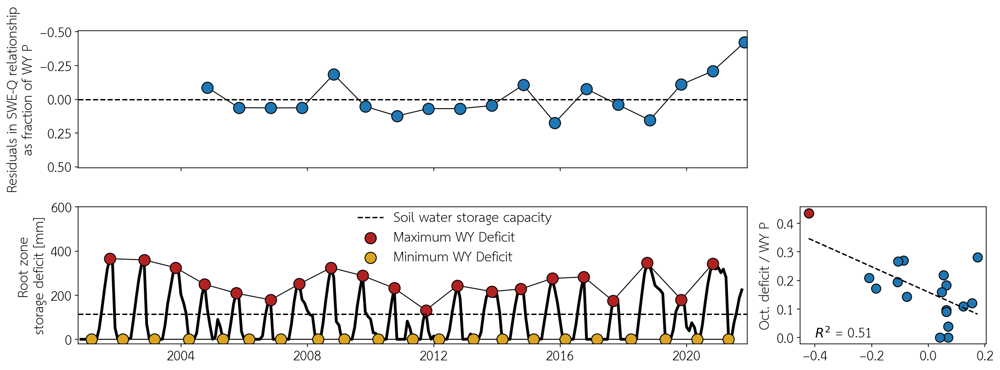

In [ ]:
# plot all together as display figure for one site
import matplotlib.gridspec as gridspec
%matplotlib inline
plt.rcParams.update({'font.size': 14})

def func(x,a,b):
  return a*x+b

size = 150
size1 = 100

fig2 = plt.figure(constrained_layout=True, figsize = (15,5.5))
spec2 = gridspec.GridSpec(ncols=3, nrows=2, figure=fig2)

ax0 = fig2.add_subplot(spec2[0, :2]) 
ax1 = fig2.add_subplot(spec2[1, :2]) 
ax60 = fig2.add_subplot(spec2[1, 2]) 


# ax10 = fig2.add_subplot(spec2[0, 2]) 


axs = [[ax0,],
       [ax1,ax60]]

i=0
for site in [10336676]:

  station_nm = gages[gages.SITE_NO==str(site)].STATION_NM.values[0]
  df = data[station_nm]
  cumP = df[['P']]
  cumP['wy'] = np.where(cumP.index.month.isin([10,11,12]),
                        cumP.index.year+1,cumP.index.year)
  cumPvals = []
  for wy in cumP.wy.drop_duplicates():
    wyP0 = [0]+list(cumP[cumP.wy==wy].P.cumsum().values)[1:]
    cumPvals = cumPvals + wyP0
  cumP['cumP'] = cumPvals
  modisT_all = modisT[[str(site)]]
  modisT_all['wy'] = np.where(modisT_all.index.month.isin([10,11,12]),
                              modisT_all.index.year+1,modisT_all.index.year)
  modisT_spring = modisT_all[modisT_all.index.month.isin([4,5,6,7])].groupby('wy').mean()
  apr1swe = df.groupby('wy').sum().winter_P
  res_use = residuals[str(site)]/apr1swe

  

  ax = axs[1][0]
  ax.plot(df.index,df.D_snodas,zorder = -1,
          c='k',lw=3)
  maxDates = df.loc[df[df.index.month.isin([8,9,10,11,12])].groupby("wy_shift")["D_snodas"].idxmax()].iloc[1:]
  minDates = df.loc[df[df.index.month.isin([2,3,4,5])].groupby("wy")["D_snodas"].idxmin()]

  ax.plot(maxDates.index.values[:-1],maxDates.D_snodas.values[:-1],
           c='k',lw=1,zorder=-1)
  ax.scatter(maxDates.index.values[:-1],maxDates.D_snodas.values[:-1],
             s = size, label = 'Maximum WY Deficit',
            c='firebrick',edgecolor = 'k',lw=1)

  ax.plot(minDates.index,minDates.D_snodas
          , c='k',lw=1,zorder=-1)
  ax.scatter(minDates.index,minDates.D_snodas,
             s = size, label = 'Minimum WY Deficit',
            c='goldenrod',edgecolor = 'k',lw=1)
  ax.axhline(soildepth[str(site)]['b1'],c='k',ls='--',label='Soil water storage capacity')
  if i==0:
    ax.set_ylabel('    Root zone\nstorage deficit [mm]')
    ax.legend(loc='upper left',frameon=False,bbox_to_anchor=(0.4,1.05))
  ax.set_ylim(-20,600)

  ax = axs[1][1]
  Dratio = ((df[df.index.month==10].D_snodas).values)/apr1swe
  ax.scatter(res_use,Dratio,s=size1,edgecolor = 'k')
  ax.scatter(res_use[-1:],Dratio[-1:],c='firebrick',s=size1,edgecolor = 'k')
  ax.set_ylabel('Oct. deficit / WY P')
  popt,pcov = curve_fit(func,res_use.values[3:],
                        Dratio[3:],
                        )
  xvals = np.linspace(np.nanmin(res_use),np.nanmax(res_use),5)
  yvals = func(xvals,*popt)
  ax.plot(xvals,yvals,c='k',ls='--')

  yvals = Dratio
  y_pred = func(res_use,*popt)
  residuals1 = np.array(yvals) - y_pred
  ss_res = np.sum(residuals1**2)
  ss_tot = np.sum((yvals-np.mean(yvals))**2)
  r_squared = 1 - (ss_res / ss_tot)
  ax.text(-0.4,0,'$R^2$ = '+'%2.2f' % (r_squared))


  ax = axs[0][0]
  
  ax.scatter(wys[-len(res_use):],res_use, s = size, edgecolor = 'k', lw=1,)
  
  ax.plot(wys[-len(res_use):],res_use, lw = 1, c= 'k',zorder = -1)
  maxres = np.nanmax(abs(res_use))*1.2
  ax.set_ylim(maxres,-maxres)
  ax.axhline(0,ls='--',c='k')
  if i==0:
    ax.set_ylabel('Residuals in SWE-Q relationship\nas fraction of WY P')
  i+=2

for ax in [ax0]:
  ax.set_xlim(pd.to_datetime('10-1-2000'),
              pd.to_datetime('12-1-2021'))
  ax.set_xticklabels([])
ax1.set_xlim(pd.to_datetime('10-1-2000'),
              pd.to_datetime('12-1-2021'))


## Explore relative importance of parameters

In [ ]:
# import spring streamflow--grabbed from NWIS in other notebook
loc = 'https://raw.githubusercontent.com/lapidesd/CA_missing_freshet/main/Data/spring_streamflow_mm.csv'
springflow = pd.read_csv(loc).set_index('wy')

In [ ]:
i=0

# calculate quantities need to plot in space below

swe_lesset = {site:[] for site in gages.SITE_NO.values}
octD = {site:[] for site in gages.SITE_NO.values}
wintET = {site:[] for site in gages.SITE_NO.values}
smax_site = {site:[] for site in gages.SITE_NO.values}
Qreal = {site:[] for site in gages.SITE_NO.values}

for site in gages.SITE_NO.values:
  station_nm = gages[gages.SITE_NO==str(site)].STATION_NM.values[0]
  df = data[station_nm]
  deficit_term = (df[df.index.month==10].D_snodas).values
  octD[site] = deficit_term
  df_spring = df[df.index.month.isin([4,5,6,7])].groupby('wy').sum()
  swe =  ((df[df.index.month==3].snodas).values)
  sweET = swe - df_spring.ET_with_modis.values + df_spring.spring_rain.values
  swe_lesset[site] = sweET
  df_winter = df[df.index.month.isin([10,11,12,1,2,3])].groupby('wy').sum()
  wET = df_winter.ET_with_modis-df_winter.P+df_winter.snowfall
  wintET[site] = wET
  smax_site[site] = [df.D_snodas.max()]*len(wET)
  Qreal[site] = springflow[site]

# aggregate site-specific quantities to a single list for ease of plotting
sweET_all = []
octD_all = []
wintET_all = []
smax_all = []
Qreal_all = []
for site in octD.keys():
  sweET_all = sweET_all + list(swe_lesset[site])
  octD_all = octD_all + list(octD[site])
  wintET_all = wintET_all + list(wintET[site])
  smax_all = smax_all + list(smax_site[site])
  Qreal_all = Qreal_all + list(Qreal[site])
sweET_all = np.array(sweET_all)
octD_all = np.array(octD_all)
wintET_all = np.array(wintET_all)
smax_all = np.array(smax_all)
Qreal_all = np.array(Qreal_all)

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

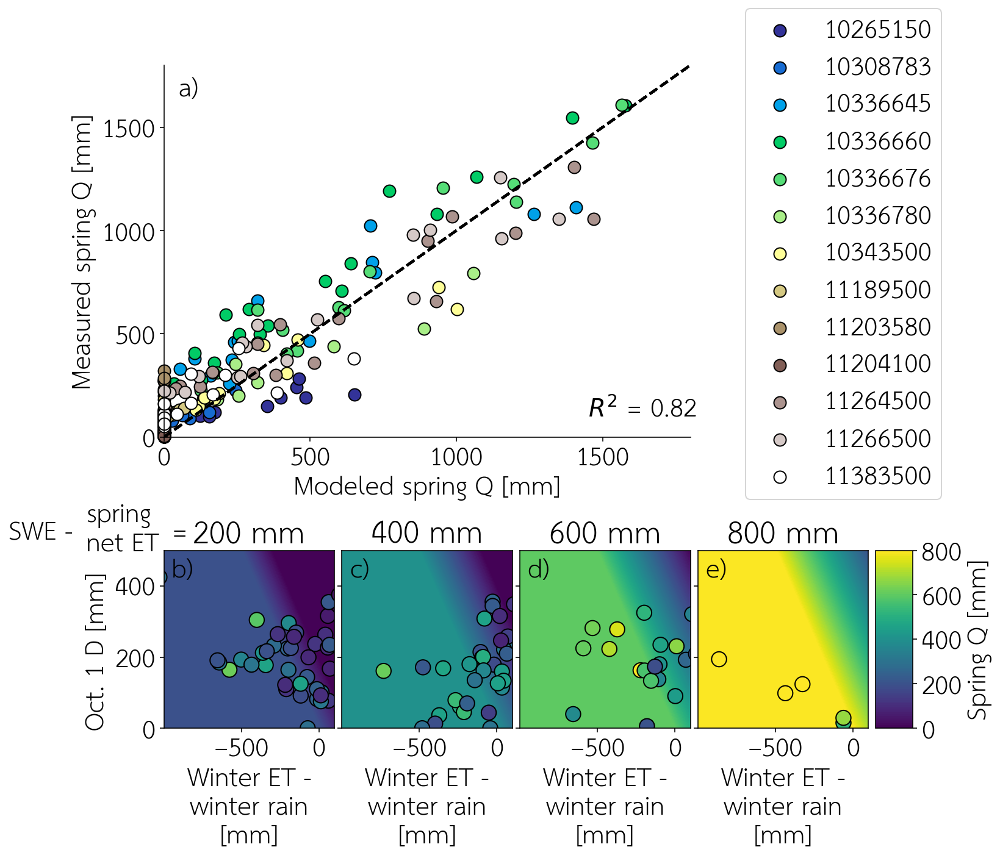

In [ ]:
from matplotlib.gridspec import GridSpec
import matplotlib.cm as cm

# equation to calculate Q via mass balance
def Qeq(swe,springet,octD,winteret):
  # if winter rain - winter ET > October D ...
  result = np.where(-winteret-octD>0,swe-springet,swe-springet-octD-winteret)
  # set negative values to 0 to make heatmap plots come out properly
  result = np.where(result<0,0,result)
  return result

# make a grid of parameter space to explore
swevals = [200,400,600,800]
# smax = [200,400,600,800,]
xmin = -1000
xmax = 100
ymin = 0
ymax = 500
winteretvals = np.linspace(xmin,xmax,100)
octDvals = np.linspace(ymin,ymax,100)

# num = len(smax)

plt.rcParams.update({'font.size': 20})
# set up a gridspec to plot overall model performance above the grid of model space
fig = plt.figure(figsize = (11,10)
)
w=4
h=2
gs = GridSpec(7,17, figure=fig)#13,17
ax0 = fig.add_subplot(gs[:2*h,:3*w])
ax1 = fig.add_subplot(gs[2*h+1:3*h+1, 0*w:w])
ax2 = fig.add_subplot(gs[2*h+1:3*h+1, 1*w:2*w])
ax3 = fig.add_subplot(gs[2*h+1:3*h+1, 2*w:3*w])
ax4 = fig.add_subplot(gs[2*h+1:3*h+1, 3*w:4*w])

cax = fig.add_subplot(gs[2*h+1:3*h+1,16])
axs = [[ax1,ax2,ax3,ax4],
       ]
labels = [['b)','c)','d)','e)'],
          ['f)','g)','h)','i)'],
          ['j)','k)','l)','m)'],
          ['n)','o)','p)','q)']]


# plot heatmap squares
for i in [0]:#range(num):
  for j in range(len(swevals)):
    X,Y = np.meshgrid(winteretvals,octDvals)
    Z = Qeq(swevals[j],0,Y,X)
    ax = axs[i][j]
    vmax=800
    cb = ax.contourf(X,Y,Z,levels=np.linspace(0,vmax,100),vmin = 0)
    # plt.colorbar(cb,ax=ax)
    # if i==num-1:
    ax.set_xlabel('Winter ET -\nwinter rain\n[mm]')
      # ax.set_xticklabels([-500,-300,-100,100])
    if i==0:
      # ax.set_title('Smax = %3.0f' %(smax[j]))
      ax.set_title(#'SWE-spring ET$_{net}$ = 
      '%3.0f mm' %(swevals[j]))
    if j==0:
      # ax.text(-1500,100,'SWE-spring ET = %3.0f' %(swevals[i]),rotation=90)
      ax.set_ylabel('Oct. 1 D [mm]   ')
    else:
      ax.set_yticklabels([])
    # if i!=num-1:
    #   ax.set_xticklabels([])
    ax.set_xlim(xmin,xmax)
    ax.set_xticks([-500,0])
    ax.set_ylim(ymin,ymax)
    if i>1:
      ax.text(xmin*0.95,ymax*0.85,labels[i][j],c='white')
    else:
      ax.text(xmin*0.95,ymax*0.85,labels[i][j],)

    # plot real data into heatmap if it matches the conditions shown in the panel
    mask = (abs(sweET_all-swevals[j])<100) #& (octD_all<500) & (wintET_all>-500) & (wintET_all<100)
    ax.scatter(wintET_all[mask],octD_all[mask],c=Qreal_all[mask],s=150,edgecolor = 'k',vmin = 0,vmax = vmax)
ax1.text(-2000,530,'SWE -')
ax1.text(-1500,500,'spring\nnet ET ')
ax1.text(-950,530,'=')

# plot one colorbar for all panels
cbar = fig.colorbar(cb, cax=cax)#axs.flatten().ravel().tolist(),)
cbar.set_ticks([0,200,400,600,800])
cbar.set_label('Spring Q [mm]')

# plot all site performance at the top
ax = ax0
Qguess_all1 = []
Qreal_all1 = []
colors = cm.terrain(np.linspace(0, 1, 13))#len(Qreal.keys())))
sitelist = list(Qreal.keys())
sitelist.sort()

for ii in range(13):
  s = sitelist[ii]
  Q = Qreal[s]
  Qreal_all1 = Qreal_all1 + list(Q)
  Qguess = Qeq(swe_lesset[s],0,octD[s],wintET[s].values)
  Qguess_all1 = Qguess_all1 + list(Qguess)
  ax.scatter((np.array(Qguess))[3:],np.array(Q[3:]),label=s,clip_on=False,
             s=100,edgecolor = 'k',c = colors[ii])
  ax.plot([0,1800],[0,1800],ls='--',c='k',lw=2)
  ax.legend(loc='lower right',bbox_to_anchor=(1.5,-0.2))

ax.set_xlim(0,1800)
ax.set_ylim(0,1800)
ax.set_xticks(list(range(0,1810,500)))
ax.set_xlabel('Modeled spring Q [mm]')
ax.set_ylabel('Measured spring Q [mm]')

from sklearn.metrics import r2_score
mask = (np.isfinite(Qreal_all1)) & (np.isfinite(Qguess_all1))
r2val = r2_score(np.array(Qreal_all1)[mask],np.array(Qguess_all1)[mask])
ax.text(1450,100,'$R^2$ = '+'%1.2f' %(r2val))
ax.text(50,1650,'a)')

fig.tight_layout()

ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)

plt.savefig('model_comparison.png',fmt='png',dpi=300,bbox_inches='tight')